<a href="https://colab.research.google.com/github/Mirijam1/EfficientNetV2_reproduction/blob/main/Group59_EfficientNetV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Birds dataset

## Preproccessing

### Download data

In [ ]:
# Upload your Kaggle.json here
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


#### Indian bird species dataset

In [ ]:
!pip install -q kaggle
!kaggle datasets download -d arjunbasandrai/25-indian-bird-species-with-226k-images

100% 4.07G/4.07G [02:24<00:00, 36.8MB/s]
100% 4.07G/4.07G [02:24<00:00, 30.4MB/s]


In [ ]:
!unzip 25-indian-bird-species-with-226k-images.zip

Streaming output truncated to the last 5000 lines.
  inflating: training_set/Ruddy Shelduck/ML285073431.jpg  
  inflating: training_set/Ruddy Shelduck/ML285073441.jpg  
  inflating: training_set/Ruddy Shelduck/ML285073471.jpg  
  inflating: training_set/Ruddy Shelduck/ML285308851.jpg  
  inflating: training_set/Ruddy Shelduck/ML285974291.jpg  
  inflating: training_set/Ruddy Shelduck/ML286028601.jpg  
  inflating: training_set/Ruddy Shelduck/ML286515491.jpg  
  inflating: training_set/Ruddy Shelduck/ML286585111.jpg  
  inflating: training_set/Ruddy Shelduck/ML288186461.jpg  
  inflating: training_set/Ruddy Shelduck/ML288194981.jpg  
  inflating: training_set/Ruddy Shelduck/ML289170221.jpg  
  inflating: training_set/Ruddy Shelduck/ML291043411.jpg  
  inflating: training_set/Ruddy Shelduck/ML291399111.jpg  
  inflating: training_set/Ruddy Shelduck/ML291400271.jpg  
  inflating: training_set/Ruddy Shelduck/ML291402041.jpg  
  inflating: training_set/Ruddy Shelduck/ML291402071.jpg  
  inf

### Format training data

In [ ]:
import os
import numpy as np
from PIL import Image

data_list = []
label_list = []

for subdir, dirs, files in os.walk("./training_set"):
    for i,file in enumerate(files):
        # check if the file is an image file
        if i < 100 and file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith("png"):
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            
            # Open the image using Pillow library
            img_path = os.path.join(subdir, file)
            img = Image.open(img_path)
            
            # Convert the image to a numpy array and add it to the data list
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Add the label to the label list
            label_list.append(label)

# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

<ipython-input-15-255913003f70>:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
print(np.shape(data_list))
print(np.shape(data_array))
print(np.shape(label_array))

(2500,)
(2500,)
(2500,)


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:2007: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


### Split into train and test set

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split

def split_data(data, labels, test_size=0.2, random_state=42):
    """
    Splits the input data and labels arrays into a training and test set.

    Args:
    - data (numpy array): the input data array
    - labels (numpy array): the corresponding label array
    - test_size (float, optional): the proportion of the dataset to include in the test split (default=0.2)
    - random_state (int, optional): the seed used by the random number generator (default=42)

    Returns:
    - X_train (numpy array): the training data
    - X_test (numpy array): the test data
    - y_train (numpy array): the training labels
    - y_test (numpy array): the test labels
    """

    # Split the data and labels into a training and test set
    X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=test_size, random_state=random_state)

    return X_train, X_test, y_train, y_test

In [ ]:
import torch
from torch.utils.data import TensorDataset
import numpy as np
from PIL import Image
import torchvision.models as models
from torchvision.transforms import transforms

def transform_dataset(X, y, size=32):
    """
    Transforms a list of numpy arrays containing images of different sizes into a PyTorch TensorDataset object.

    Args:
        X (list of numpy arrays): List of input images.
        y (list or numpy array): List or numpy array of corresponding labels.
        size (int): Size of the output images. Default is 32.

    Returns:
        TensorDataset: PyTorch TensorDataset object containing the transformed images and labels.
    """
    # Define a transformation pipeline to resize the images to a fixed size and convert them to tensors
    transform = transforms.Compose([
        transforms.Resize((size, size)),  # Resize the images to size x size
        transforms.ToTensor()            # Convert the images to PyTorch tensors
    ])
    # transform = models.EfficientNet_v2_s_Weights.DEFAULT.transform()

    # Define empty arrays to store the transformed images and labels
    X_transformed = []
    y_transformed = []

    # Loop over each image in X and apply the transformation pipeline
    for i in range(len(X)):
        # Convert the numpy array to a PIL image
        img = Image.fromarray(np.uint8(X[i]))
        # Apply the transformation pipeline to the image
        img_transformed = transform(img)

        # Append the transformed image and its corresponding label to the output arrays
        X_transformed.append(img_transformed)

    # Convert the labels to a NumPy array of integers
    classes = np.unique(y)
    y_transformed = np.searchsorted(classes, y)
    print("y_transformed ", np.shape(y_transformed))

    X_transformed_new = []
    y_transformed_new = []
    for i in range(len(X_transformed)):
      if(X_transformed[i].shape[0] == 3):
        X_transformed_new.append(X_transformed[i])
        y_transformed_new.append(y_transformed[i])
      else:
        print("Deleted ", i)

    print("X_transformed_new ", np.shape(X_transformed_new))
    print("y_transformed_new ", np.shape(y_transformed_new))

    # Convert the output arrays to PyTorch tensors
    X_transformed = torch.stack(X_transformed_new)
    y_transformed = torch.tensor(y_transformed_new)

    print("X_transformed final ", np.shape(X_transformed))
    print("y_transformed final ", np.shape(y_transformed))

    # Create a PyTorch TensorDataset object
    dataset = TensorDataset(X_transformed, y_transformed)

    return dataset

## Training 


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import TensorDataset, DataLoader
from torchvision.transforms import ToTensor
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

In [ ]:
## Setup
X_train, X_test, y_train, y_test = split_data(data_array, label_array)
num_classes = len(np.unique(y_train))
learning_rate = 0.001

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataset = transform_dataset(X_train, y_train)
test_dataset = transform_dataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)


y_transformed  (2000,)
Deleted  74
Deleted  781
Deleted  1015
Deleted  1176
Deleted  1358
X_transformed_new  (1995,)
y_transformed_new  (1995,)
X_transformed final  torch.Size([1995, 3, 32, 32])
y_transformed final  torch.Size([1995])


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:2007: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  result = asarray(a).shape


y_transformed  (500,)
X_transformed_new  (500,)
y_transformed_new  (500,)
X_transformed final  torch.Size([500, 3, 32, 32])
y_transformed final  torch.Size([500])


In [ ]:
def train(model, dataloader, device, optimizer, criterion):
    """
    Trains network for one epoch in batches.

    Args:
        model: Neural network model.
        dataloader: Data loader for training set.
        optimizer: Optimizer (e.g. SGD).
        criterion: Loss function (e.g. cross-entropy loss).
    """
  
    correct = 0
    total = 0
    running_loss = 0

    model.train()
    for inputs, labels in tqdm(dataloader, desc='Training', leave=False):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = inputs.to(device), labels.to(device)
        
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        # keep track of loss and accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        running_loss += loss.item()

    accuracy = 100 * correct / total
    avg_loss = running_loss / len(dataloader)
    return accuracy, avg_loss

def test(model, dataloader, device, criterion):
    """
    Evaluates network in batches.

    Args:
        model: Neural network model.
        dataloader: Data loader for test set.
        criterion: Loss function (e.g. cross-entropy loss).
    """
    correct = 0
    total = 0
    running_loss = 0

    model.eval()
    # Use torch.no_grad to skip gradient calculation, not needed for evaluation
    with torch.no_grad():
        # iterate through batches
        for inputs, labels in tqdm(dataloader, desc='Testing', leave=False):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = inputs.to(device), labels.to(device)

            # forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # keep track of loss and accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            running_loss += loss.item()

    accuracy = 100 * correct / total
    avg_loss = running_loss / len(dataloader)
    return accuracy, avg_loss

In [ ]:
# Create a writer to write to Tensorboard
# writer = SummaryWriter()

def train_and_test(model, train_loader, test_loader, device, num_classes=2, learning_rate=0.0001, epochs=350, patience_optim=10, patience=35):

    # Optimizer, loss function, and learning rate scheduler
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=patience_optim, verbose=True)

    best_accuracy = 0
    train_accuracies = []
    test_accuracies = []

    torch.cuda.empty_cache()
    epochs_without_improvement = 0
    stop = False

    for epoch in range(epochs):
        train_accuracy, train_loss = train(model, train_loader, device, optimizer, criterion)
        test_accuracy, test_loss = test(model, test_loader, device, criterion)

        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)

        print(f'Epoch {epoch+1}:')
        print(f'Train Accuracy: {train_accuracy:.2f}%, Train Loss: {train_loss:.4f}')
        print(f'Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')

        scheduler.step(test_accuracy)

        # Early stopping logic
        if test_accuracy > best_accuracy:
            best_accuracy = test_accuracy
            if epoch > 150:
              epochs_without_improvement = 0
        elif epoch > 150:
            epochs_without_improvement += 1

        if epochs_without_improvement >= patience :
        #   stop = True
        # if stop and epoch>150:
          print(f"Early stopping after {patience} epochs without improvement.")
          break
    
        # Write metrics to Tensorboard
        # writer.add_scalars("Loss", {'Train': train_loss, 'Test':test_loss}, epoch)            
        # writer.add_scalars('Accuracy', {'Train': train_accuracy,'Test':np.array(test_accuracies)} , epoch)

    print(f'Best Test Accuracy: {best_accuracy:.2f}%')
    return best_accuracy, train_accuracies, test_accuracies

# writer.flush()
# writer.close()

### No weights, 32x32 images 



In [ ]:
# Model definition
model = models.efficientnet_v2_s(weights=None, num_classes=num_classes).to(device)

best_test_accuracy, train_accuracies, test_accuracies = train_and_test(model, train_loader, test_loader, device, num_classes, learning_rate=0.0001, epochs=350, patience_optim=10, patience=50)

Epoch 1:
Train Accuracy: 5.06%, Train Loss: 4.6141
Test Accuracy: 4.20%, Test Loss: 3.2183


Epoch 2:
Train Accuracy: 4.61%, Train Loss: 4.3987
Test Accuracy: 5.40%, Test Loss: 3.2186


Epoch 3:
Train Accuracy: 4.81%, Train Loss: 4.3020
Test Accuracy: 5.40%, Test Loss: 3.2225


Epoch 4:
Train Accuracy: 5.21%, Train Loss: 4.0519
Test Accuracy: 5.40%, Test Loss: 3.2195


Epoch 5:
Train Accuracy: 5.31%, Train Loss: 4.1825
Test Accuracy: 3.20%, Test Loss: 3.4537


Epoch 6:
Train Accuracy: 5.11%, Train Loss: 4.0330
Test Accuracy: 3.00%, Test Loss: 4.0828


Epoch 7:
Train Accuracy: 5.31%, Train Loss: 3.9597
Test Accuracy: 3.40%, Test Loss: 4.1737


Epoch 8:
Train Accuracy: 5.16%, Train Loss: 3.9610
Test Accuracy: 3.80%, Test Loss: 4.4019


Epoch 9:
Train Accuracy: 4.36%, Train Loss: 3.9548
Test Accuracy: 4.60%, Test Loss: 4.0571


Epoch 10:
Train Accuracy: 4.91%, Train Loss: 3.9635
Test Accuracy: 4.60%, Test Loss: 4.8388


Epoch 11:
Train Accuracy: 4.81%, Train Loss: 3.8638
Test Accuracy: 3.80%, Test Loss: 3.8365


Epoch 12:
Train Accuracy: 4.86%, Train Loss: 3.9199
Test Accuracy: 4.60%, Test Loss: 4.7754


Epoch 13:
Train Accuracy: 5.71%, Train Loss: 3.8325
Test Accuracy: 4.40%, Test Loss: 4.5100
Epoch 00013: reducing learning rate of group 0 to 1.0000e-05.


Epoch 14:
Train Accuracy: 4.21%, Train Loss: 3.9395
Test Accuracy: 4.60%, Test Loss: 4.0800


Epoch 15:
Train Accuracy: 5.36%, Train Loss: 3.7739
Test Accuracy: 4.40%, Test Loss: 3.9914


Epoch 16:
Train Accuracy: 5.91%, Train Loss: 3.7632
Test Accuracy: 4.40%, Test Loss: 4.0502


Epoch 17:
Train Accuracy: 5.16%, Train Loss: 3.8465
Test Accuracy: 3.80%, Test Loss: 4.0022


Epoch 18:
Train Accuracy: 5.11%, Train Loss: 3.7719
Test Accuracy: 3.20%, Test Loss: 3.9020


Epoch 19:
Train Accuracy: 4.46%, Train Loss: 3.7936
Test Accuracy: 4.00%, Test Loss: 4.2774


Epoch 20:
Train Accuracy: 3.91%, Train Loss: 3.8666
Test Accuracy: 4.20%, Test Loss: 3.9809


Epoch 21:
Train Accuracy: 4.76%, Train Loss: 3.7797
Test Accuracy: 3.60%, Test Loss: 3.7523


Epoch 22:
Train Accuracy: 6.32%, Train Loss: 3.8491
Test Accuracy: 4.60%, Test Loss: 3.9150


Epoch 23:
Train Accuracy: 4.96%, Train Loss: 3.7461
Test Accuracy: 4.20%, Test Loss: 4.0810


Epoch 24:
Train Accuracy: 5.81%, Train Loss: 3.8274
Test Accuracy: 3.80%, Test Loss: 4.1180
Epoch 00024: reducing learning rate of group 0 to 1.0000e-06.


Epoch 25:
Train Accuracy: 4.76%, Train Loss: 3.7263
Test Accuracy: 4.20%, Test Loss: 4.5125


Epoch 26:
Train Accuracy: 4.86%, Train Loss: 3.7873
Test Accuracy: 3.00%, Test Loss: 4.0329


Epoch 27:
Train Accuracy: 5.16%, Train Loss: 3.8645
Test Accuracy: 4.00%, Test Loss: 3.9038


Epoch 28:
Train Accuracy: 4.51%, Train Loss: 3.6996
Test Accuracy: 4.60%, Test Loss: 4.3774


Epoch 29:
Train Accuracy: 5.66%, Train Loss: 3.8245
Test Accuracy: 3.80%, Test Loss: 5.0314


Epoch 30:
Train Accuracy: 5.56%, Train Loss: 3.7858
Test Accuracy: 5.00%, Test Loss: 4.0977


Epoch 31:
Train Accuracy: 5.01%, Train Loss: 3.8751
Test Accuracy: 3.80%, Test Loss: 4.3521


Epoch 32:
Train Accuracy: 5.31%, Train Loss: 3.7038
Test Accuracy: 4.80%, Test Loss: 4.2818


Epoch 33:
Train Accuracy: 4.71%, Train Loss: 3.8392
Test Accuracy: 4.00%, Test Loss: 4.7126


Epoch 34:
Train Accuracy: 4.56%, Train Loss: 3.7714
Test Accuracy: 4.80%, Test Loss: 4.1903


Epoch 35:
Train Accuracy: 5.06%, Train Loss: 3.8012
Test Accuracy: 4.20%, Test Loss: 3.9451
Epoch 00035: reducing learning rate of group 0 to 1.0000e-07.


Epoch 36:
Train Accuracy: 4.81%, Train Loss: 3.7485
Test Accuracy: 4.20%, Test Loss: 3.9147


Epoch 37:
Train Accuracy: 5.11%, Train Loss: 3.7760
Test Accuracy: 4.60%, Test Loss: 3.7879


Epoch 38:
Train Accuracy: 5.11%, Train Loss: 3.7593
Test Accuracy: 3.60%, Test Loss: 3.9767


Epoch 39:
Train Accuracy: 5.51%, Train Loss: 3.7243
Test Accuracy: 5.00%, Test Loss: 4.3168


Epoch 40:
Train Accuracy: 5.06%, Train Loss: 3.8175
Test Accuracy: 4.80%, Test Loss: 3.9678


Epoch 41:
Train Accuracy: 5.86%, Train Loss: 3.8010
Test Accuracy: 4.40%, Test Loss: 4.0816


Epoch 42:
Train Accuracy: 5.66%, Train Loss: 3.7905
Test Accuracy: 4.60%, Test Loss: 3.8218


Epoch 43:
Train Accuracy: 4.81%, Train Loss: 3.6824
Test Accuracy: 3.80%, Test Loss: 4.0713


Epoch 44:
Train Accuracy: 4.61%, Train Loss: 3.7953
Test Accuracy: 3.60%, Test Loss: 4.4218


Epoch 45:
Train Accuracy: 5.51%, Train Loss: 3.9132
Test Accuracy: 4.80%, Test Loss: 4.2095


Epoch 46:
Train Accuracy: 6.17%, Train Loss: 3.7610
Test Accuracy: 4.40%, Test Loss: 4.3622
Epoch 00046: reducing learning rate of group 0 to 1.0000e-08.


Epoch 47:
Train Accuracy: 4.71%, Train Loss: 3.7091
Test Accuracy: 4.20%, Test Loss: 4.2074


Epoch 48:
Train Accuracy: 5.06%, Train Loss: 3.7841
Test Accuracy: 4.00%, Test Loss: 4.0249


Epoch 49:
Train Accuracy: 6.12%, Train Loss: 3.8139
Test Accuracy: 4.80%, Test Loss: 3.9562


Epoch 50:
Train Accuracy: 4.51%, Train Loss: 3.7720
Test Accuracy: 4.00%, Test Loss: 4.1088


Epoch 51:
Train Accuracy: 5.06%, Train Loss: 3.7428
Test Accuracy: 3.40%, Test Loss: 4.1056


Epoch 52:
Train Accuracy: 5.91%, Train Loss: 3.7771
Test Accuracy: 3.40%, Test Loss: 4.1648


Epoch 53:
Train Accuracy: 6.32%, Train Loss: 3.8053
Test Accuracy: 3.80%, Test Loss: 3.8969


Epoch 54:
Train Accuracy: 4.86%, Train Loss: 3.7331
Test Accuracy: 4.20%, Test Loss: 4.0639


Epoch 55:
Train Accuracy: 5.21%, Train Loss: 3.6636
Test Accuracy: 4.60%, Test Loss: 3.9092


Epoch 56:
Train Accuracy: 6.37%, Train Loss: 3.7561
Test Accuracy: 4.60%, Test Loss: 4.0951


Epoch 57:
Train Accuracy: 5.16%, Train Loss: 3.8058
Test Accuracy: 4.40%, Test Loss: 3.9974


Epoch 58:
Train Accuracy: 5.21%, Train Loss: 3.8097
Test Accuracy: 3.60%, Test Loss: 4.1637


Epoch 59:
Train Accuracy: 5.71%, Train Loss: 3.8910
Test Accuracy: 3.20%, Test Loss: 4.1770


Epoch 60:
Train Accuracy: 5.76%, Train Loss: 3.7813
Test Accuracy: 4.60%, Test Loss: 3.9557


Epoch 61:
Train Accuracy: 5.51%, Train Loss: 3.7794
Test Accuracy: 4.20%, Test Loss: 3.9881


Epoch 62:
Train Accuracy: 5.21%, Train Loss: 3.8364
Test Accuracy: 3.80%, Test Loss: 4.1884


Epoch 63:
Train Accuracy: 5.21%, Train Loss: 3.8685
Test Accuracy: 3.60%, Test Loss: 4.2334


Epoch 64:
Train Accuracy: 5.86%, Train Loss: 3.7641
Test Accuracy: 4.60%, Test Loss: 3.8979


Epoch 65:
Train Accuracy: 4.31%, Train Loss: 3.8278
Test Accuracy: 4.00%, Test Loss: 4.2034


Epoch 66:
Train Accuracy: 5.11%, Train Loss: 3.8409
Test Accuracy: 3.60%, Test Loss: 3.9122


Epoch 67:
Train Accuracy: 5.46%, Train Loss: 3.7803
Test Accuracy: 5.00%, Test Loss: 3.8231


Epoch 68:
Train Accuracy: 5.86%, Train Loss: 3.7580
Test Accuracy: 3.80%, Test Loss: 3.9579


Epoch 69:
Train Accuracy: 5.31%, Train Loss: 3.8053
Test Accuracy: 4.20%, Test Loss: 3.8928


Epoch 70:
Train Accuracy: 5.11%, Train Loss: 3.7458
Test Accuracy: 3.80%, Test Loss: 3.8211


Epoch 71:
Train Accuracy: 4.76%, Train Loss: 3.7275
Test Accuracy: 4.00%, Test Loss: 4.0591


Epoch 72:
Train Accuracy: 4.46%, Train Loss: 3.8838
Test Accuracy: 4.20%, Test Loss: 3.8664


Epoch 73:
Train Accuracy: 4.31%, Train Loss: 3.8214
Test Accuracy: 4.20%, Test Loss: 4.1905


Epoch 74:
Train Accuracy: 4.66%, Train Loss: 3.8491
Test Accuracy: 6.00%, Test Loss: 4.1378


Epoch 75:
Train Accuracy: 5.51%, Train Loss: 3.8209
Test Accuracy: 3.80%, Test Loss: 4.2337


Epoch 76:
Train Accuracy: 5.26%, Train Loss: 3.7764
Test Accuracy: 4.00%, Test Loss: 3.6941


Epoch 77:
Train Accuracy: 5.96%, Train Loss: 3.7068
Test Accuracy: 4.20%, Test Loss: 4.0441


Epoch 78:
Train Accuracy: 4.86%, Train Loss: 3.8154
Test Accuracy: 3.80%, Test Loss: 4.3253


Epoch 79:
Train Accuracy: 5.41%, Train Loss: 3.7796
Test Accuracy: 3.60%, Test Loss: 3.9817


Epoch 80:
Train Accuracy: 6.17%, Train Loss: 3.8345
Test Accuracy: 3.80%, Test Loss: 4.0239


Epoch 81:
Train Accuracy: 5.26%, Train Loss: 3.6851
Test Accuracy: 4.60%, Test Loss: 4.1190


Epoch 82:
Train Accuracy: 5.21%, Train Loss: 3.8163
Test Accuracy: 4.40%, Test Loss: 4.1797


Epoch 83:
Train Accuracy: 5.16%, Train Loss: 3.7624
Test Accuracy: 4.20%, Test Loss: 3.7021


Epoch 84:
Train Accuracy: 5.96%, Train Loss: 3.7404
Test Accuracy: 4.40%, Test Loss: 4.1516


Epoch 85:
Train Accuracy: 5.01%, Train Loss: 3.8320
Test Accuracy: 3.80%, Test Loss: 3.7886


Epoch 86:
Train Accuracy: 6.07%, Train Loss: 3.8194
Test Accuracy: 3.60%, Test Loss: 3.8623


Epoch 87:
Train Accuracy: 5.56%, Train Loss: 3.8033
Test Accuracy: 4.00%, Test Loss: 4.0426


Epoch 88:
Train Accuracy: 5.01%, Train Loss: 3.7767
Test Accuracy: 3.60%, Test Loss: 3.8322


Epoch 89:
Train Accuracy: 5.11%, Train Loss: 3.8437
Test Accuracy: 4.40%, Test Loss: 3.6527


Epoch 90:
Train Accuracy: 5.21%, Train Loss: 3.7935
Test Accuracy: 4.80%, Test Loss: 3.9336


Epoch 91:
Train Accuracy: 5.16%, Train Loss: 3.7260
Test Accuracy: 3.40%, Test Loss: 4.1150


Epoch 92:
Train Accuracy: 4.86%, Train Loss: 3.8614
Test Accuracy: 4.00%, Test Loss: 3.9820


Epoch 93:
Train Accuracy: 5.26%, Train Loss: 3.7752
Test Accuracy: 4.20%, Test Loss: 4.2827


Epoch 94:
Train Accuracy: 6.22%, Train Loss: 3.7435
Test Accuracy: 4.40%, Test Loss: 3.9195


Epoch 95:
Train Accuracy: 4.66%, Train Loss: 3.7879
Test Accuracy: 4.40%, Test Loss: 3.7182


Epoch 96:
Train Accuracy: 5.41%, Train Loss: 3.7397
Test Accuracy: 3.80%, Test Loss: 3.6925


Epoch 97:
Train Accuracy: 5.61%, Train Loss: 3.7010
Test Accuracy: 4.00%, Test Loss: 3.6689


Epoch 98:
Train Accuracy: 5.81%, Train Loss: 3.7899
Test Accuracy: 3.60%, Test Loss: 3.7465


Epoch 99:
Train Accuracy: 4.81%, Train Loss: 3.8343
Test Accuracy: 4.80%, Test Loss: 4.2428


Epoch 100:
Train Accuracy: 4.21%, Train Loss: 3.8469
Test Accuracy: 3.60%, Test Loss: 4.1262


Epoch 101:
Train Accuracy: 5.51%, Train Loss: 3.7005
Test Accuracy: 4.80%, Test Loss: 3.9079


Epoch 102:
Train Accuracy: 5.11%, Train Loss: 3.8045
Test Accuracy: 4.00%, Test Loss: 3.9662


Epoch 103:
Train Accuracy: 5.31%, Train Loss: 3.7280
Test Accuracy: 4.20%, Test Loss: 4.1053


Epoch 104:
Train Accuracy: 4.96%, Train Loss: 3.7633
Test Accuracy: 4.80%, Test Loss: 4.1737


Epoch 105:
Train Accuracy: 5.31%, Train Loss: 3.7557
Test Accuracy: 4.80%, Test Loss: 4.2248


Epoch 106:
Train Accuracy: 5.61%, Train Loss: 3.8283
Test Accuracy: 3.80%, Test Loss: 4.2628


Epoch 107:
Train Accuracy: 5.51%, Train Loss: 3.7514
Test Accuracy: 5.00%, Test Loss: 3.8944


Epoch 108:
Train Accuracy: 4.61%, Train Loss: 3.8071
Test Accuracy: 4.40%, Test Loss: 3.9778


Epoch 109:
Train Accuracy: 6.17%, Train Loss: 3.7553
Test Accuracy: 4.60%, Test Loss: 4.0969


Epoch 110:
Train Accuracy: 4.41%, Train Loss: 3.7903
Test Accuracy: 4.20%, Test Loss: 4.0678


Epoch 111:
Train Accuracy: 4.21%, Train Loss: 3.8032
Test Accuracy: 4.00%, Test Loss: 4.0803


Epoch 112:
Train Accuracy: 5.96%, Train Loss: 3.7218
Test Accuracy: 3.60%, Test Loss: 3.8912


Epoch 113:
Train Accuracy: 4.96%, Train Loss: 3.8470
Test Accuracy: 4.60%, Test Loss: 3.9729


Epoch 114:
Train Accuracy: 6.02%, Train Loss: 3.8767
Test Accuracy: 4.00%, Test Loss: 4.0955


Epoch 115:
Train Accuracy: 4.51%, Train Loss: 3.8360
Test Accuracy: 3.20%, Test Loss: 4.6102


Epoch 116:
Train Accuracy: 4.81%, Train Loss: 3.7768
Test Accuracy: 4.20%, Test Loss: 4.0617


Epoch 117:
Train Accuracy: 5.96%, Train Loss: 3.7520
Test Accuracy: 4.60%, Test Loss: 4.1669


Epoch 118:
Train Accuracy: 4.81%, Train Loss: 3.6414
Test Accuracy: 4.00%, Test Loss: 4.6156


Epoch 119:
Train Accuracy: 6.02%, Train Loss: 3.8277
Test Accuracy: 4.20%, Test Loss: 4.0459


Epoch 120:
Train Accuracy: 5.16%, Train Loss: 3.8300
Test Accuracy: 4.20%, Test Loss: 4.1084


Epoch 121:
Train Accuracy: 5.71%, Train Loss: 3.7939
Test Accuracy: 4.60%, Test Loss: 3.7855


Epoch 122:
Train Accuracy: 5.21%, Train Loss: 3.8080
Test Accuracy: 3.60%, Test Loss: 4.0016


Epoch 123:
Train Accuracy: 6.07%, Train Loss: 3.8107
Test Accuracy: 3.80%, Test Loss: 4.0753


Epoch 124:
Train Accuracy: 5.61%, Train Loss: 3.8069
Test Accuracy: 4.00%, Test Loss: 4.1031


Epoch 125:
Train Accuracy: 5.06%, Train Loss: 3.8230
Test Accuracy: 5.00%, Test Loss: 3.7922


Epoch 126:
Train Accuracy: 4.71%, Train Loss: 3.7824
Test Accuracy: 4.40%, Test Loss: 3.8923


Epoch 127:
Train Accuracy: 5.06%, Train Loss: 3.8125
Test Accuracy: 4.00%, Test Loss: 4.6020


Epoch 128:
Train Accuracy: 5.46%, Train Loss: 3.7765
Test Accuracy: 3.60%, Test Loss: 4.3390


Epoch 129:
Train Accuracy: 5.51%, Train Loss: 3.6931
Test Accuracy: 3.60%, Test Loss: 4.0841


Epoch 130:
Train Accuracy: 4.71%, Train Loss: 3.6981
Test Accuracy: 4.40%, Test Loss: 4.0170


Epoch 131:
Train Accuracy: 5.31%, Train Loss: 3.8453
Test Accuracy: 5.00%, Test Loss: 4.2032


Epoch 132:
Train Accuracy: 5.56%, Train Loss: 3.7584
Test Accuracy: 4.40%, Test Loss: 4.1112


Epoch 133:
Train Accuracy: 4.81%, Train Loss: 3.7925
Test Accuracy: 3.80%, Test Loss: 3.8360


Epoch 134:
Train Accuracy: 5.46%, Train Loss: 3.8536
Test Accuracy: 3.80%, Test Loss: 3.9548


Epoch 135:
Train Accuracy: 5.41%, Train Loss: 3.8788
Test Accuracy: 3.80%, Test Loss: 4.1511


Epoch 136:
Train Accuracy: 5.36%, Train Loss: 3.7716
Test Accuracy: 3.60%, Test Loss: 3.9419


Epoch 137:
Train Accuracy: 6.27%, Train Loss: 3.7553
Test Accuracy: 4.60%, Test Loss: 4.2479


Epoch 138:
Train Accuracy: 4.91%, Train Loss: 3.7703
Test Accuracy: 4.20%, Test Loss: 3.8945


Epoch 139:
Train Accuracy: 5.76%, Train Loss: 3.7491
Test Accuracy: 4.20%, Test Loss: 3.8694


Epoch 140:
Train Accuracy: 5.46%, Train Loss: 3.7638
Test Accuracy: 3.80%, Test Loss: 3.9716


Epoch 141:
Train Accuracy: 5.21%, Train Loss: 3.8725
Test Accuracy: 3.80%, Test Loss: 4.0347


Epoch 142:
Train Accuracy: 5.51%, Train Loss: 3.7396
Test Accuracy: 4.40%, Test Loss: 4.1179


Epoch 143:
Train Accuracy: 4.51%, Train Loss: 3.7817
Test Accuracy: 3.20%, Test Loss: 3.6511


Epoch 144:
Train Accuracy: 5.51%, Train Loss: 3.7392
Test Accuracy: 4.20%, Test Loss: 4.0633


Epoch 145:
Train Accuracy: 4.76%, Train Loss: 3.7479
Test Accuracy: 3.60%, Test Loss: 4.1750


Epoch 146:
Train Accuracy: 4.46%, Train Loss: 3.7377
Test Accuracy: 4.60%, Test Loss: 4.3983


Epoch 147:
Train Accuracy: 5.66%, Train Loss: 3.8142
Test Accuracy: 4.20%, Test Loss: 4.0767


Epoch 148:
Train Accuracy: 5.51%, Train Loss: 3.7733
Test Accuracy: 5.00%, Test Loss: 3.8082


Epoch 149:
Train Accuracy: 6.07%, Train Loss: 3.7462
Test Accuracy: 4.60%, Test Loss: 4.1373


Epoch 150:
Train Accuracy: 5.91%, Train Loss: 3.8100
Test Accuracy: 4.80%, Test Loss: 3.9696


Epoch 151:
Train Accuracy: 5.16%, Train Loss: 3.7761
Test Accuracy: 4.00%, Test Loss: 3.9966


Epoch 152:
Train Accuracy: 5.36%, Train Loss: 3.8802
Test Accuracy: 4.20%, Test Loss: 3.8975


Epoch 153:
Train Accuracy: 4.56%, Train Loss: 3.8025
Test Accuracy: 4.40%, Test Loss: 4.0216


Epoch 154:
Train Accuracy: 6.07%, Train Loss: 3.8139
Test Accuracy: 4.80%, Test Loss: 4.1043


Epoch 155:
Train Accuracy: 5.46%, Train Loss: 3.8025
Test Accuracy: 4.20%, Test Loss: 4.2390


Epoch 156:
Train Accuracy: 5.41%, Train Loss: 3.7339
Test Accuracy: 3.60%, Test Loss: 3.9830


Epoch 157:
Train Accuracy: 6.22%, Train Loss: 3.8579
Test Accuracy: 4.60%, Test Loss: 4.4503


Epoch 158:
Train Accuracy: 5.61%, Train Loss: 3.8408
Test Accuracy: 4.60%, Test Loss: 4.2858


Epoch 159:
Train Accuracy: 5.41%, Train Loss: 3.7615
Test Accuracy: 3.60%, Test Loss: 3.8851


Epoch 160:
Train Accuracy: 5.41%, Train Loss: 3.7355
Test Accuracy: 3.60%, Test Loss: 4.0366


Epoch 161:
Train Accuracy: 4.26%, Train Loss: 3.7597
Test Accuracy: 4.40%, Test Loss: 3.9702


Epoch 162:
Train Accuracy: 5.11%, Train Loss: 3.7163
Test Accuracy: 3.60%, Test Loss: 4.2850


Epoch 163:
Train Accuracy: 5.41%, Train Loss: 3.7299
Test Accuracy: 4.80%, Test Loss: 3.8114


Epoch 164:
Train Accuracy: 5.66%, Train Loss: 3.8331
Test Accuracy: 3.80%, Test Loss: 4.0327


Epoch 165:
Train Accuracy: 5.01%, Train Loss: 3.8674
Test Accuracy: 4.40%, Test Loss: 4.1497


Epoch 166:
Train Accuracy: 5.46%, Train Loss: 3.8399
Test Accuracy: 4.80%, Test Loss: 3.9294


Epoch 167:
Train Accuracy: 6.02%, Train Loss: 3.6940
Test Accuracy: 4.00%, Test Loss: 3.9353


Epoch 168:
Train Accuracy: 5.91%, Train Loss: 3.7491
Test Accuracy: 4.00%, Test Loss: 4.4213


Epoch 169:
Train Accuracy: 5.46%, Train Loss: 3.8237
Test Accuracy: 4.40%, Test Loss: 3.9340


Epoch 170:
Train Accuracy: 4.71%, Train Loss: 3.8535
Test Accuracy: 4.20%, Test Loss: 3.9498


Epoch 171:
Train Accuracy: 6.22%, Train Loss: 3.8242
Test Accuracy: 4.40%, Test Loss: 4.0816


Epoch 172:
Train Accuracy: 5.01%, Train Loss: 3.7609
Test Accuracy: 4.00%, Test Loss: 4.3878


Epoch 173:
Train Accuracy: 5.66%, Train Loss: 3.7130
Test Accuracy: 5.40%, Test Loss: 4.4978


Epoch 174:
Train Accuracy: 4.81%, Train Loss: 3.8098
Test Accuracy: 4.20%, Test Loss: 3.7218


Epoch 175:
Train Accuracy: 5.91%, Train Loss: 3.7665
Test Accuracy: 4.40%, Test Loss: 4.4587


Epoch 176:
Train Accuracy: 5.76%, Train Loss: 3.7795
Test Accuracy: 3.20%, Test Loss: 4.3972


Epoch 177:
Train Accuracy: 5.06%, Train Loss: 3.8635
Test Accuracy: 4.60%, Test Loss: 4.5551


Epoch 178:
Train Accuracy: 5.41%, Train Loss: 3.8384
Test Accuracy: 5.80%, Test Loss: 3.8896


Epoch 179:
Train Accuracy: 4.91%, Train Loss: 3.7544
Test Accuracy: 3.60%, Test Loss: 4.0029


Epoch 180:
Train Accuracy: 5.11%, Train Loss: 3.7291
Test Accuracy: 4.20%, Test Loss: 4.0140


Epoch 181:
Train Accuracy: 5.01%, Train Loss: 3.7745
Test Accuracy: 4.00%, Test Loss: 3.8393


Epoch 182:
Train Accuracy: 5.51%, Train Loss: 3.8751
Test Accuracy: 4.80%, Test Loss: 3.9333


Epoch 183:
Train Accuracy: 5.46%, Train Loss: 3.7887
Test Accuracy: 4.20%, Test Loss: 4.1629


Epoch 184:
Train Accuracy: 5.06%, Train Loss: 3.7771
Test Accuracy: 4.40%, Test Loss: 3.8030


Epoch 185:
Train Accuracy: 5.51%, Train Loss: 3.8428
Test Accuracy: 4.40%, Test Loss: 4.0962


Epoch 186:
Train Accuracy: 5.71%, Train Loss: 3.8186
Test Accuracy: 3.60%, Test Loss: 4.1837


Epoch 187:
Train Accuracy: 6.07%, Train Loss: 3.8200
Test Accuracy: 3.20%, Test Loss: 3.8634


Epoch 188:
Train Accuracy: 5.81%, Train Loss: 3.7196
Test Accuracy: 4.40%, Test Loss: 4.1737


Epoch 189:
Train Accuracy: 5.46%, Train Loss: 3.7145
Test Accuracy: 3.40%, Test Loss: 4.0608


Epoch 190:
Train Accuracy: 4.66%, Train Loss: 3.8200
Test Accuracy: 4.20%, Test Loss: 3.8727


Epoch 191:
Train Accuracy: 6.72%, Train Loss: 3.7777
Test Accuracy: 3.80%, Test Loss: 3.6854


Epoch 192:
Train Accuracy: 5.46%, Train Loss: 3.8304
Test Accuracy: 3.60%, Test Loss: 4.1565


Epoch 193:
Train Accuracy: 5.91%, Train Loss: 3.7779
Test Accuracy: 3.40%, Test Loss: 4.1531


Epoch 194:
Train Accuracy: 5.86%, Train Loss: 3.7415
Test Accuracy: 4.20%, Test Loss: 3.9833


Epoch 195:
Train Accuracy: 6.57%, Train Loss: 3.7887
Test Accuracy: 4.60%, Test Loss: 4.0307


Epoch 196:
Train Accuracy: 5.81%, Train Loss: 3.9122
Test Accuracy: 4.40%, Test Loss: 3.8214


Epoch 197:
Train Accuracy: 5.01%, Train Loss: 3.7379
Test Accuracy: 4.60%, Test Loss: 3.9085


Epoch 198:
Train Accuracy: 5.41%, Train Loss: 3.7186
Test Accuracy: 4.80%, Test Loss: 4.2051


Epoch 199:
Train Accuracy: 5.96%, Train Loss: 3.8259
Test Accuracy: 3.80%, Test Loss: 3.8581


Epoch 200:
Train Accuracy: 5.51%, Train Loss: 3.6894
Test Accuracy: 4.40%, Test Loss: 3.9787


Epoch 201:
Train Accuracy: 5.11%, Train Loss: 3.7573
Test Accuracy: 4.60%, Test Loss: 3.9775


Epoch 202:
Train Accuracy: 4.96%, Train Loss: 3.7738
Test Accuracy: 5.00%, Test Loss: 3.7842


Epoch 203:
Train Accuracy: 6.52%, Train Loss: 3.7822
Test Accuracy: 4.20%, Test Loss: 3.9625


Epoch 204:
Train Accuracy: 5.41%, Train Loss: 3.7983
Test Accuracy: 4.40%, Test Loss: 4.3569


Epoch 205:
Train Accuracy: 5.21%, Train Loss: 3.7596
Test Accuracy: 3.40%, Test Loss: 4.2694


Epoch 206:
Train Accuracy: 5.26%, Train Loss: 3.8408
Test Accuracy: 4.20%, Test Loss: 4.4180


Epoch 207:
Train Accuracy: 5.51%, Train Loss: 3.7262
Test Accuracy: 4.20%, Test Loss: 4.2015


Epoch 208:
Train Accuracy: 6.22%, Train Loss: 3.7669
Test Accuracy: 3.80%, Test Loss: 4.1091


Epoch 209:
Train Accuracy: 5.21%, Train Loss: 3.7891
Test Accuracy: 4.60%, Test Loss: 4.2181


Epoch 210:
Train Accuracy: 5.41%, Train Loss: 3.8081
Test Accuracy: 4.40%, Test Loss: 4.0479


Epoch 211:
Train Accuracy: 5.66%, Train Loss: 3.7284
Test Accuracy: 4.00%, Test Loss: 4.1572


Epoch 212:
Train Accuracy: 5.46%, Train Loss: 3.8111
Test Accuracy: 3.80%, Test Loss: 4.0543


Epoch 213:
Train Accuracy: 5.76%, Train Loss: 3.7922
Test Accuracy: 4.40%, Test Loss: 4.0225


Epoch 214:
Train Accuracy: 5.26%, Train Loss: 3.7269
Test Accuracy: 4.00%, Test Loss: 3.9802


Epoch 215:
Train Accuracy: 4.96%, Train Loss: 3.7437
Test Accuracy: 3.60%, Test Loss: 3.8814


Epoch 216:
Train Accuracy: 5.66%, Train Loss: 3.7472
Test Accuracy: 3.80%, Test Loss: 4.2660


Epoch 217:
Train Accuracy: 5.26%, Train Loss: 3.7983
Test Accuracy: 3.60%, Test Loss: 3.9490


Epoch 218:
Train Accuracy: 5.06%, Train Loss: 3.7892
Test Accuracy: 3.60%, Test Loss: 4.0648


Epoch 219:
Train Accuracy: 5.46%, Train Loss: 3.7452
Test Accuracy: 3.80%, Test Loss: 4.6331


Epoch 220:
Train Accuracy: 6.07%, Train Loss: 3.7309
Test Accuracy: 4.60%, Test Loss: 4.2253


Epoch 221:
Train Accuracy: 5.36%, Train Loss: 3.7387
Test Accuracy: 4.20%, Test Loss: 4.1901


Epoch 222:
Train Accuracy: 5.11%, Train Loss: 3.8436
Test Accuracy: 4.40%, Test Loss: 3.9630


Epoch 223:
Train Accuracy: 5.01%, Train Loss: 3.7993
Test Accuracy: 3.40%, Test Loss: 4.0947


Epoch 224:
Train Accuracy: 5.76%, Train Loss: 3.7794
Test Accuracy: 4.60%, Test Loss: 4.0907


Epoch 225:
Train Accuracy: 4.71%, Train Loss: 3.7753
Test Accuracy: 4.20%, Test Loss: 4.0336


Epoch 226:
Train Accuracy: 5.46%, Train Loss: 3.8396
Test Accuracy: 3.60%, Test Loss: 3.7950


Epoch 227:
Train Accuracy: 5.01%, Train Loss: 3.8285
Test Accuracy: 5.40%, Test Loss: 4.2279


Epoch 228:
Train Accuracy: 5.56%, Train Loss: 3.8215
Test Accuracy: 3.80%, Test Loss: 4.1421


Epoch 229:
Train Accuracy: 5.41%, Train Loss: 3.6937
Test Accuracy: 4.20%, Test Loss: 4.5047


Epoch 230:
Train Accuracy: 5.66%, Train Loss: 3.7144
Test Accuracy: 3.80%, Test Loss: 3.9162


Epoch 231:
Train Accuracy: 4.96%, Train Loss: 3.7862
Test Accuracy: 4.60%, Test Loss: 4.3571


Epoch 232:
Train Accuracy: 4.86%, Train Loss: 3.8656
Test Accuracy: 4.60%, Test Loss: 4.2929


Epoch 233:
Train Accuracy: 5.81%, Train Loss: 3.8060
Test Accuracy: 4.00%, Test Loss: 4.2191


Epoch 234:
Train Accuracy: 5.51%, Train Loss: 3.7913
Test Accuracy: 4.60%, Test Loss: 3.8574


Epoch 235:
Train Accuracy: 4.86%, Train Loss: 3.7859
Test Accuracy: 4.00%, Test Loss: 4.0546


Epoch 236:
Train Accuracy: 5.51%, Train Loss: 3.7741
Test Accuracy: 4.80%, Test Loss: 4.0531


Epoch 237:
Train Accuracy: 5.71%, Train Loss: 3.8156
Test Accuracy: 4.20%, Test Loss: 4.3783


Epoch 238:
Train Accuracy: 5.01%, Train Loss: 3.8452
Test Accuracy: 3.40%, Test Loss: 3.9760


Epoch 239:
Train Accuracy: 4.26%, Train Loss: 3.8942
Test Accuracy: 5.00%, Test Loss: 4.3583


Epoch 240:
Train Accuracy: 5.66%, Train Loss: 3.7368
Test Accuracy: 3.40%, Test Loss: 4.0389


Epoch 241:
Train Accuracy: 4.66%, Train Loss: 3.7121
Test Accuracy: 3.60%, Test Loss: 3.8020


Epoch 242:
Train Accuracy: 4.76%, Train Loss: 3.8156
Test Accuracy: 4.20%, Test Loss: 3.9588


Epoch 243:
Train Accuracy: 4.86%, Train Loss: 3.8115
Test Accuracy: 4.00%, Test Loss: 4.2058


Epoch 244:
Train Accuracy: 4.01%, Train Loss: 3.7713
Test Accuracy: 3.80%, Test Loss: 4.1656


Epoch 245:
Train Accuracy: 4.91%, Train Loss: 3.8215
Test Accuracy: 4.00%, Test Loss: 3.8529


Epoch 246:
Train Accuracy: 5.11%, Train Loss: 3.7778
Test Accuracy: 5.20%, Test Loss: 3.7698


Epoch 247:
Train Accuracy: 5.36%, Train Loss: 3.7985
Test Accuracy: 5.20%, Test Loss: 4.3143


Epoch 248:
Train Accuracy: 5.36%, Train Loss: 3.7194
Test Accuracy: 4.20%, Test Loss: 4.3302


Epoch 249:
Train Accuracy: 4.41%, Train Loss: 3.8064
Test Accuracy: 4.00%, Test Loss: 3.8184


Epoch 250:
Train Accuracy: 5.36%, Train Loss: 3.7504
Test Accuracy: 4.80%, Test Loss: 3.8896


Epoch 251:
Train Accuracy: 5.46%, Train Loss: 3.6593
Test Accuracy: 4.40%, Test Loss: 4.0482


Epoch 252:
Train Accuracy: 5.01%, Train Loss: 3.7632
Test Accuracy: 3.80%, Test Loss: 4.2235


Epoch 253:
Train Accuracy: 5.26%, Train Loss: 3.7816
Test Accuracy: 4.60%, Test Loss: 4.5609


Epoch 254:
Train Accuracy: 5.91%, Train Loss: 3.7535
Test Accuracy: 3.80%, Test Loss: 4.0091


Epoch 255:
Train Accuracy: 5.76%, Train Loss: 3.7672
Test Accuracy: 3.60%, Test Loss: 4.1174


Epoch 256:
Train Accuracy: 4.81%, Train Loss: 3.8215
Test Accuracy: 3.40%, Test Loss: 4.3665


Epoch 257:
Train Accuracy: 5.01%, Train Loss: 3.8315
Test Accuracy: 3.60%, Test Loss: 4.1733


Epoch 258:
Train Accuracy: 5.31%, Train Loss: 3.7653
Test Accuracy: 4.40%, Test Loss: 4.1656


Epoch 259:
Train Accuracy: 4.86%, Train Loss: 3.8143
Test Accuracy: 4.20%, Test Loss: 4.1117


Epoch 260:
Train Accuracy: 5.56%, Train Loss: 3.8368
Test Accuracy: 4.00%, Test Loss: 4.0999


Epoch 261:
Train Accuracy: 4.36%, Train Loss: 3.7180
Test Accuracy: 4.00%, Test Loss: 3.9084


Epoch 262:
Train Accuracy: 4.81%, Train Loss: 3.8099
Test Accuracy: 4.40%, Test Loss: 3.8565


Epoch 263:
Train Accuracy: 4.66%, Train Loss: 3.7697
Test Accuracy: 4.20%, Test Loss: 3.8010


Epoch 264:
Train Accuracy: 5.51%, Train Loss: 3.7993
Test Accuracy: 3.80%, Test Loss: 4.0163


Epoch 265:
Train Accuracy: 5.36%, Train Loss: 3.7701
Test Accuracy: 5.20%, Test Loss: 4.0039


Epoch 266:
Train Accuracy: 5.76%, Train Loss: 3.8224
Test Accuracy: 5.00%, Test Loss: 3.9768


Epoch 267:
Train Accuracy: 5.21%, Train Loss: 3.7990
Test Accuracy: 4.40%, Test Loss: 4.0723


Epoch 268:
Train Accuracy: 4.36%, Train Loss: 3.7461
Test Accuracy: 3.40%, Test Loss: 4.0653


Epoch 269:
Train Accuracy: 5.26%, Train Loss: 3.7940
Test Accuracy: 4.00%, Test Loss: 4.2877


Epoch 270:
Train Accuracy: 4.86%, Train Loss: 3.8144
Test Accuracy: 4.00%, Test Loss: 3.8110


Epoch 271:
Train Accuracy: 5.66%, Train Loss: 3.8123
Test Accuracy: 3.80%, Test Loss: 4.3500


Epoch 272:
Train Accuracy: 5.16%, Train Loss: 3.7857
Test Accuracy: 3.60%, Test Loss: 3.9188


Epoch 273:
Train Accuracy: 5.31%, Train Loss: 3.8328
Test Accuracy: 4.00%, Test Loss: 4.1413


Epoch 274:
Train Accuracy: 4.46%, Train Loss: 3.6860
Test Accuracy: 4.40%, Test Loss: 3.9135


Epoch 275:
Train Accuracy: 5.01%, Train Loss: 3.8421
Test Accuracy: 4.20%, Test Loss: 4.1463


Epoch 276:
Train Accuracy: 5.16%, Train Loss: 3.8036
Test Accuracy: 4.00%, Test Loss: 4.1318


Epoch 277:
Train Accuracy: 5.46%, Train Loss: 3.7264
Test Accuracy: 3.60%, Test Loss: 4.0533


Epoch 278:
Train Accuracy: 6.12%, Train Loss: 3.8555
Test Accuracy: 4.20%, Test Loss: 4.1800


Epoch 279:
Train Accuracy: 6.12%, Train Loss: 3.8009
Test Accuracy: 4.40%, Test Loss: 3.7634


Epoch 280:
Train Accuracy: 5.96%, Train Loss: 3.8166
Test Accuracy: 3.80%, Test Loss: 3.7777


Epoch 281:
Train Accuracy: 5.51%, Train Loss: 3.6768
Test Accuracy: 3.80%, Test Loss: 4.2167


Epoch 282:
Train Accuracy: 6.02%, Train Loss: 3.8640
Test Accuracy: 4.20%, Test Loss: 4.3268


Epoch 283:
Train Accuracy: 5.76%, Train Loss: 3.6766
Test Accuracy: 3.60%, Test Loss: 4.1367


Epoch 284:
Train Accuracy: 5.36%, Train Loss: 3.7193
Test Accuracy: 4.40%, Test Loss: 4.1154


Epoch 285:
Train Accuracy: 5.36%, Train Loss: 3.7688
Test Accuracy: 4.40%, Test Loss: 4.0450


Epoch 286:
Train Accuracy: 5.66%, Train Loss: 3.7037
Test Accuracy: 5.00%, Test Loss: 4.0154


Epoch 287:
Train Accuracy: 4.71%, Train Loss: 3.7336
Test Accuracy: 4.80%, Test Loss: 3.9433


Epoch 288:
Train Accuracy: 5.01%, Train Loss: 3.7709
Test Accuracy: 4.60%, Test Loss: 4.1871


Epoch 289:
Train Accuracy: 6.52%, Train Loss: 3.9044
Test Accuracy: 4.20%, Test Loss: 4.0606


Epoch 290:
Train Accuracy: 5.56%, Train Loss: 3.7597
Test Accuracy: 4.80%, Test Loss: 3.8421


Epoch 291:
Train Accuracy: 5.51%, Train Loss: 3.8614
Test Accuracy: 5.00%, Test Loss: 4.4353


Epoch 292:
Train Accuracy: 5.46%, Train Loss: 3.7787
Test Accuracy: 4.40%, Test Loss: 3.5796


Epoch 293:
Train Accuracy: 5.01%, Train Loss: 3.7253
Test Accuracy: 4.40%, Test Loss: 3.5929


Epoch 294:
Train Accuracy: 6.17%, Train Loss: 3.6752
Test Accuracy: 3.60%, Test Loss: 3.8102


Epoch 295:
Train Accuracy: 5.06%, Train Loss: 3.7243
Test Accuracy: 4.20%, Test Loss: 4.2749


Epoch 296:
Train Accuracy: 4.91%, Train Loss: 3.7657
Test Accuracy: 4.40%, Test Loss: 3.9155


Epoch 297:
Train Accuracy: 4.86%, Train Loss: 3.7677
Test Accuracy: 4.00%, Test Loss: 4.3915


Epoch 298:
Train Accuracy: 4.91%, Train Loss: 3.7710
Test Accuracy: 4.20%, Test Loss: 4.2735


Epoch 299:
Train Accuracy: 5.81%, Train Loss: 3.7470
Test Accuracy: 5.00%, Test Loss: 4.2445


Epoch 300:
Train Accuracy: 5.71%, Train Loss: 3.8044
Test Accuracy: 4.60%, Test Loss: 4.3289


Epoch 301:
Train Accuracy: 5.16%, Train Loss: 3.7993
Test Accuracy: 4.00%, Test Loss: 4.1797


Epoch 302:
Train Accuracy: 5.81%, Train Loss: 3.7675
Test Accuracy: 3.40%, Test Loss: 4.0101


Epoch 303:
Train Accuracy: 4.91%, Train Loss: 3.7813
Test Accuracy: 4.00%, Test Loss: 3.8480


Epoch 304:
Train Accuracy: 4.56%, Train Loss: 3.7471
Test Accuracy: 4.00%, Test Loss: 4.2774


Epoch 305:
Train Accuracy: 4.91%, Train Loss: 3.8462
Test Accuracy: 3.60%, Test Loss: 4.3129


Epoch 306:
Train Accuracy: 5.31%, Train Loss: 3.7194
Test Accuracy: 3.80%, Test Loss: 3.8878


Epoch 307:
Train Accuracy: 4.51%, Train Loss: 3.7974
Test Accuracy: 3.80%, Test Loss: 3.9043


Epoch 308:
Train Accuracy: 5.76%, Train Loss: 3.8253
Test Accuracy: 3.60%, Test Loss: 3.7477


Epoch 309:
Train Accuracy: 4.66%, Train Loss: 3.7884
Test Accuracy: 4.60%, Test Loss: 3.7452


Epoch 310:
Train Accuracy: 4.91%, Train Loss: 3.7121
Test Accuracy: 3.60%, Test Loss: 4.0794


Epoch 311:
Train Accuracy: 5.56%, Train Loss: 3.8880
Test Accuracy: 3.80%, Test Loss: 3.8301


Epoch 312:
Train Accuracy: 5.66%, Train Loss: 3.6997
Test Accuracy: 4.20%, Test Loss: 3.7499


Epoch 313:
Train Accuracy: 5.31%, Train Loss: 3.7923
Test Accuracy: 3.40%, Test Loss: 4.3163


Epoch 314:
Train Accuracy: 4.81%, Train Loss: 3.8259
Test Accuracy: 4.00%, Test Loss: 4.4108


Epoch 315:
Train Accuracy: 5.11%, Train Loss: 3.7900
Test Accuracy: 4.00%, Test Loss: 4.4550


Epoch 316:
Train Accuracy: 5.21%, Train Loss: 3.7918
Test Accuracy: 4.60%, Test Loss: 4.7585


Epoch 317:
Train Accuracy: 5.41%, Train Loss: 3.8618
Test Accuracy: 4.40%, Test Loss: 3.9407


Epoch 318:
Train Accuracy: 6.17%, Train Loss: 3.7674
Test Accuracy: 4.80%, Test Loss: 4.3368


Epoch 319:
Train Accuracy: 4.61%, Train Loss: 3.8101
Test Accuracy: 4.60%, Test Loss: 4.3283


Epoch 320:
Train Accuracy: 5.01%, Train Loss: 3.7889
Test Accuracy: 3.40%, Test Loss: 4.0215


Epoch 321:
Train Accuracy: 5.21%, Train Loss: 3.8704
Test Accuracy: 5.00%, Test Loss: 4.2975


Epoch 322:
Train Accuracy: 4.76%, Train Loss: 3.7779
Test Accuracy: 3.60%, Test Loss: 4.1386


Epoch 323:
Train Accuracy: 5.81%, Train Loss: 3.7019
Test Accuracy: 5.00%, Test Loss: 4.2468


Epoch 324:
Train Accuracy: 5.96%, Train Loss: 3.8036
Test Accuracy: 3.80%, Test Loss: 4.2944


Epoch 325:
Train Accuracy: 5.71%, Train Loss: 3.7227
Test Accuracy: 3.80%, Test Loss: 3.8280


Epoch 326:
Train Accuracy: 5.36%, Train Loss: 3.7538
Test Accuracy: 4.60%, Test Loss: 3.9651


Epoch 327:
Train Accuracy: 5.31%, Train Loss: 3.7853
Test Accuracy: 4.20%, Test Loss: 4.3534


Epoch 328:
Train Accuracy: 5.26%, Train Loss: 3.7819
Test Accuracy: 3.60%, Test Loss: 4.3291


Epoch 329:
Train Accuracy: 5.61%, Train Loss: 3.7484
Test Accuracy: 3.60%, Test Loss: 4.3428


Epoch 330:
Train Accuracy: 5.71%, Train Loss: 3.7680
Test Accuracy: 4.00%, Test Loss: 4.0257


Epoch 331:
Train Accuracy: 4.41%, Train Loss: 3.7866
Test Accuracy: 4.60%, Test Loss: 4.2890


Epoch 332:
Train Accuracy: 5.81%, Train Loss: 3.8039
Test Accuracy: 4.40%, Test Loss: 4.3005


Epoch 333:
Train Accuracy: 5.11%, Train Loss: 3.7911
Test Accuracy: 4.80%, Test Loss: 4.1248


Epoch 334:
Train Accuracy: 4.81%, Train Loss: 3.8028
Test Accuracy: 3.80%, Test Loss: 4.6142


Epoch 335:
Train Accuracy: 5.06%, Train Loss: 3.7837
Test Accuracy: 4.20%, Test Loss: 4.2209


Epoch 336:
Train Accuracy: 5.11%, Train Loss: 3.6276
Test Accuracy: 4.80%, Test Loss: 4.2591


Epoch 337:
Train Accuracy: 4.31%, Train Loss: 3.7372
Test Accuracy: 3.40%, Test Loss: 4.5120


Epoch 338:
Train Accuracy: 5.86%, Train Loss: 3.7377
Test Accuracy: 4.00%, Test Loss: 4.0523


Epoch 339:
Train Accuracy: 5.46%, Train Loss: 3.7679
Test Accuracy: 3.80%, Test Loss: 3.9397


Epoch 340:
Train Accuracy: 4.71%, Train Loss: 3.8304
Test Accuracy: 4.20%, Test Loss: 3.8814


Epoch 341:
Train Accuracy: 5.26%, Train Loss: 3.7593
Test Accuracy: 4.00%, Test Loss: 3.8796


Epoch 342:
Train Accuracy: 5.16%, Train Loss: 3.7934
Test Accuracy: 3.80%, Test Loss: 3.8677


Epoch 343:
Train Accuracy: 4.91%, Train Loss: 3.7998
Test Accuracy: 4.60%, Test Loss: 4.3388


Epoch 344:
Train Accuracy: 5.11%, Train Loss: 3.7557
Test Accuracy: 3.60%, Test Loss: 3.8303


Epoch 345:
Train Accuracy: 5.76%, Train Loss: 3.7904
Test Accuracy: 3.80%, Test Loss: 3.7254


Epoch 346:
Train Accuracy: 5.46%, Train Loss: 3.8746
Test Accuracy: 4.00%, Test Loss: 4.0579


Epoch 347:
Train Accuracy: 4.86%, Train Loss: 3.7998
Test Accuracy: 5.60%, Test Loss: 4.1201


Epoch 348:
Train Accuracy: 5.66%, Train Loss: 3.6883
Test Accuracy: 4.40%, Test Loss: 4.0554


Epoch 349:
Train Accuracy: 4.96%, Train Loss: 3.7196
Test Accuracy: 3.80%, Test Loss: 4.3268


Epoch 350:
Train Accuracy: 4.71%, Train Loss: 3.8252
Test Accuracy: 3.60%, Test Loss: 4.4670
Best Test Accuracy: 6.00%


In [ ]:
# Open Tensorboard
# %tensorboard --logdir runs/

<IPython.core.display.Javascript object>

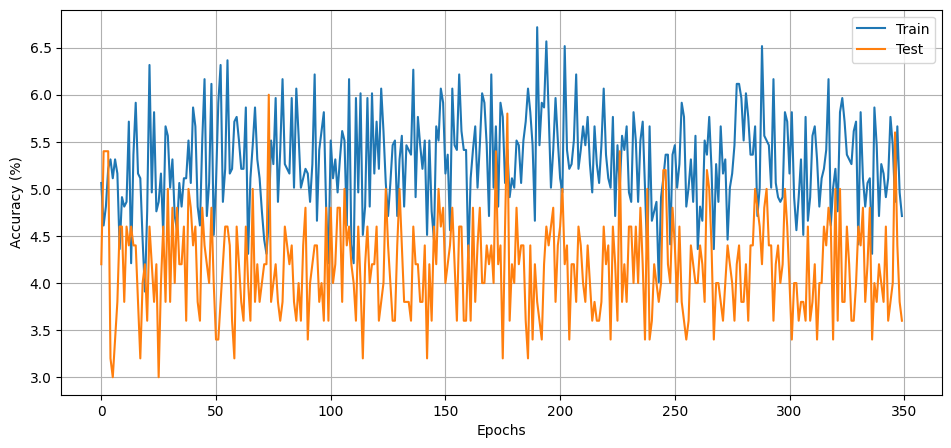

In [ ]:
plot_accuracies( [(train_accuracies, 'Train'), (test_accuracies, 'Test')])

### No weights, 128x128 images

In [ ]:
## Setup
train_dataset = transform_dataset(X_train, y_train, 128)
test_dataset = transform_dataset(X_test, y_test, 128)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

y_transformed  (2000,)
Deleted  74
Deleted  781
Deleted  1015
Deleted  1176
Deleted  1358
X_transformed_new  (1995,)
y_transformed_new  (1995,)
X_transformed final  torch.Size([1995, 3, 128, 128])
y_transformed final  torch.Size([1995])
y_transformed  (500,)
X_transformed_new  (500,)
y_transformed_new  (500,)
X_transformed final  torch.Size([500, 3, 128, 128])
y_transformed final  torch.Size([500])


In [ ]:
# # Create a writer to write to Tensorboard
# writer = SummaryWriter()

# Model definition
model = models.efficientnet_v2_s(weights=None, num_classes=num_classes).to(device)

# # Optimizer, loss function, and learning rate scheduler
# optimizer = optim.Adam(model.parameters(), lr=learning_rate)
# criterion = nn.CrossEntropyLoss()
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=10, verbose=True)

# epochs = 350
# best_accuracy = 0

# for epoch in range(epochs):
#     # Train on data
#     train_accuracy, train_loss = train(model, train_loader, device, optimizer, criterion)
    
#     # Test on data
#     test_accuracy, test_loss = test(model, test_loader, device, criterion)
    
#     print(f'Epoch {epoch+1}:')
#     print(f'Train Accuracy: {train_accuracy:.2f}%, Train Loss: {train_loss:.4f}')
#     print(f'Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')
    
#     scheduler.step(test_accuracy)
    
#     if test_accuracy > best_accuracy:
#         best_accuracy = test_accuracy
#         torch.save(model.state_dict(), 'best_model.pth')

#     # Write metrics to Tensorboard
#     writer.add_scalars("Loss", {'Train': train_loss, 'Test':test_loss}, epoch)            
#     writer.add_scalars('Accuracy', {'Train': train_accuracy,'Test':test_accuracy} , epoch)


# print(f'Best Test Accuracy: {best_accuracy:.2f}%')

# writer.flush()
# writer.close()
best_test_accuracy, train_accuracies, test_accuracies = train_and_test(model, train_loader, test_loader, device, num_classes, learning_rate=0.0001, epochs=350, patience_optim=10, patience=50)

Epoch 1:
Train Accuracy: 4.56%, Train Loss: 3.7070
Test Accuracy: 4.00%, Test Loss: 3.2246


Epoch 2:
Train Accuracy: 4.81%, Train Loss: 3.5660
Test Accuracy: 4.00%, Test Loss: 3.2281


Epoch 3:
Train Accuracy: 4.86%, Train Loss: 3.5413
Test Accuracy: 4.20%, Test Loss: 3.2238


Epoch 4:
Train Accuracy: 5.36%, Train Loss: 3.4333
Test Accuracy: 2.20%, Test Loss: 3.2307


Epoch 5:
Train Accuracy: 5.96%, Train Loss: 3.4979
Test Accuracy: 4.20%, Test Loss: 3.2349


Epoch 6:
Train Accuracy: 6.52%, Train Loss: 3.3885
Test Accuracy: 4.40%, Test Loss: 3.3501


Epoch 7:
Train Accuracy: 5.36%, Train Loss: 3.4693
Test Accuracy: 5.20%, Test Loss: 3.4842


Epoch 8:
Train Accuracy: 6.77%, Train Loss: 3.3730
Test Accuracy: 5.00%, Test Loss: 3.3699


Epoch 9:
Train Accuracy: 6.22%, Train Loss: 3.4045
Test Accuracy: 6.20%, Test Loss: 3.2853


Epoch 10:
Train Accuracy: 7.07%, Train Loss: 3.3921
Test Accuracy: 5.80%, Test Loss: 3.4142


Epoch 11:
Train Accuracy: 7.57%, Train Loss: 3.4180
Test Accuracy: 6.60%, Test Loss: 3.7736


Epoch 12:
Train Accuracy: 6.22%, Train Loss: 3.4239
Test Accuracy: 5.60%, Test Loss: 3.4323


Epoch 13:
Train Accuracy: 6.47%, Train Loss: 3.4168
Test Accuracy: 5.40%, Test Loss: 3.3869


Epoch 14:
Train Accuracy: 7.82%, Train Loss: 3.3538
Test Accuracy: 6.20%, Test Loss: 3.4276


Epoch 15:
Train Accuracy: 7.37%, Train Loss: 3.3716
Test Accuracy: 4.80%, Test Loss: 3.3171


Epoch 16:
Train Accuracy: 8.32%, Train Loss: 3.3345
Test Accuracy: 5.80%, Test Loss: 3.2706


Epoch 17:
Train Accuracy: 8.32%, Train Loss: 3.3036
Test Accuracy: 7.20%, Test Loss: 3.2947


Epoch 18:
Train Accuracy: 7.77%, Train Loss: 3.3258
Test Accuracy: 7.20%, Test Loss: 3.3128


Epoch 19:
Train Accuracy: 9.32%, Train Loss: 3.3066
Test Accuracy: 7.60%, Test Loss: 3.2301


Epoch 20:
Train Accuracy: 8.37%, Train Loss: 3.2675
Test Accuracy: 6.40%, Test Loss: 3.3465


Epoch 21:
Train Accuracy: 8.67%, Train Loss: 3.2976
Test Accuracy: 7.00%, Test Loss: 3.2391


Epoch 22:
Train Accuracy: 9.17%, Train Loss: 3.2742
Test Accuracy: 6.20%, Test Loss: 3.2038


Epoch 23:
Train Accuracy: 10.23%, Train Loss: 3.2327
Test Accuracy: 6.80%, Test Loss: 3.3745


Epoch 24:
Train Accuracy: 9.02%, Train Loss: 3.2622
Test Accuracy: 6.80%, Test Loss: 3.3816


Epoch 25:
Train Accuracy: 9.52%, Train Loss: 3.2257
Test Accuracy: 7.40%, Test Loss: 3.3374


Epoch 26:
Train Accuracy: 10.43%, Train Loss: 3.2399
Test Accuracy: 10.80%, Test Loss: 3.2142


Epoch 27:
Train Accuracy: 11.18%, Train Loss: 3.1893
Test Accuracy: 7.60%, Test Loss: 3.1396


Epoch 28:
Train Accuracy: 10.68%, Train Loss: 3.1796
Test Accuracy: 7.00%, Test Loss: 3.4799


Epoch 29:
Train Accuracy: 11.98%, Train Loss: 3.1409
Test Accuracy: 8.40%, Test Loss: 3.2212


Epoch 30:
Train Accuracy: 12.13%, Train Loss: 3.1677
Test Accuracy: 9.40%, Test Loss: 3.1982


Epoch 31:
Train Accuracy: 12.33%, Train Loss: 3.1613
Test Accuracy: 9.20%, Test Loss: 3.1731


Epoch 32:
Train Accuracy: 12.03%, Train Loss: 3.1723
Test Accuracy: 9.60%, Test Loss: 3.3014


Epoch 33:
Train Accuracy: 11.63%, Train Loss: 3.1134
Test Accuracy: 12.40%, Test Loss: 3.3197


Epoch 34:
Train Accuracy: 13.43%, Train Loss: 3.0672
Test Accuracy: 11.20%, Test Loss: 3.0797


Epoch 35:
Train Accuracy: 11.53%, Train Loss: 3.1135
Test Accuracy: 11.40%, Test Loss: 3.1125


Epoch 36:
Train Accuracy: 12.43%, Train Loss: 3.0864
Test Accuracy: 10.00%, Test Loss: 3.0775


Epoch 37:
Train Accuracy: 13.03%, Train Loss: 3.1165
Test Accuracy: 7.60%, Test Loss: 3.0930


Epoch 38:
Train Accuracy: 13.58%, Train Loss: 3.0368
Test Accuracy: 10.20%, Test Loss: 3.1045


Epoch 39:
Train Accuracy: 12.58%, Train Loss: 3.0009
Test Accuracy: 10.40%, Test Loss: 3.0509


Epoch 40:
Train Accuracy: 13.78%, Train Loss: 3.0371
Test Accuracy: 10.40%, Test Loss: 3.1004


Epoch 41:
Train Accuracy: 14.84%, Train Loss: 2.9785
Test Accuracy: 12.20%, Test Loss: 3.0086


Epoch 42:
Train Accuracy: 14.69%, Train Loss: 2.9332
Test Accuracy: 11.60%, Test Loss: 2.9699


Epoch 43:
Train Accuracy: 14.34%, Train Loss: 2.9298
Test Accuracy: 10.40%, Test Loss: 2.9582


Epoch 44:
Train Accuracy: 14.79%, Train Loss: 2.9159
Test Accuracy: 11.40%, Test Loss: 2.9530
Epoch 00044: reducing learning rate of group 0 to 1.0000e-05.


Epoch 45:
Train Accuracy: 15.99%, Train Loss: 2.9302
Test Accuracy: 12.80%, Test Loss: 2.9319


Epoch 46:
Train Accuracy: 16.74%, Train Loss: 2.8833
Test Accuracy: 13.80%, Test Loss: 2.9389


Epoch 47:
Train Accuracy: 17.64%, Train Loss: 2.8075
Test Accuracy: 12.40%, Test Loss: 2.9205


Epoch 48:
Train Accuracy: 16.49%, Train Loss: 2.8940
Test Accuracy: 13.20%, Test Loss: 2.9315


Epoch 49:
Train Accuracy: 16.39%, Train Loss: 2.8568
Test Accuracy: 12.00%, Test Loss: 2.9225


Epoch 50:
Train Accuracy: 16.89%, Train Loss: 2.8237
Test Accuracy: 11.80%, Test Loss: 2.9394


Epoch 51:
Train Accuracy: 18.25%, Train Loss: 2.7899
Test Accuracy: 12.20%, Test Loss: 2.9349


Epoch 52:
Train Accuracy: 17.44%, Train Loss: 2.8395
Test Accuracy: 11.00%, Test Loss: 2.9202


Epoch 53:
Train Accuracy: 17.84%, Train Loss: 2.8613
Test Accuracy: 11.40%, Test Loss: 2.9226


Epoch 54:
Train Accuracy: 18.10%, Train Loss: 2.8036
Test Accuracy: 11.00%, Test Loss: 2.9184


Epoch 55:
Train Accuracy: 16.49%, Train Loss: 2.8109
Test Accuracy: 11.40%, Test Loss: 2.9160


Epoch 56:
Train Accuracy: 18.65%, Train Loss: 2.7288
Test Accuracy: 12.00%, Test Loss: 2.9412


Epoch 57:
Train Accuracy: 17.64%, Train Loss: 2.7611
Test Accuracy: 11.80%, Test Loss: 2.9226
Epoch 00057: reducing learning rate of group 0 to 1.0000e-06.


Epoch 58:
Train Accuracy: 19.15%, Train Loss: 2.7307
Test Accuracy: 12.20%, Test Loss: 2.9445


Epoch 59:
Train Accuracy: 18.25%, Train Loss: 2.7822
Test Accuracy: 12.00%, Test Loss: 2.9327


Epoch 60:
Train Accuracy: 19.60%, Train Loss: 2.7827
Test Accuracy: 12.00%, Test Loss: 2.9243


Epoch 61:
Train Accuracy: 18.25%, Train Loss: 2.7828
Test Accuracy: 12.20%, Test Loss: 2.9223


Epoch 62:
Train Accuracy: 18.70%, Train Loss: 2.7756
Test Accuracy: 11.00%, Test Loss: 2.9315


Epoch 63:
Train Accuracy: 18.15%, Train Loss: 2.8022
Test Accuracy: 11.40%, Test Loss: 2.9111


Epoch 64:
Train Accuracy: 18.50%, Train Loss: 2.7643
Test Accuracy: 12.00%, Test Loss: 2.9381


Epoch 65:
Train Accuracy: 17.54%, Train Loss: 2.8192
Test Accuracy: 12.20%, Test Loss: 2.9532


Epoch 66:
Train Accuracy: 17.54%, Train Loss: 2.7642
Test Accuracy: 12.00%, Test Loss: 2.9424


Epoch 67:
Train Accuracy: 17.89%, Train Loss: 2.7390
Test Accuracy: 11.60%, Test Loss: 2.9342


Epoch 68:
Train Accuracy: 18.90%, Train Loss: 2.7646
Test Accuracy: 12.40%, Test Loss: 2.9172
Epoch 00068: reducing learning rate of group 0 to 1.0000e-07.


Epoch 69:
Train Accuracy: 17.99%, Train Loss: 2.7533
Test Accuracy: 12.60%, Test Loss: 2.9333


Epoch 70:
Train Accuracy: 18.70%, Train Loss: 2.7600
Test Accuracy: 12.20%, Test Loss: 2.9514


Epoch 71:
Train Accuracy: 18.10%, Train Loss: 2.7487
Test Accuracy: 12.20%, Test Loss: 2.9214


Epoch 72:
Train Accuracy: 17.69%, Train Loss: 2.7367
Test Accuracy: 12.40%, Test Loss: 2.9160


Epoch 73:
Train Accuracy: 18.45%, Train Loss: 2.7416
Test Accuracy: 12.00%, Test Loss: 2.9116


Epoch 74:
Train Accuracy: 18.45%, Train Loss: 2.7991
Test Accuracy: 11.60%, Test Loss: 2.9268


Epoch 75:
Train Accuracy: 19.30%, Train Loss: 2.7647
Test Accuracy: 11.60%, Test Loss: 2.9272


Epoch 76:
Train Accuracy: 18.25%, Train Loss: 2.7259
Test Accuracy: 12.40%, Test Loss: 2.9323


Epoch 77:
Train Accuracy: 19.05%, Train Loss: 2.7881
Test Accuracy: 12.00%, Test Loss: 2.9496


Epoch 78:
Train Accuracy: 19.10%, Train Loss: 2.7973
Test Accuracy: 12.20%, Test Loss: 2.9310


Epoch 79:
Train Accuracy: 18.35%, Train Loss: 2.7328
Test Accuracy: 11.40%, Test Loss: 2.9059
Epoch 00079: reducing learning rate of group 0 to 1.0000e-08.


Epoch 80:
Train Accuracy: 17.74%, Train Loss: 2.7698
Test Accuracy: 12.00%, Test Loss: 2.9137


Epoch 81:
Train Accuracy: 19.25%, Train Loss: 2.7243
Test Accuracy: 11.60%, Test Loss: 2.9086


Epoch 82:
Train Accuracy: 18.40%, Train Loss: 2.7427
Test Accuracy: 12.00%, Test Loss: 2.9216


Epoch 83:
Train Accuracy: 18.45%, Train Loss: 2.7542
Test Accuracy: 12.00%, Test Loss: 2.9265


Epoch 84:
Train Accuracy: 19.00%, Train Loss: 2.8114
Test Accuracy: 12.00%, Test Loss: 2.9116


Epoch 85:
Train Accuracy: 18.20%, Train Loss: 2.7677
Test Accuracy: 12.00%, Test Loss: 2.9137


Epoch 86:
Train Accuracy: 18.20%, Train Loss: 2.7699
Test Accuracy: 12.20%, Test Loss: 2.9193


Epoch 87:
Train Accuracy: 17.99%, Train Loss: 2.7384
Test Accuracy: 11.80%, Test Loss: 2.9240


Epoch 88:
Train Accuracy: 18.30%, Train Loss: 2.7087
Test Accuracy: 11.40%, Test Loss: 2.9161


Epoch 89:
Train Accuracy: 18.25%, Train Loss: 2.7426
Test Accuracy: 12.00%, Test Loss: 2.9266


Epoch 90:
Train Accuracy: 18.95%, Train Loss: 2.7411
Test Accuracy: 12.00%, Test Loss: 2.9415


Epoch 91:
Train Accuracy: 18.90%, Train Loss: 2.7260
Test Accuracy: 11.20%, Test Loss: 2.9472


Epoch 92:
Train Accuracy: 17.94%, Train Loss: 2.7746
Test Accuracy: 11.40%, Test Loss: 2.9102


Epoch 93:
Train Accuracy: 17.04%, Train Loss: 2.8048
Test Accuracy: 12.40%, Test Loss: 2.9345


Epoch 94:
Train Accuracy: 18.45%, Train Loss: 2.7232
Test Accuracy: 11.60%, Test Loss: 2.9063


Epoch 95:
Train Accuracy: 19.00%, Train Loss: 2.7524
Test Accuracy: 11.20%, Test Loss: 2.9425


Epoch 96:
Train Accuracy: 18.90%, Train Loss: 2.7481
Test Accuracy: 12.40%, Test Loss: 2.9125


Epoch 97:
Train Accuracy: 18.25%, Train Loss: 2.7316
Test Accuracy: 11.40%, Test Loss: 2.9116


Epoch 98:
Train Accuracy: 18.55%, Train Loss: 2.7479
Test Accuracy: 10.60%, Test Loss: 2.9323


Epoch 99:
Train Accuracy: 18.90%, Train Loss: 2.7709
Test Accuracy: 11.80%, Test Loss: 2.9319


Epoch 100:
Train Accuracy: 17.39%, Train Loss: 2.7727
Test Accuracy: 11.80%, Test Loss: 2.9437


Epoch 101:
Train Accuracy: 18.55%, Train Loss: 2.7306
Test Accuracy: 12.20%, Test Loss: 2.9506


Epoch 102:
Train Accuracy: 19.30%, Train Loss: 2.7330
Test Accuracy: 11.80%, Test Loss: 2.9369


Epoch 103:
Train Accuracy: 18.50%, Train Loss: 2.7915
Test Accuracy: 12.20%, Test Loss: 2.9157


Epoch 104:
Train Accuracy: 19.35%, Train Loss: 2.7255
Test Accuracy: 10.80%, Test Loss: 2.9271


Epoch 105:
Train Accuracy: 18.30%, Train Loss: 2.7613
Test Accuracy: 11.80%, Test Loss: 2.9225


Epoch 106:
Train Accuracy: 19.50%, Train Loss: 2.8040
Test Accuracy: 12.20%, Test Loss: 2.9479


Epoch 107:
Train Accuracy: 18.55%, Train Loss: 2.7428
Test Accuracy: 11.80%, Test Loss: 2.9214


Epoch 108:
Train Accuracy: 19.30%, Train Loss: 2.7074
Test Accuracy: 12.00%, Test Loss: 2.9184


Epoch 109:
Train Accuracy: 20.05%, Train Loss: 2.7036
Test Accuracy: 12.00%, Test Loss: 2.9153


Epoch 110:
Train Accuracy: 18.65%, Train Loss: 2.7271
Test Accuracy: 12.40%, Test Loss: 2.9234


Epoch 111:
Train Accuracy: 18.60%, Train Loss: 2.7524
Test Accuracy: 12.40%, Test Loss: 2.9035


Epoch 112:
Train Accuracy: 18.25%, Train Loss: 2.7602
Test Accuracy: 12.60%, Test Loss: 2.9254


Epoch 113:
Train Accuracy: 19.50%, Train Loss: 2.7401
Test Accuracy: 12.20%, Test Loss: 2.9297


Epoch 114:
Train Accuracy: 18.35%, Train Loss: 2.7819
Test Accuracy: 12.40%, Test Loss: 2.9553


Epoch 115:
Train Accuracy: 19.30%, Train Loss: 2.7690
Test Accuracy: 11.80%, Test Loss: 2.9127


Epoch 116:
Train Accuracy: 17.99%, Train Loss: 2.7284
Test Accuracy: 12.80%, Test Loss: 2.9050


Epoch 117:
Train Accuracy: 18.70%, Train Loss: 2.7367
Test Accuracy: 12.40%, Test Loss: 2.9034


Epoch 118:
Train Accuracy: 16.94%, Train Loss: 2.8270
Test Accuracy: 11.40%, Test Loss: 2.9355


Epoch 119:
Train Accuracy: 19.20%, Train Loss: 2.7016
Test Accuracy: 12.40%, Test Loss: 2.9116


Epoch 120:
Train Accuracy: 19.10%, Train Loss: 2.7115
Test Accuracy: 12.40%, Test Loss: 2.9419


Epoch 121:
Train Accuracy: 18.20%, Train Loss: 2.8273
Test Accuracy: 12.00%, Test Loss: 2.9601


Epoch 122:
Train Accuracy: 18.55%, Train Loss: 2.7441
Test Accuracy: 11.60%, Test Loss: 2.9375


Epoch 123:
Train Accuracy: 19.55%, Train Loss: 2.7091
Test Accuracy: 12.80%, Test Loss: 2.9165


Epoch 124:
Train Accuracy: 18.50%, Train Loss: 2.7744
Test Accuracy: 11.80%, Test Loss: 2.9393


Epoch 125:
Train Accuracy: 19.35%, Train Loss: 2.7226
Test Accuracy: 11.40%, Test Loss: 2.9085


Epoch 126:
Train Accuracy: 18.40%, Train Loss: 2.7392
Test Accuracy: 11.20%, Test Loss: 2.9101


Epoch 127:
Train Accuracy: 18.20%, Train Loss: 2.7555
Test Accuracy: 11.40%, Test Loss: 2.9075


Epoch 128:
Train Accuracy: 19.10%, Train Loss: 2.7225
Test Accuracy: 12.80%, Test Loss: 2.9112


Epoch 129:
Train Accuracy: 18.60%, Train Loss: 2.7761
Test Accuracy: 11.60%, Test Loss: 2.9018


Epoch 130:
Train Accuracy: 18.80%, Train Loss: 2.7586
Test Accuracy: 11.40%, Test Loss: 2.9225


Epoch 131:
Train Accuracy: 17.44%, Train Loss: 2.7715
Test Accuracy: 12.40%, Test Loss: 2.9193


Epoch 132:
Train Accuracy: 18.45%, Train Loss: 2.7665
Test Accuracy: 11.20%, Test Loss: 2.9288


Epoch 133:
Train Accuracy: 19.05%, Train Loss: 2.7306
Test Accuracy: 12.40%, Test Loss: 2.9284


Epoch 134:
Train Accuracy: 19.55%, Train Loss: 2.7541
Test Accuracy: 12.00%, Test Loss: 2.9502


Epoch 135:
Train Accuracy: 18.20%, Train Loss: 2.7426
Test Accuracy: 12.40%, Test Loss: 2.9131


Epoch 136:
Train Accuracy: 17.49%, Train Loss: 2.7624
Test Accuracy: 12.60%, Test Loss: 2.9207


Epoch 137:
Train Accuracy: 19.00%, Train Loss: 2.7506
Test Accuracy: 11.80%, Test Loss: 2.9217


Epoch 138:
Train Accuracy: 19.50%, Train Loss: 2.7367
Test Accuracy: 12.20%, Test Loss: 2.9088


Epoch 139:
Train Accuracy: 18.85%, Train Loss: 2.7246
Test Accuracy: 12.60%, Test Loss: 2.8991


Epoch 140:
Train Accuracy: 18.80%, Train Loss: 2.7473
Test Accuracy: 11.80%, Test Loss: 2.9047


Epoch 141:
Train Accuracy: 18.60%, Train Loss: 2.7586
Test Accuracy: 12.00%, Test Loss: 2.9085


Epoch 142:
Train Accuracy: 18.20%, Train Loss: 2.7309
Test Accuracy: 11.80%, Test Loss: 2.9203


Epoch 143:
Train Accuracy: 17.24%, Train Loss: 2.7457
Test Accuracy: 12.40%, Test Loss: 2.9426


Epoch 144:
Train Accuracy: 19.20%, Train Loss: 2.7988
Test Accuracy: 12.20%, Test Loss: 2.9177


Epoch 145:
Train Accuracy: 18.25%, Train Loss: 2.7919
Test Accuracy: 12.20%, Test Loss: 2.9477


Epoch 146:
Train Accuracy: 18.45%, Train Loss: 2.7245
Test Accuracy: 11.80%, Test Loss: 2.9103


Epoch 147:
Train Accuracy: 16.14%, Train Loss: 2.7558
Test Accuracy: 12.20%, Test Loss: 2.9120


Epoch 148:
Train Accuracy: 19.40%, Train Loss: 2.7890
Test Accuracy: 12.20%, Test Loss: 2.9238


Epoch 149:
Train Accuracy: 18.75%, Train Loss: 2.7832
Test Accuracy: 11.40%, Test Loss: 2.9336


Epoch 150:
Train Accuracy: 17.64%, Train Loss: 2.7550
Test Accuracy: 11.80%, Test Loss: 2.9087


Epoch 151:
Train Accuracy: 16.69%, Train Loss: 2.7678
Test Accuracy: 12.00%, Test Loss: 2.9587


Epoch 152:
Train Accuracy: 18.05%, Train Loss: 2.7553
Test Accuracy: 11.60%, Test Loss: 2.9236


Epoch 153:
Train Accuracy: 18.60%, Train Loss: 2.7377
Test Accuracy: 11.60%, Test Loss: 2.9549


Epoch 154:
Train Accuracy: 18.50%, Train Loss: 2.7421
Test Accuracy: 12.00%, Test Loss: 2.9141


Epoch 155:
Train Accuracy: 18.60%, Train Loss: 2.7297
Test Accuracy: 11.60%, Test Loss: 2.9200


Epoch 156:
Train Accuracy: 18.55%, Train Loss: 2.7698
Test Accuracy: 12.60%, Test Loss: 2.9380


Epoch 157:
Train Accuracy: 18.70%, Train Loss: 2.7656
Test Accuracy: 12.00%, Test Loss: 2.9637


Epoch 158:
Train Accuracy: 17.94%, Train Loss: 2.7742
Test Accuracy: 12.00%, Test Loss: 2.9230


Epoch 159:
Train Accuracy: 17.99%, Train Loss: 2.7751
Test Accuracy: 11.40%, Test Loss: 2.9380


Epoch 160:
Train Accuracy: 18.80%, Train Loss: 2.7811
Test Accuracy: 11.60%, Test Loss: 2.9351


Epoch 161:
Train Accuracy: 18.75%, Train Loss: 2.7984
Test Accuracy: 11.80%, Test Loss: 2.9078


Epoch 162:
Train Accuracy: 20.55%, Train Loss: 2.7452
Test Accuracy: 11.40%, Test Loss: 2.9181


Epoch 163:
Train Accuracy: 18.50%, Train Loss: 2.7863
Test Accuracy: 12.00%, Test Loss: 2.9155


Epoch 164:
Train Accuracy: 19.00%, Train Loss: 2.7464
Test Accuracy: 11.40%, Test Loss: 2.9099


Epoch 165:
Train Accuracy: 19.50%, Train Loss: 2.7268
Test Accuracy: 11.80%, Test Loss: 2.9118


Epoch 166:
Train Accuracy: 19.10%, Train Loss: 2.7515
Test Accuracy: 12.00%, Test Loss: 2.9158


Epoch 167:
Train Accuracy: 18.85%, Train Loss: 2.7374
Test Accuracy: 12.40%, Test Loss: 2.9185


Epoch 168:
Train Accuracy: 19.45%, Train Loss: 2.7634
Test Accuracy: 13.00%, Test Loss: 2.9233


Epoch 169:
Train Accuracy: 19.25%, Train Loss: 2.7845
Test Accuracy: 11.80%, Test Loss: 2.9277


Epoch 170:
Train Accuracy: 18.05%, Train Loss: 2.7770
Test Accuracy: 11.80%, Test Loss: 2.9288


Epoch 171:
Train Accuracy: 19.10%, Train Loss: 2.7570
Test Accuracy: 12.20%, Test Loss: 2.9085


Epoch 172:
Train Accuracy: 17.74%, Train Loss: 2.7736
Test Accuracy: 12.00%, Test Loss: 2.9138


Epoch 173:
Train Accuracy: 18.55%, Train Loss: 2.7978
Test Accuracy: 11.60%, Test Loss: 2.9347


Epoch 174:
Train Accuracy: 20.20%, Train Loss: 2.7215
Test Accuracy: 12.00%, Test Loss: 2.9362


Epoch 175:
Train Accuracy: 18.60%, Train Loss: 2.7925
Test Accuracy: 12.00%, Test Loss: 2.9229


Epoch 176:
Train Accuracy: 19.15%, Train Loss: 2.7220
Test Accuracy: 12.80%, Test Loss: 2.9390


Epoch 177:
Train Accuracy: 17.89%, Train Loss: 2.7473
Test Accuracy: 12.20%, Test Loss: 2.9128


Epoch 178:
Train Accuracy: 17.89%, Train Loss: 2.7514
Test Accuracy: 12.40%, Test Loss: 2.9326


Epoch 179:
Train Accuracy: 18.40%, Train Loss: 2.7993
Test Accuracy: 12.00%, Test Loss: 2.9349


Epoch 180:
Train Accuracy: 18.85%, Train Loss: 2.7796
Test Accuracy: 11.80%, Test Loss: 2.9351


Epoch 181:
Train Accuracy: 16.54%, Train Loss: 2.7874
Test Accuracy: 12.20%, Test Loss: 2.9238


Epoch 182:
Train Accuracy: 18.05%, Train Loss: 2.7656
Test Accuracy: 11.80%, Test Loss: 2.9414


Epoch 183:
Train Accuracy: 17.39%, Train Loss: 2.7652
Test Accuracy: 11.60%, Test Loss: 2.9390


Epoch 184:
Train Accuracy: 17.29%, Train Loss: 2.7323
Test Accuracy: 11.20%, Test Loss: 2.9293


Epoch 185:
Train Accuracy: 16.39%, Train Loss: 2.7605
Test Accuracy: 11.60%, Test Loss: 2.9100


Epoch 186:
Train Accuracy: 18.50%, Train Loss: 2.7706
Test Accuracy: 12.20%, Test Loss: 2.9223


Epoch 187:
Train Accuracy: 18.45%, Train Loss: 2.7789
Test Accuracy: 11.80%, Test Loss: 2.9375


Epoch 188:
Train Accuracy: 18.60%, Train Loss: 2.7372
Test Accuracy: 11.40%, Test Loss: 2.9167


Epoch 189:
Train Accuracy: 19.75%, Train Loss: 2.7258
Test Accuracy: 12.20%, Test Loss: 2.9056


Epoch 190:
Train Accuracy: 19.55%, Train Loss: 2.7611
Test Accuracy: 11.40%, Test Loss: 2.9069


Epoch 191:
Train Accuracy: 17.64%, Train Loss: 2.7909
Test Accuracy: 11.80%, Test Loss: 2.9225


Epoch 192:
Train Accuracy: 18.35%, Train Loss: 2.7819
Test Accuracy: 11.40%, Test Loss: 2.9250


Epoch 193:
Train Accuracy: 18.55%, Train Loss: 2.7604
Test Accuracy: 12.20%, Test Loss: 2.9307


Epoch 194:
Train Accuracy: 19.45%, Train Loss: 2.7124
Test Accuracy: 11.60%, Test Loss: 2.9121


Epoch 195:
Train Accuracy: 18.25%, Train Loss: 2.8071
Test Accuracy: 12.40%, Test Loss: 2.9224


Epoch 196:
Train Accuracy: 19.00%, Train Loss: 2.7422
Test Accuracy: 12.00%, Test Loss: 2.9204


Epoch 197:
Train Accuracy: 17.79%, Train Loss: 2.7826
Test Accuracy: 11.60%, Test Loss: 2.9140


Epoch 198:
Train Accuracy: 18.70%, Train Loss: 2.7637
Test Accuracy: 11.80%, Test Loss: 2.9099


Epoch 199:
Train Accuracy: 19.55%, Train Loss: 2.7792
Test Accuracy: 11.60%, Test Loss: 2.9340


Epoch 200:
Train Accuracy: 18.25%, Train Loss: 2.7567
Test Accuracy: 12.40%, Test Loss: 2.9089


Epoch 201:
Train Accuracy: 18.70%, Train Loss: 2.7302
Test Accuracy: 12.00%, Test Loss: 2.9370
Early stopping after 50 epochs without improvement.
Best Test Accuracy: 13.80%


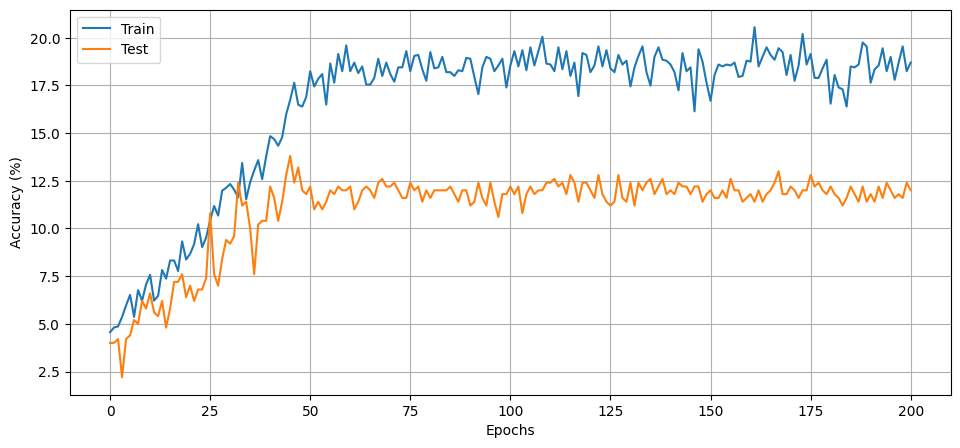

In [ ]:
plot_accuracies( [(train_accuracies, 'Train'), (test_accuracies, 'Test')])

### Test with default weights

In [ ]:
test_accuracy, test_loss = test(test_efficientnet_v2_s_model().to(device), test_loader, device, criterion)
print(f'Efficientnet_v2_s Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')

# ImageNetTE


In [ ]:
import tensorflow as tf

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torchvision.transforms import ToTensor
import time
import matplotlib.pyplot as plt

from tqdm import tqdm

from torch.utils.tensorboard import SummaryWriter

import os
import numpy as np
from PIL import Image

## Preprocessing

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
# def read_classes():
#     """
#     Load the ImageNet class names.
#     """
#     with open("/content/gdrive/MyDrive/LOC_synset_mapping.txt", "r") as f:
#         categories = [c.split() for c in [s.strip() for s in f.readlines()]]
#     return categories

In [ ]:
# mapping = {}

# for c in read_classes(): 
#   mapping[c[0]] = c[1:]

# print(mapping)

In [ ]:
# Set the computation device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model.
# model = test_efficientnet_v2_s_model()

# Initialize the image preprocess.
# preprocess = transforms.Compose([
#         transforms.Resize((128, 128)),  # Resize the images to size x size
#         transforms.ToTensor()            # Convert the images to PyTorch tensors
#     ]) if train else models.EfficientNet_V2_S_Weights.DEFAULT.transforms()

data_list = []
label_list = []

for subdir, dirs, files in os.walk("./gdrive/MyDrive/imagenette2-160/train/"):
    for i, file in enumerate(files):
        # Open the image using Pillow library
        if i < 100:
          img_path = os.path.join(subdir, file)
          img = Image.open(img_path)
          if img.mode == 'RGB':
            # Convert the image to a numpy array and add it to the data list
            # img_array = np.asarray(preprocess(img))
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            # Add the label to the label list
            label_list.append(label)

# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

print(np.shape(data_array))
print(np.shape(label_array))

(982,)
(982,)


<ipython-input-3-e248f62f8f9b>:34: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


## Training&testing on model

In [ ]:
def train(model, dataloader, device, optimizer, criterion):
    """
    Trains network for one epoch in batches.

    Args:
        model: Neural network model.
        dataloader: Data loader for training set.
        optimizer: Optimizer (e.g. SGD).
        criterion: Loss function (e.g. cross-entropy loss).
    """
  
    correct = 0
    total = 0
    running_loss = 0

    model.train()
    for inputs, labels in tqdm(dataloader, desc='Training', leave=False):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = inputs.to(device), labels.to(device)
        
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        # keep track of loss and accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        running_loss += loss.item()

    accuracy = 100 * correct / total
    avg_loss = running_loss / len(dataloader)
    return accuracy, avg_loss

def test(model, dataloader, device, criterion):
    """
    Evaluates network in batches.

    Args:
        model: Neural network model.
        dataloader: Data loader for test set.
        criterion: Loss function (e.g. cross-entropy loss).
    """
    correct = 0
    total = 0
    running_loss = 0

    model.eval()
    # Use torch.no_grad to skip gradient calculation, not needed for evaluation
    with torch.no_grad():
        # iterate through batches
        for inputs, labels in tqdm(dataloader, desc='Testing', leave=False):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = inputs.to(device), labels.to(device)

            # forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # keep track of loss and accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            running_loss += loss.item()

    accuracy = 100 * correct / total
    avg_loss = running_loss / len(dataloader)
    return accuracy, avg_loss

In [ ]:
# def train(model, dataloader, device, optimizer, criterion):
#     model.train()
#     correct = 0
#     total = 0
#     running_loss = 0
#     # accum_steps = 4
#     # optimizer.zero_grad()
#     for inputs, labels in tqdm(dataloader, desc='Training', leave=False):
#         inputs, labels = inputs.to(device), labels.to(device)
#         optimizer.zero_grad()
#         outputs = model(inputs)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()
        
#         # if (i + 1) % accum_steps == 0:
#         #     optimizer.step()
#         #     optimizer.zero_grad()

#         _, predicted = torch.max(outputs.data, 1)
#         total += labels.size(0)
#         correct += (predicted == labels).sum().item()
#         running_loss += loss.item()

#     accuracy = 100 * correct / total
#     avg_loss = running_loss / len(dataloader)
#     return accuracy, avg_loss

# def test(model, dataloader, device, criterion):
#     model.eval()
#     correct = 0
#     total = 0
#     running_loss = 0
#     with torch.no_grad():
#         for inputs, labels in tqdm(dataloader, desc='Testing', leave=False):
#             inputs, labels = inputs.to(device), labels.to(device)
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
            
#             _, predicted = torch.max(outputs.data, 1)
#             total += labels.size(0)
#             correct += (predicted == labels).sum().item()
#             running_loss += loss.item()

#     accuracy = 100 * correct / total
#     avg_loss = running_loss / len(dataloader)
#     return accuracy, avg_loss

In [ ]:
# Split data into train and test set.
X_train, X_test, y_train, y_test = split_data(data_array, label_array)

# Count number of classes
num_classes = 10

# y_train = np.searchsorted(classes, y_train)
# y_test = np.searchsorted(classes, y_test)

# Model definition
model = models.efficientnet_v2_s(weights=None, num_classes=num_classes).to(device)

In [ ]:
# Create a writer to write to Tensorboard
# writer = SummaryWriter()

def train_and_test(model, train_loader, test_loader, device, num_classes=2, learning_rate=0.0001, epochs=350, patience_optim=10, patience=50):

    # Optimizer, loss function, and learning rate scheduler
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=patience_optim, verbose=True)

    best_accuracy = 0
    train_accuracies = []
    test_accuracies = []

    torch.cuda.empty_cache()
    epochs_without_improvement =0

    for epoch in range(epochs):
        train_accuracy, train_loss = train(model, train_loader, device, optimizer, criterion)
        test_accuracy, test_loss = test(model, test_loader, device, criterion)

        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)

        print(f'Epoch {epoch+1}:')
        print(f'Train Accuracy: {train_accuracy:.2f}%, Train Loss: {train_loss:.4f}')
        print(f'Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')

        scheduler.step(test_accuracy)

        # Early stopping logic
        if test_accuracy > best_accuracy:
            best_accuracy = test_accuracy
            if epoch>150:
              epochs_without_improvement = 0
        elif epoch>150:
            epochs_without_improvement += 1

        if epochs_without_improvement >= patience:
            print(f"Early stopping after {patience} epochs without improvement.")
            break
    
    # # Write metrics to Tensorboard
    # writer.add_scalars("Loss", {'Train': train_loss, 'Test':test_loss}, epoch)            
    # writer.add_scalars('Accuracy', {'Train': train_accuracy,'Test':test_accuracies} , epoch)

    print(f'Best Test Accuracy: {best_accuracy:.2f}%')
    return best_accuracy, train_accuracies, test_accuracies

# writer.flush()
# writer.close()

In [ ]:
# Open Tensorboard
%tensorboard --logdir runs/

UsageError: Line magic function `%tensorboard` not found.


### No weights, 128x128 images

In [ ]:
# Model definition
model = models.efficientnet_v2_s(weights=None, num_classes=num_classes).to(device)

In [ ]:
# train_loader = DataLoader(TensorDataset(torch.tensor(X_train), torch.tensor(y_train)), batch_size=128, shuffle=True, num_workers=2)
# test_loader = DataLoader(TensorDataset(torch.tensor(X_test), torch.tensor(y_test)), batch_size=128, shuffle=False, num_workers=2)

train_dataset = transform_dataset(X_train, y_train, 128)
test_dataset = transform_dataset(X_test, y_test, 128)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

y_transformed
(785,)
X_transformed_new  (785,)
y_transformed_new  (785,)
X_transformed final  torch.Size([785, 3, 128, 128])
y_transformed final  torch.Size([785])
y_transformed
(197,)
X_transformed_new  (197,)
y_transformed_new  (197,)
X_transformed final  torch.Size([197, 3, 128, 128])
y_transformed final  torch.Size([197])


In [ ]:
best_test_accuracy, train_accuracies, test_accuracies = train_and_test(model, train_loader, test_loader, device, num_classes, learning_rate=0.0001, epochs=350, patience_optim=10, patience=50)

Epoch 1:
Train Accuracy: 10.32%, Train Loss: 3.0362
Test Accuracy: 11.68%, Test Loss: 2.2956


Epoch 2:
Train Accuracy: 10.06%, Train Loss: 3.1093
Test Accuracy: 10.15%, Test Loss: 2.2975


Epoch 3:
Train Accuracy: 12.23%, Train Loss: 2.7998
Test Accuracy: 10.15%, Test Loss: 2.3000


Epoch 4:
Train Accuracy: 11.46%, Train Loss: 2.8426
Test Accuracy: 10.15%, Test Loss: 2.3069


Epoch 5:
Train Accuracy: 10.45%, Train Loss: 2.4851
Test Accuracy: 10.15%, Test Loss: 2.3103


Epoch 6:
Train Accuracy: 12.36%, Train Loss: 2.7745
Test Accuracy: 9.14%, Test Loss: 2.3147


Epoch 7:
Train Accuracy: 12.61%, Train Loss: 2.6313
Test Accuracy: 9.64%, Test Loss: 2.3279


Epoch 8:
Train Accuracy: 13.76%, Train Loss: 2.6082
Test Accuracy: 9.64%, Test Loss: 2.3220


Epoch 9:
Train Accuracy: 13.38%, Train Loss: 2.7949
Test Accuracy: 10.66%, Test Loss: 2.3143


Epoch 10:
Train Accuracy: 14.14%, Train Loss: 2.6027
Test Accuracy: 12.69%, Test Loss: 2.3453


Epoch 11:
Train Accuracy: 14.90%, Train Loss: 2.6831
Test Accuracy: 13.71%, Test Loss: 2.7886


Epoch 12:
Train Accuracy: 14.01%, Train Loss: 2.7405
Test Accuracy: 18.27%, Test Loss: 2.4644


Epoch 13:
Train Accuracy: 15.67%, Train Loss: 2.6976
Test Accuracy: 19.29%, Test Loss: 2.6463


Epoch 14:
Train Accuracy: 14.52%, Train Loss: 2.6466
Test Accuracy: 19.29%, Test Loss: 2.8723


Epoch 15:
Train Accuracy: 16.05%, Train Loss: 2.5530
Test Accuracy: 16.75%, Test Loss: 3.2706


Epoch 16:
Train Accuracy: 13.63%, Train Loss: 2.5511
Test Accuracy: 10.66%, Test Loss: 3.0334


Epoch 17:
Train Accuracy: 14.65%, Train Loss: 2.4748
Test Accuracy: 12.18%, Test Loss: 3.1375


Epoch 18:
Train Accuracy: 14.52%, Train Loss: 2.5548
Test Accuracy: 12.69%, Test Loss: 2.8419


Epoch 19:
Train Accuracy: 15.80%, Train Loss: 2.3805
Test Accuracy: 15.23%, Test Loss: 2.6151


Epoch 20:
Train Accuracy: 17.20%, Train Loss: 2.4459
Test Accuracy: 24.87%, Test Loss: 2.4514


Epoch 21:
Train Accuracy: 21.15%, Train Loss: 2.4676
Test Accuracy: 17.77%, Test Loss: 2.4511


Epoch 22:
Train Accuracy: 18.73%, Train Loss: 2.3432
Test Accuracy: 24.87%, Test Loss: 2.4679


Epoch 23:
Train Accuracy: 20.51%, Train Loss: 2.3664
Test Accuracy: 24.87%, Test Loss: 2.8757


Epoch 24:
Train Accuracy: 19.49%, Train Loss: 2.4721
Test Accuracy: 28.93%, Test Loss: 2.6259


Epoch 25:
Train Accuracy: 20.51%, Train Loss: 2.4811
Test Accuracy: 22.34%, Test Loss: 2.6499


Epoch 26:
Train Accuracy: 20.13%, Train Loss: 2.3011
Test Accuracy: 18.78%, Test Loss: 2.4039


Epoch 27:
Train Accuracy: 20.51%, Train Loss: 2.3888
Test Accuracy: 23.86%, Test Loss: 2.6314


Epoch 28:
Train Accuracy: 22.55%, Train Loss: 2.4477
Test Accuracy: 25.38%, Test Loss: 2.5672


Epoch 29:
Train Accuracy: 21.91%, Train Loss: 2.3497
Test Accuracy: 26.90%, Test Loss: 2.4942


Epoch 30:
Train Accuracy: 24.33%, Train Loss: 2.4016
Test Accuracy: 30.46%, Test Loss: 3.1071


Epoch 31:
Train Accuracy: 24.33%, Train Loss: 2.3137
Test Accuracy: 26.90%, Test Loss: 2.5442


Epoch 32:
Train Accuracy: 24.20%, Train Loss: 2.4379
Test Accuracy: 24.37%, Test Loss: 3.3891


Epoch 33:
Train Accuracy: 22.42%, Train Loss: 2.1998
Test Accuracy: 29.95%, Test Loss: 2.8640


Epoch 34:
Train Accuracy: 25.10%, Train Loss: 2.5269
Test Accuracy: 30.96%, Test Loss: 2.9350


Epoch 35:
Train Accuracy: 27.01%, Train Loss: 2.2183
Test Accuracy: 28.43%, Test Loss: 2.5497


Epoch 36:
Train Accuracy: 21.78%, Train Loss: 2.3226
Test Accuracy: 14.21%, Test Loss: 2.5236


Epoch 37:
Train Accuracy: 19.87%, Train Loss: 2.4506
Test Accuracy: 15.23%, Test Loss: 3.3076


Epoch 38:
Train Accuracy: 24.84%, Train Loss: 2.2700
Test Accuracy: 26.40%, Test Loss: 2.4984


Epoch 39:
Train Accuracy: 26.75%, Train Loss: 2.2803
Test Accuracy: 27.41%, Test Loss: 2.3852


Epoch 40:
Train Accuracy: 22.55%, Train Loss: 2.2478
Test Accuracy: 25.38%, Test Loss: 2.3591


Epoch 41:
Train Accuracy: 24.33%, Train Loss: 2.2682
Test Accuracy: 22.34%, Test Loss: 2.2572


Epoch 42:
Train Accuracy: 27.26%, Train Loss: 2.0852
Test Accuracy: 28.93%, Test Loss: 2.3279


Epoch 43:
Train Accuracy: 26.24%, Train Loss: 2.2102
Test Accuracy: 29.95%, Test Loss: 2.6460


Epoch 44:
Train Accuracy: 28.66%, Train Loss: 2.0984
Test Accuracy: 33.50%, Test Loss: 2.6594


Epoch 45:
Train Accuracy: 25.86%, Train Loss: 2.1249
Test Accuracy: 29.95%, Test Loss: 2.9400


Epoch 46:
Train Accuracy: 29.68%, Train Loss: 2.3394
Test Accuracy: 29.44%, Test Loss: 2.7781


Epoch 47:
Train Accuracy: 30.96%, Train Loss: 2.1026
Test Accuracy: 28.93%, Test Loss: 2.9495


Epoch 48:
Train Accuracy: 30.19%, Train Loss: 2.2053
Test Accuracy: 32.49%, Test Loss: 2.1630


Epoch 49:
Train Accuracy: 32.10%, Train Loss: 2.1863
Test Accuracy: 32.99%, Test Loss: 2.2189


Epoch 50:
Train Accuracy: 28.15%, Train Loss: 2.1160
Test Accuracy: 27.41%, Test Loss: 2.1209


Epoch 51:
Train Accuracy: 30.32%, Train Loss: 2.3437
Test Accuracy: 27.92%, Test Loss: 2.1216


Epoch 52:
Train Accuracy: 31.21%, Train Loss: 2.1691
Test Accuracy: 32.49%, Test Loss: 2.0311


Epoch 53:
Train Accuracy: 31.21%, Train Loss: 2.0708
Test Accuracy: 33.50%, Test Loss: 2.0712


Epoch 54:
Train Accuracy: 34.78%, Train Loss: 2.0946
Test Accuracy: 32.49%, Test Loss: 2.0301


Epoch 55:
Train Accuracy: 34.78%, Train Loss: 2.1308
Test Accuracy: 37.56%, Test Loss: 1.9949


Epoch 56:
Train Accuracy: 31.97%, Train Loss: 2.0176
Test Accuracy: 28.43%, Test Loss: 1.9898


Epoch 57:
Train Accuracy: 32.61%, Train Loss: 2.1576
Test Accuracy: 34.52%, Test Loss: 1.9726


Epoch 58:
Train Accuracy: 32.36%, Train Loss: 2.0266
Test Accuracy: 32.99%, Test Loss: 1.9754


Epoch 59:
Train Accuracy: 32.61%, Train Loss: 2.2027
Test Accuracy: 31.47%, Test Loss: 2.1258


Epoch 60:
Train Accuracy: 35.29%, Train Loss: 2.3278
Test Accuracy: 34.01%, Test Loss: 2.4599


Epoch 61:
Train Accuracy: 31.34%, Train Loss: 1.9479
Test Accuracy: 23.35%, Test Loss: 2.5798


Epoch 62:
Train Accuracy: 31.85%, Train Loss: 1.9690
Test Accuracy: 25.89%, Test Loss: 2.1546


Epoch 63:
Train Accuracy: 34.01%, Train Loss: 2.0840
Test Accuracy: 27.41%, Test Loss: 2.0225


Epoch 64:
Train Accuracy: 35.80%, Train Loss: 1.8935
Test Accuracy: 28.43%, Test Loss: 1.9774


Epoch 65:
Train Accuracy: 39.24%, Train Loss: 1.9413
Test Accuracy: 32.49%, Test Loss: 2.0409


Epoch 66:
Train Accuracy: 38.85%, Train Loss: 1.9631
Test Accuracy: 35.53%, Test Loss: 2.0667
Epoch 00066: reducing learning rate of group 0 to 1.0000e-05.


Epoch 67:
Train Accuracy: 36.82%, Train Loss: 1.9281
Test Accuracy: 35.53%, Test Loss: 1.9977


Epoch 68:
Train Accuracy: 37.07%, Train Loss: 1.9269
Test Accuracy: 38.58%, Test Loss: 1.9750


Epoch 69:
Train Accuracy: 37.71%, Train Loss: 1.7818
Test Accuracy: 36.55%, Test Loss: 1.9914


Epoch 70:
Train Accuracy: 39.11%, Train Loss: 2.0058
Test Accuracy: 35.53%, Test Loss: 2.0477


Epoch 71:
Train Accuracy: 40.76%, Train Loss: 1.8154
Test Accuracy: 36.04%, Test Loss: 2.0772


Epoch 72:
Train Accuracy: 38.73%, Train Loss: 1.8770
Test Accuracy: 38.07%, Test Loss: 1.9355


Epoch 73:
Train Accuracy: 38.60%, Train Loss: 1.8992
Test Accuracy: 39.59%, Test Loss: 2.0322


Epoch 74:
Train Accuracy: 38.85%, Train Loss: 1.7316
Test Accuracy: 39.59%, Test Loss: 2.0020


Epoch 75:
Train Accuracy: 39.87%, Train Loss: 1.9814
Test Accuracy: 39.09%, Test Loss: 2.0810


Epoch 76:
Train Accuracy: 40.00%, Train Loss: 1.8181
Test Accuracy: 37.06%, Test Loss: 2.0574


Epoch 77:
Train Accuracy: 37.32%, Train Loss: 1.9159
Test Accuracy: 37.56%, Test Loss: 2.1116


Epoch 78:
Train Accuracy: 41.27%, Train Loss: 1.8625
Test Accuracy: 38.07%, Test Loss: 2.2716


Epoch 79:
Train Accuracy: 38.47%, Train Loss: 2.0639
Test Accuracy: 39.59%, Test Loss: 2.0074


Epoch 80:
Train Accuracy: 41.40%, Train Loss: 1.8575
Test Accuracy: 39.59%, Test Loss: 2.0065


Epoch 81:
Train Accuracy: 38.60%, Train Loss: 1.9931
Test Accuracy: 39.59%, Test Loss: 2.0853


Epoch 82:
Train Accuracy: 38.60%, Train Loss: 1.8551
Test Accuracy: 39.59%, Test Loss: 2.1240


Epoch 83:
Train Accuracy: 40.51%, Train Loss: 1.8791
Test Accuracy: 41.12%, Test Loss: 2.0768


Epoch 84:
Train Accuracy: 41.40%, Train Loss: 1.7009
Test Accuracy: 41.62%, Test Loss: 1.9332


Epoch 85:
Train Accuracy: 37.58%, Train Loss: 2.1019
Test Accuracy: 41.12%, Test Loss: 2.0202


Epoch 86:
Train Accuracy: 39.36%, Train Loss: 1.9836
Test Accuracy: 39.09%, Test Loss: 1.9366


Epoch 87:
Train Accuracy: 39.24%, Train Loss: 1.7479
Test Accuracy: 38.58%, Test Loss: 1.9361


Epoch 88:
Train Accuracy: 40.13%, Train Loss: 1.8681
Test Accuracy: 39.09%, Test Loss: 1.8890


Epoch 89:
Train Accuracy: 39.49%, Train Loss: 1.7582
Test Accuracy: 36.04%, Test Loss: 1.8806


Epoch 90:
Train Accuracy: 39.62%, Train Loss: 1.9135
Test Accuracy: 37.56%, Test Loss: 1.9041


Epoch 91:
Train Accuracy: 43.06%, Train Loss: 1.7973
Test Accuracy: 36.55%, Test Loss: 2.0563


Epoch 92:
Train Accuracy: 39.36%, Train Loss: 1.7407
Test Accuracy: 36.04%, Test Loss: 2.0555


Epoch 93:
Train Accuracy: 42.29%, Train Loss: 1.6939
Test Accuracy: 36.04%, Test Loss: 1.9622


Epoch 94:
Train Accuracy: 37.32%, Train Loss: 1.9475
Test Accuracy: 35.53%, Test Loss: 1.9400


Epoch 95:
Train Accuracy: 38.47%, Train Loss: 1.9157
Test Accuracy: 36.55%, Test Loss: 2.0495
Epoch 00095: reducing learning rate of group 0 to 1.0000e-06.


Epoch 96:
Train Accuracy: 42.17%, Train Loss: 1.6993
Test Accuracy: 38.07%, Test Loss: 1.9864


Epoch 97:
Train Accuracy: 40.13%, Train Loss: 1.6770
Test Accuracy: 37.56%, Test Loss: 1.8956


Epoch 98:
Train Accuracy: 43.69%, Train Loss: 1.9258
Test Accuracy: 38.07%, Test Loss: 2.0083


Epoch 99:
Train Accuracy: 41.91%, Train Loss: 1.6851
Test Accuracy: 38.07%, Test Loss: 2.0147


Epoch 100:
Train Accuracy: 41.91%, Train Loss: 1.7267
Test Accuracy: 36.55%, Test Loss: 1.8847


Epoch 101:
Train Accuracy: 41.27%, Train Loss: 1.8616
Test Accuracy: 37.06%, Test Loss: 1.9292


Epoch 102:
Train Accuracy: 40.13%, Train Loss: 1.8664
Test Accuracy: 38.07%, Test Loss: 1.9296


Epoch 103:
Train Accuracy: 42.68%, Train Loss: 1.9117
Test Accuracy: 36.04%, Test Loss: 1.9249


Epoch 104:
Train Accuracy: 39.75%, Train Loss: 1.9113
Test Accuracy: 36.04%, Test Loss: 2.0736


Epoch 105:
Train Accuracy: 41.40%, Train Loss: 1.8727
Test Accuracy: 36.55%, Test Loss: 2.0396


Epoch 106:
Train Accuracy: 42.42%, Train Loss: 1.6867
Test Accuracy: 37.06%, Test Loss: 1.8871
Epoch 00106: reducing learning rate of group 0 to 1.0000e-07.


Epoch 107:
Train Accuracy: 41.27%, Train Loss: 1.8030
Test Accuracy: 37.06%, Test Loss: 1.9048


Epoch 108:
Train Accuracy: 42.17%, Train Loss: 1.8540
Test Accuracy: 37.06%, Test Loss: 1.8804


Epoch 109:
Train Accuracy: 40.89%, Train Loss: 1.6923
Test Accuracy: 36.55%, Test Loss: 1.9362


Epoch 110:
Train Accuracy: 42.04%, Train Loss: 1.7153
Test Accuracy: 38.07%, Test Loss: 1.8942


Epoch 111:
Train Accuracy: 40.25%, Train Loss: 1.8041
Test Accuracy: 38.58%, Test Loss: 1.9427


Epoch 112:
Train Accuracy: 40.13%, Train Loss: 1.6998
Test Accuracy: 36.55%, Test Loss: 1.9147


Epoch 113:
Train Accuracy: 41.02%, Train Loss: 1.8936
Test Accuracy: 38.07%, Test Loss: 1.9044


Epoch 114:
Train Accuracy: 41.91%, Train Loss: 1.7338
Test Accuracy: 40.10%, Test Loss: 1.9753


Epoch 115:
Train Accuracy: 41.66%, Train Loss: 1.7326
Test Accuracy: 38.58%, Test Loss: 1.8904


Epoch 116:
Train Accuracy: 42.55%, Train Loss: 1.7571
Test Accuracy: 40.61%, Test Loss: 1.8935


Epoch 117:
Train Accuracy: 43.31%, Train Loss: 1.6926
Test Accuracy: 39.09%, Test Loss: 1.9152
Epoch 00117: reducing learning rate of group 0 to 1.0000e-08.


Epoch 118:
Train Accuracy: 40.51%, Train Loss: 1.8246
Test Accuracy: 38.07%, Test Loss: 1.9559


Epoch 119:
Train Accuracy: 41.27%, Train Loss: 1.7951
Test Accuracy: 36.04%, Test Loss: 1.9615


Epoch 120:
Train Accuracy: 43.69%, Train Loss: 1.8146
Test Accuracy: 38.58%, Test Loss: 1.9177


Epoch 121:
Train Accuracy: 43.57%, Train Loss: 1.8108
Test Accuracy: 38.58%, Test Loss: 2.0946


Epoch 122:
Train Accuracy: 43.95%, Train Loss: 1.7919
Test Accuracy: 38.07%, Test Loss: 1.9396


Epoch 123:
Train Accuracy: 40.38%, Train Loss: 2.0157
Test Accuracy: 37.06%, Test Loss: 1.9206


Epoch 124:
Train Accuracy: 41.15%, Train Loss: 1.7434
Test Accuracy: 38.07%, Test Loss: 1.9310


Epoch 125:
Train Accuracy: 41.91%, Train Loss: 1.7940
Test Accuracy: 37.06%, Test Loss: 1.9703


Epoch 126:
Train Accuracy: 42.55%, Train Loss: 1.6790
Test Accuracy: 37.06%, Test Loss: 1.9173


Epoch 127:
Train Accuracy: 41.40%, Train Loss: 1.7454
Test Accuracy: 36.55%, Test Loss: 1.8906


Epoch 128:
Train Accuracy: 43.69%, Train Loss: 1.8810
Test Accuracy: 37.06%, Test Loss: 1.8943


Epoch 129:
Train Accuracy: 43.44%, Train Loss: 1.8424
Test Accuracy: 36.55%, Test Loss: 1.9070


Epoch 130:
Train Accuracy: 41.15%, Train Loss: 2.0074
Test Accuracy: 36.55%, Test Loss: 2.1071


Epoch 131:
Train Accuracy: 42.42%, Train Loss: 1.7961
Test Accuracy: 35.53%, Test Loss: 2.1766


Epoch 132:
Train Accuracy: 41.27%, Train Loss: 1.7525
Test Accuracy: 35.53%, Test Loss: 2.0585


Epoch 133:
Train Accuracy: 40.64%, Train Loss: 1.8962
Test Accuracy: 37.06%, Test Loss: 2.0232


Epoch 134:
Train Accuracy: 40.64%, Train Loss: 1.8715
Test Accuracy: 35.03%, Test Loss: 2.0404


Epoch 135:
Train Accuracy: 39.75%, Train Loss: 1.7305
Test Accuracy: 35.53%, Test Loss: 1.9027


Epoch 136:
Train Accuracy: 40.00%, Train Loss: 1.7906
Test Accuracy: 36.55%, Test Loss: 1.8899


Epoch 137:
Train Accuracy: 44.08%, Train Loss: 1.8895
Test Accuracy: 36.55%, Test Loss: 1.9468


Epoch 138:
Train Accuracy: 41.27%, Train Loss: 1.6604
Test Accuracy: 38.07%, Test Loss: 1.9092


Epoch 139:
Train Accuracy: 44.46%, Train Loss: 1.8262
Test Accuracy: 37.56%, Test Loss: 1.8902


Epoch 140:
Train Accuracy: 41.91%, Train Loss: 1.7742
Test Accuracy: 37.56%, Test Loss: 2.0709


Epoch 141:
Train Accuracy: 40.00%, Train Loss: 1.8739
Test Accuracy: 40.10%, Test Loss: 1.9241


Epoch 142:
Train Accuracy: 43.82%, Train Loss: 1.8133
Test Accuracy: 39.09%, Test Loss: 1.9470


Epoch 143:
Train Accuracy: 39.11%, Train Loss: 1.8314
Test Accuracy: 39.09%, Test Loss: 2.0042


Epoch 144:
Train Accuracy: 40.25%, Train Loss: 1.7729
Test Accuracy: 39.59%, Test Loss: 2.0807


Epoch 145:
Train Accuracy: 41.27%, Train Loss: 1.7830
Test Accuracy: 38.07%, Test Loss: 1.9732


Epoch 146:
Train Accuracy: 40.89%, Train Loss: 1.8270
Test Accuracy: 39.09%, Test Loss: 2.1448


Epoch 147:
Train Accuracy: 39.75%, Train Loss: 1.7743
Test Accuracy: 36.04%, Test Loss: 2.1355


Epoch 148:
Train Accuracy: 44.71%, Train Loss: 1.7732
Test Accuracy: 37.56%, Test Loss: 2.0356


Epoch 149:
Train Accuracy: 42.68%, Train Loss: 1.7716
Test Accuracy: 37.56%, Test Loss: 2.0192


Epoch 150:
Train Accuracy: 41.40%, Train Loss: 1.9041
Test Accuracy: 38.58%, Test Loss: 1.9322


Epoch 151:
Train Accuracy: 40.00%, Train Loss: 1.8239
Test Accuracy: 39.09%, Test Loss: 1.9666


Epoch 152:
Train Accuracy: 41.02%, Train Loss: 1.8226
Test Accuracy: 36.55%, Test Loss: 2.0131


Epoch 153:
Train Accuracy: 44.20%, Train Loss: 1.9349
Test Accuracy: 38.07%, Test Loss: 1.8933


Epoch 154:
Train Accuracy: 40.51%, Train Loss: 1.9605
Test Accuracy: 38.07%, Test Loss: 1.8993


Epoch 155:
Train Accuracy: 42.29%, Train Loss: 1.7653
Test Accuracy: 37.56%, Test Loss: 1.9424


Epoch 156:
Train Accuracy: 42.68%, Train Loss: 1.8367
Test Accuracy: 37.56%, Test Loss: 1.9329


Epoch 157:
Train Accuracy: 40.89%, Train Loss: 1.8248
Test Accuracy: 38.07%, Test Loss: 2.0238


Epoch 158:
Train Accuracy: 40.51%, Train Loss: 1.7626
Test Accuracy: 38.07%, Test Loss: 1.8987


Epoch 159:
Train Accuracy: 38.98%, Train Loss: 1.9257
Test Accuracy: 36.55%, Test Loss: 1.9691


Epoch 160:
Train Accuracy: 43.06%, Train Loss: 2.0578
Test Accuracy: 36.04%, Test Loss: 1.8852


Epoch 161:
Train Accuracy: 40.89%, Train Loss: 1.9028
Test Accuracy: 36.04%, Test Loss: 1.8863


Epoch 162:
Train Accuracy: 40.51%, Train Loss: 1.6887
Test Accuracy: 36.55%, Test Loss: 1.8908


Epoch 163:
Train Accuracy: 40.25%, Train Loss: 1.7689
Test Accuracy: 35.53%, Test Loss: 1.8666


Epoch 164:
Train Accuracy: 41.66%, Train Loss: 1.7986
Test Accuracy: 36.55%, Test Loss: 1.9256


Epoch 165:
Train Accuracy: 41.27%, Train Loss: 1.8215
Test Accuracy: 39.09%, Test Loss: 1.8944


Epoch 166:
Train Accuracy: 44.08%, Train Loss: 1.7464
Test Accuracy: 37.56%, Test Loss: 1.8624


Epoch 167:
Train Accuracy: 42.55%, Train Loss: 1.7962
Test Accuracy: 38.58%, Test Loss: 2.0013


Epoch 168:
Train Accuracy: 42.55%, Train Loss: 1.7768
Test Accuracy: 39.59%, Test Loss: 2.0271


Epoch 169:
Train Accuracy: 42.80%, Train Loss: 1.6702
Test Accuracy: 39.59%, Test Loss: 1.8971


Epoch 170:
Train Accuracy: 41.15%, Train Loss: 2.0233
Test Accuracy: 37.06%, Test Loss: 1.9378


Epoch 171:
Train Accuracy: 42.17%, Train Loss: 1.7914
Test Accuracy: 39.59%, Test Loss: 1.9640


Epoch 172:
Train Accuracy: 41.53%, Train Loss: 1.8114
Test Accuracy: 35.53%, Test Loss: 1.8914


Epoch 173:
Train Accuracy: 40.38%, Train Loss: 1.6944
Test Accuracy: 36.04%, Test Loss: 1.9048


Epoch 174:
Train Accuracy: 42.80%, Train Loss: 1.8138
Test Accuracy: 38.07%, Test Loss: 1.9569


Epoch 175:
Train Accuracy: 41.53%, Train Loss: 1.7968
Test Accuracy: 38.58%, Test Loss: 1.9358


Epoch 176:
Train Accuracy: 43.44%, Train Loss: 1.7778
Test Accuracy: 36.55%, Test Loss: 2.1232


Epoch 177:
Train Accuracy: 41.91%, Train Loss: 1.7878
Test Accuracy: 36.55%, Test Loss: 2.0924


Epoch 178:
Train Accuracy: 44.59%, Train Loss: 1.7539
Test Accuracy: 38.07%, Test Loss: 1.9452


Epoch 179:
Train Accuracy: 42.17%, Train Loss: 1.7160
Test Accuracy: 39.59%, Test Loss: 1.9015


Epoch 180:
Train Accuracy: 40.64%, Train Loss: 2.0143
Test Accuracy: 39.59%, Test Loss: 1.9309


Epoch 181:
Train Accuracy: 43.44%, Train Loss: 1.7339
Test Accuracy: 38.07%, Test Loss: 1.9816


Epoch 182:
Train Accuracy: 40.76%, Train Loss: 1.7618
Test Accuracy: 38.07%, Test Loss: 1.9136


Epoch 183:
Train Accuracy: 42.17%, Train Loss: 1.7207
Test Accuracy: 39.09%, Test Loss: 1.9439


Epoch 184:
Train Accuracy: 38.60%, Train Loss: 2.0793
Test Accuracy: 38.58%, Test Loss: 1.9949


Epoch 185:
Train Accuracy: 40.89%, Train Loss: 1.9185
Test Accuracy: 36.55%, Test Loss: 2.0835


Epoch 186:
Train Accuracy: 41.27%, Train Loss: 1.7180
Test Accuracy: 39.59%, Test Loss: 1.9330


Epoch 187:
Train Accuracy: 41.15%, Train Loss: 1.8677
Test Accuracy: 38.58%, Test Loss: 1.9506


Epoch 188:
Train Accuracy: 40.64%, Train Loss: 1.7124
Test Accuracy: 38.07%, Test Loss: 1.9893


Epoch 189:
Train Accuracy: 40.76%, Train Loss: 1.8912
Test Accuracy: 38.07%, Test Loss: 1.9305


Epoch 190:
Train Accuracy: 40.89%, Train Loss: 1.9416
Test Accuracy: 39.09%, Test Loss: 2.0159


Epoch 191:
Train Accuracy: 41.40%, Train Loss: 1.7874
Test Accuracy: 38.07%, Test Loss: 1.8757


Epoch 192:
Train Accuracy: 41.53%, Train Loss: 1.9495
Test Accuracy: 37.06%, Test Loss: 1.9446


Epoch 193:
Train Accuracy: 43.18%, Train Loss: 1.7190
Test Accuracy: 37.06%, Test Loss: 1.8964


Epoch 194:
Train Accuracy: 41.78%, Train Loss: 1.7204
Test Accuracy: 38.07%, Test Loss: 1.8918


Epoch 195:
Train Accuracy: 44.20%, Train Loss: 1.6769
Test Accuracy: 40.10%, Test Loss: 1.8903


Epoch 196:
Train Accuracy: 41.78%, Train Loss: 1.7995
Test Accuracy: 37.56%, Test Loss: 1.9707


Epoch 197:
Train Accuracy: 42.80%, Train Loss: 1.8357
Test Accuracy: 37.06%, Test Loss: 1.9970


Epoch 198:
Train Accuracy: 39.87%, Train Loss: 1.8987
Test Accuracy: 37.06%, Test Loss: 1.9102


Epoch 199:
Train Accuracy: 43.44%, Train Loss: 1.7298
Test Accuracy: 36.04%, Test Loss: 1.9059


Epoch 200:
Train Accuracy: 41.40%, Train Loss: 1.8342
Test Accuracy: 36.55%, Test Loss: 1.9299


Epoch 201:
Train Accuracy: 41.53%, Train Loss: 1.8331
Test Accuracy: 37.56%, Test Loss: 1.9151
Early stopping after 50 epochs without improvement.
Best Test Accuracy: 41.62%


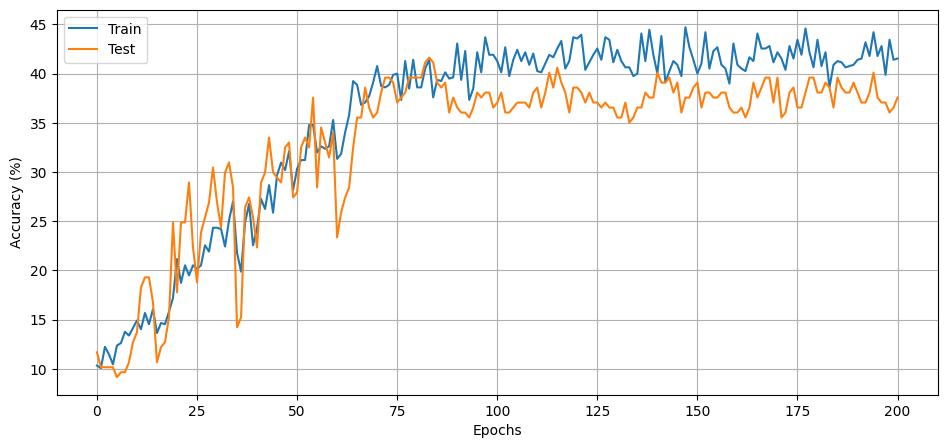

In [ ]:
plot_accuracies( [(train_accuracies, 'Train'), (test_accuracies, 'Test')])

### No weights, 32x32 images

In [ ]:
# train_loader = DataLoader(TensorDataset(torch.tensor(X_train), torch.tensor(y_train)), batch_size=32, shuffle=True, num_workers=2)
# test_loader = DataLoader(TensorDataset(torch.tensor(X_test), torch.tensor(y_test)), batch_size=32, shuffle=False, num_workers=2)

train_dataset = transform_dataset(X_train, y_train)
test_dataset = transform_dataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

y_transformed  (780,)
X_transformed_new  (780,)
y_transformed_new  (780,)
X_transformed final  torch.Size([780, 3, 32, 32])
y_transformed final  torch.Size([780])
y_transformed  (196,)
X_transformed_new  (196,)
y_transformed_new  (196,)
X_transformed final  torch.Size([196, 3, 32, 32])
y_transformed final  torch.Size([196])


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:2007: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  result = asarray(a).shape
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:2007: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


In [ ]:
best_test_accuracy, train_accuracies, test_accuracies = train_and_test(model, train_loader, test_loader, device, num_classes, learning_rate=0.0001, epochs=350, patience_optim=10, patience=50)

Epoch 1:
Train Accuracy: 0.26%, Train Loss: 6.9945
Test Accuracy: 0.00%, Test Loss: 6.9003


Epoch 2:
Train Accuracy: 2.44%, Train Loss: 6.8325
Test Accuracy: 10.20%, Test Loss: 6.8898


Epoch 3:
Train Accuracy: 5.38%, Train Loss: 6.6406
Test Accuracy: 7.65%, Test Loss: 6.8792


Epoch 4:
Train Accuracy: 9.23%, Train Loss: 6.5836
Test Accuracy: 7.65%, Test Loss: 6.8518


Epoch 5:
Train Accuracy: 12.56%, Train Loss: 6.5025
Test Accuracy: 7.65%, Test Loss: 6.8189


Epoch 6:
Train Accuracy: 13.59%, Train Loss: 6.3546
Test Accuracy: 7.65%, Test Loss: 6.7709


Epoch 7:
Train Accuracy: 12.44%, Train Loss: 6.2830
Test Accuracy: 7.65%, Test Loss: 6.7097


Epoch 8:
Train Accuracy: 14.62%, Train Loss: 6.2511
Test Accuracy: 7.65%, Test Loss: 6.6149


Epoch 9:
Train Accuracy: 13.59%, Train Loss: 6.0842
Test Accuracy: 7.65%, Test Loss: 6.4924


Epoch 10:
Train Accuracy: 12.95%, Train Loss: 6.0141
Test Accuracy: 7.14%, Test Loss: 6.3381


Epoch 11:
Train Accuracy: 13.08%, Train Loss: 5.9240
Test Accuracy: 8.16%, Test Loss: 6.1514


Epoch 12:
Train Accuracy: 13.08%, Train Loss: 5.8683
Test Accuracy: 8.16%, Test Loss: 5.9788


Epoch 13:
Train Accuracy: 14.49%, Train Loss: 5.6580
Test Accuracy: 9.18%, Test Loss: 5.7309
Epoch 00013: reducing learning rate of group 0 to 1.0000e-05.


Epoch 14:
Train Accuracy: 13.21%, Train Loss: 5.6138
Test Accuracy: 9.18%, Test Loss: 5.7382


Epoch 15:
Train Accuracy: 13.97%, Train Loss: 5.6273
Test Accuracy: 8.67%, Test Loss: 5.8450


Epoch 16:
Train Accuracy: 13.97%, Train Loss: 5.5501
Test Accuracy: 8.16%, Test Loss: 5.8018


Epoch 17:
Train Accuracy: 13.72%, Train Loss: 5.5955
Test Accuracy: 9.18%, Test Loss: 5.7378


Epoch 18:
Train Accuracy: 14.10%, Train Loss: 5.5406
Test Accuracy: 8.67%, Test Loss: 5.8745


Epoch 19:
Train Accuracy: 12.56%, Train Loss: 5.5221
Test Accuracy: 8.67%, Test Loss: 5.7175


Epoch 20:
Train Accuracy: 13.85%, Train Loss: 5.5594
Test Accuracy: 8.67%, Test Loss: 5.7506


Epoch 21:
Train Accuracy: 13.08%, Train Loss: 5.5517
Test Accuracy: 8.67%, Test Loss: 5.6660


Epoch 22:
Train Accuracy: 12.31%, Train Loss: 5.4901
Test Accuracy: 8.67%, Test Loss: 5.6580


Epoch 23:
Train Accuracy: 14.62%, Train Loss: 5.4551
Test Accuracy: 8.67%, Test Loss: 5.6379


Epoch 24:
Train Accuracy: 13.46%, Train Loss: 5.5590
Test Accuracy: 8.67%, Test Loss: 5.6133
Epoch 00024: reducing learning rate of group 0 to 1.0000e-06.


Epoch 25:
Train Accuracy: 14.62%, Train Loss: 5.5383
Test Accuracy: 8.16%, Test Loss: 5.6350


Epoch 26:
Train Accuracy: 13.72%, Train Loss: 5.4582
Test Accuracy: 8.67%, Test Loss: 5.6163


Epoch 27:
Train Accuracy: 14.23%, Train Loss: 5.4544
Test Accuracy: 9.69%, Test Loss: 5.6223


Epoch 28:
Train Accuracy: 14.36%, Train Loss: 5.4506
Test Accuracy: 9.69%, Test Loss: 5.7703


Epoch 29:
Train Accuracy: 13.72%, Train Loss: 5.4186
Test Accuracy: 8.67%, Test Loss: 5.5957


Epoch 30:
Train Accuracy: 13.21%, Train Loss: 5.5069
Test Accuracy: 8.67%, Test Loss: 5.7389


Epoch 31:
Train Accuracy: 13.46%, Train Loss: 5.4172
Test Accuracy: 9.18%, Test Loss: 5.6785


Epoch 32:
Train Accuracy: 13.72%, Train Loss: 5.4587
Test Accuracy: 9.18%, Test Loss: 5.8147


Epoch 33:
Train Accuracy: 13.72%, Train Loss: 5.4115
Test Accuracy: 8.16%, Test Loss: 5.7099


Epoch 34:
Train Accuracy: 13.59%, Train Loss: 5.4905
Test Accuracy: 9.18%, Test Loss: 5.6146


Epoch 35:
Train Accuracy: 13.59%, Train Loss: 5.4551
Test Accuracy: 8.16%, Test Loss: 5.7137
Epoch 00035: reducing learning rate of group 0 to 1.0000e-07.


Epoch 36:
Train Accuracy: 13.46%, Train Loss: 5.5121
Test Accuracy: 8.67%, Test Loss: 5.5954


Epoch 37:
Train Accuracy: 13.21%, Train Loss: 5.4829
Test Accuracy: 8.67%, Test Loss: 5.5922


Epoch 38:
Train Accuracy: 13.72%, Train Loss: 5.4264
Test Accuracy: 8.67%, Test Loss: 5.6168


Epoch 39:
Train Accuracy: 12.82%, Train Loss: 5.4966
Test Accuracy: 8.67%, Test Loss: 5.5727


Epoch 40:
Train Accuracy: 14.49%, Train Loss: 5.5126
Test Accuracy: 8.16%, Test Loss: 5.7057


Epoch 41:
Train Accuracy: 14.49%, Train Loss: 5.4862
Test Accuracy: 9.18%, Test Loss: 5.5910


Epoch 42:
Train Accuracy: 14.36%, Train Loss: 5.3712
Test Accuracy: 8.67%, Test Loss: 5.5934


Epoch 43:
Train Accuracy: 13.21%, Train Loss: 5.4206
Test Accuracy: 8.16%, Test Loss: 5.5836


Epoch 44:
Train Accuracy: 13.33%, Train Loss: 5.4981
Test Accuracy: 8.67%, Test Loss: 5.5827


Epoch 45:
Train Accuracy: 12.44%, Train Loss: 5.5111
Test Accuracy: 8.67%, Test Loss: 5.5612


Epoch 46:
Train Accuracy: 13.21%, Train Loss: 5.4158
Test Accuracy: 8.67%, Test Loss: 5.6377
Epoch 00046: reducing learning rate of group 0 to 1.0000e-08.


Epoch 47:
Train Accuracy: 13.08%, Train Loss: 5.4456
Test Accuracy: 8.16%, Test Loss: 5.6629


Epoch 48:
Train Accuracy: 13.72%, Train Loss: 5.4036
Test Accuracy: 8.67%, Test Loss: 5.6090


Epoch 49:
Train Accuracy: 15.90%, Train Loss: 5.4505
Test Accuracy: 8.67%, Test Loss: 5.6100


Epoch 50:
Train Accuracy: 13.33%, Train Loss: 5.3962
Test Accuracy: 8.67%, Test Loss: 5.6088


Epoch 51:
Train Accuracy: 13.21%, Train Loss: 5.4040
Test Accuracy: 8.67%, Test Loss: 5.6143


Epoch 52:
Train Accuracy: 14.10%, Train Loss: 5.4290
Test Accuracy: 9.69%, Test Loss: 5.5531


Epoch 53:
Train Accuracy: 13.72%, Train Loss: 5.4555
Test Accuracy: 8.16%, Test Loss: 5.6557


Epoch 54:
Train Accuracy: 13.08%, Train Loss: 5.4642
Test Accuracy: 9.18%, Test Loss: 5.6428


Epoch 55:
Train Accuracy: 13.85%, Train Loss: 5.4620
Test Accuracy: 8.16%, Test Loss: 5.6030


Epoch 56:
Train Accuracy: 13.97%, Train Loss: 5.4775
Test Accuracy: 8.67%, Test Loss: 5.5809


Epoch 57:
Train Accuracy: 13.21%, Train Loss: 5.4852
Test Accuracy: 8.16%, Test Loss: 5.6002


Epoch 58:
Train Accuracy: 13.97%, Train Loss: 5.4677
Test Accuracy: 9.18%, Test Loss: 5.6372


Epoch 59:
Train Accuracy: 12.95%, Train Loss: 5.4475
Test Accuracy: 8.67%, Test Loss: 5.6159


Epoch 60:
Train Accuracy: 13.97%, Train Loss: 5.4268
Test Accuracy: 8.16%, Test Loss: 5.6419


Epoch 61:
Train Accuracy: 14.49%, Train Loss: 5.4595
Test Accuracy: 8.67%, Test Loss: 5.6034


Epoch 62:
Train Accuracy: 13.33%, Train Loss: 5.4871
Test Accuracy: 8.67%, Test Loss: 5.6924


Epoch 63:
Train Accuracy: 14.23%, Train Loss: 5.4844
Test Accuracy: 8.16%, Test Loss: 5.6920


Epoch 64:
Train Accuracy: 14.10%, Train Loss: 5.4768
Test Accuracy: 8.67%, Test Loss: 5.6889


Epoch 65:
Train Accuracy: 13.97%, Train Loss: 5.4306
Test Accuracy: 9.18%, Test Loss: 5.5684


Epoch 66:
Train Accuracy: 13.46%, Train Loss: 5.4724
Test Accuracy: 8.16%, Test Loss: 5.6204


Epoch 67:
Train Accuracy: 14.10%, Train Loss: 5.4521
Test Accuracy: 8.67%, Test Loss: 5.6675


Epoch 68:
Train Accuracy: 14.62%, Train Loss: 5.4754
Test Accuracy: 9.18%, Test Loss: 5.6112


Epoch 69:
Train Accuracy: 14.10%, Train Loss: 5.4094
Test Accuracy: 8.67%, Test Loss: 5.6429


Epoch 70:
Train Accuracy: 13.59%, Train Loss: 5.4198
Test Accuracy: 8.67%, Test Loss: 5.6196


Epoch 71:
Train Accuracy: 13.97%, Train Loss: 5.4683
Test Accuracy: 8.16%, Test Loss: 5.6339


Epoch 72:
Train Accuracy: 14.23%, Train Loss: 5.4661
Test Accuracy: 8.67%, Test Loss: 5.6305


Epoch 73:
Train Accuracy: 12.69%, Train Loss: 5.4099
Test Accuracy: 8.16%, Test Loss: 5.5962


Epoch 74:
Train Accuracy: 13.59%, Train Loss: 5.3919
Test Accuracy: 8.67%, Test Loss: 5.5784


Epoch 75:
Train Accuracy: 13.08%, Train Loss: 5.5342
Test Accuracy: 8.67%, Test Loss: 5.5534


Epoch 76:
Train Accuracy: 13.08%, Train Loss: 5.4839
Test Accuracy: 9.18%, Test Loss: 5.6555


Epoch 77:
Train Accuracy: 14.10%, Train Loss: 5.4311
Test Accuracy: 8.16%, Test Loss: 5.6198


Epoch 78:
Train Accuracy: 14.87%, Train Loss: 5.5166
Test Accuracy: 9.18%, Test Loss: 5.5912


Epoch 79:
Train Accuracy: 13.21%, Train Loss: 5.4594
Test Accuracy: 9.69%, Test Loss: 5.5557


Epoch 80:
Train Accuracy: 14.36%, Train Loss: 5.4996
Test Accuracy: 8.67%, Test Loss: 5.6547


Epoch 81:
Train Accuracy: 12.95%, Train Loss: 5.4858
Test Accuracy: 9.18%, Test Loss: 5.5761


Epoch 82:
Train Accuracy: 13.72%, Train Loss: 5.5011
Test Accuracy: 8.67%, Test Loss: 5.5844


Epoch 83:
Train Accuracy: 13.97%, Train Loss: 5.4251
Test Accuracy: 8.67%, Test Loss: 5.6671


Epoch 84:
Train Accuracy: 14.10%, Train Loss: 5.3997
Test Accuracy: 8.16%, Test Loss: 5.6349


Epoch 85:
Train Accuracy: 14.10%, Train Loss: 5.4716
Test Accuracy: 8.16%, Test Loss: 5.7006


Epoch 86:
Train Accuracy: 12.95%, Train Loss: 5.4902
Test Accuracy: 8.67%, Test Loss: 5.6758


Epoch 87:
Train Accuracy: 13.97%, Train Loss: 5.5326
Test Accuracy: 8.16%, Test Loss: 5.5936


Epoch 88:
Train Accuracy: 13.85%, Train Loss: 5.4292
Test Accuracy: 8.67%, Test Loss: 5.6024


Epoch 89:
Train Accuracy: 13.85%, Train Loss: 5.4153
Test Accuracy: 8.67%, Test Loss: 5.5988


Epoch 90:
Train Accuracy: 13.97%, Train Loss: 5.4670
Test Accuracy: 8.67%, Test Loss: 5.6011


Epoch 91:
Train Accuracy: 13.21%, Train Loss: 5.4215
Test Accuracy: 8.16%, Test Loss: 5.6504


Epoch 92:
Train Accuracy: 13.21%, Train Loss: 5.3978
Test Accuracy: 8.16%, Test Loss: 5.5686


Epoch 93:
Train Accuracy: 14.74%, Train Loss: 5.3818
Test Accuracy: 9.18%, Test Loss: 5.5617


Epoch 94:
Train Accuracy: 13.59%, Train Loss: 5.4442
Test Accuracy: 9.18%, Test Loss: 5.5889


Epoch 95:
Train Accuracy: 13.72%, Train Loss: 5.4612
Test Accuracy: 9.18%, Test Loss: 5.5749


Epoch 96:
Train Accuracy: 14.23%, Train Loss: 5.4735
Test Accuracy: 8.16%, Test Loss: 5.5484


Epoch 97:
Train Accuracy: 13.85%, Train Loss: 5.4021
Test Accuracy: 8.67%, Test Loss: 5.5524


Epoch 98:
Train Accuracy: 14.62%, Train Loss: 5.4394
Test Accuracy: 9.18%, Test Loss: 5.5730


Epoch 99:
Train Accuracy: 13.85%, Train Loss: 5.4719
Test Accuracy: 8.16%, Test Loss: 5.5729


Epoch 100:
Train Accuracy: 13.72%, Train Loss: 5.4611
Test Accuracy: 9.18%, Test Loss: 5.5779


Epoch 101:
Train Accuracy: 12.31%, Train Loss: 5.4587
Test Accuracy: 8.67%, Test Loss: 5.5918


Epoch 102:
Train Accuracy: 12.69%, Train Loss: 5.4395
Test Accuracy: 9.18%, Test Loss: 5.6128


Epoch 103:
Train Accuracy: 13.97%, Train Loss: 5.4064
Test Accuracy: 8.67%, Test Loss: 5.5704


Epoch 104:
Train Accuracy: 12.95%, Train Loss: 5.3963
Test Accuracy: 8.67%, Test Loss: 5.5885


Epoch 105:
Train Accuracy: 13.21%, Train Loss: 5.4368
Test Accuracy: 9.18%, Test Loss: 5.5828


Epoch 106:
Train Accuracy: 13.59%, Train Loss: 5.4213
Test Accuracy: 9.18%, Test Loss: 5.5846


Epoch 107:
Train Accuracy: 13.08%, Train Loss: 5.4984
Test Accuracy: 8.16%, Test Loss: 5.5855


Epoch 108:
Train Accuracy: 13.97%, Train Loss: 5.4866
Test Accuracy: 8.67%, Test Loss: 5.7373


Epoch 109:
Train Accuracy: 12.69%, Train Loss: 5.4635
Test Accuracy: 9.18%, Test Loss: 5.6403


Epoch 110:
Train Accuracy: 13.33%, Train Loss: 5.4992
Test Accuracy: 8.67%, Test Loss: 5.5999


Epoch 111:
Train Accuracy: 13.85%, Train Loss: 5.4787
Test Accuracy: 8.67%, Test Loss: 5.5769


Epoch 112:
Train Accuracy: 13.59%, Train Loss: 5.4566
Test Accuracy: 8.67%, Test Loss: 5.5821


Epoch 113:
Train Accuracy: 13.59%, Train Loss: 5.3597
Test Accuracy: 9.18%, Test Loss: 5.5687


Epoch 114:
Train Accuracy: 15.38%, Train Loss: 5.3875
Test Accuracy: 8.67%, Test Loss: 5.5792


Epoch 115:
Train Accuracy: 13.85%, Train Loss: 5.4552
Test Accuracy: 8.67%, Test Loss: 5.5873


Epoch 116:
Train Accuracy: 13.21%, Train Loss: 5.4785
Test Accuracy: 8.67%, Test Loss: 5.6164


Epoch 117:
Train Accuracy: 13.97%, Train Loss: 5.4741
Test Accuracy: 8.67%, Test Loss: 5.5971


Epoch 118:
Train Accuracy: 14.36%, Train Loss: 5.4696
Test Accuracy: 8.16%, Test Loss: 5.6290


Epoch 119:
Train Accuracy: 14.23%, Train Loss: 5.4733
Test Accuracy: 8.16%, Test Loss: 5.6429


Epoch 120:
Train Accuracy: 13.97%, Train Loss: 5.5161
Test Accuracy: 8.67%, Test Loss: 5.6507


Epoch 121:
Train Accuracy: 14.49%, Train Loss: 5.4501
Test Accuracy: 8.16%, Test Loss: 5.7417


Epoch 122:
Train Accuracy: 13.46%, Train Loss: 5.4619
Test Accuracy: 8.67%, Test Loss: 5.6500


Epoch 123:
Train Accuracy: 13.21%, Train Loss: 5.4604
Test Accuracy: 8.16%, Test Loss: 5.6014


Epoch 124:
Train Accuracy: 13.59%, Train Loss: 5.4079
Test Accuracy: 8.67%, Test Loss: 5.5862


Epoch 125:
Train Accuracy: 13.59%, Train Loss: 5.4536
Test Accuracy: 9.18%, Test Loss: 5.5875


Epoch 126:
Train Accuracy: 13.72%, Train Loss: 5.4335
Test Accuracy: 8.67%, Test Loss: 5.6183


Epoch 127:
Train Accuracy: 13.85%, Train Loss: 5.4006
Test Accuracy: 8.16%, Test Loss: 5.5777


Epoch 128:
Train Accuracy: 14.36%, Train Loss: 5.4612
Test Accuracy: 8.67%, Test Loss: 5.5911


Epoch 129:
Train Accuracy: 13.59%, Train Loss: 5.4523
Test Accuracy: 8.67%, Test Loss: 5.6186


Epoch 130:
Train Accuracy: 14.87%, Train Loss: 5.3720
Test Accuracy: 8.67%, Test Loss: 5.6990


Epoch 131:
Train Accuracy: 12.18%, Train Loss: 5.4805
Test Accuracy: 8.67%, Test Loss: 5.5570


Epoch 132:
Train Accuracy: 12.82%, Train Loss: 5.4627
Test Accuracy: 8.67%, Test Loss: 5.5771


Epoch 133:
Train Accuracy: 14.10%, Train Loss: 5.4756
Test Accuracy: 9.18%, Test Loss: 5.5810


Epoch 134:
Train Accuracy: 13.59%, Train Loss: 5.4912
Test Accuracy: 9.69%, Test Loss: 5.6044


Epoch 135:
Train Accuracy: 12.95%, Train Loss: 5.4287
Test Accuracy: 8.67%, Test Loss: 5.6699


Epoch 136:
Train Accuracy: 13.08%, Train Loss: 5.4285
Test Accuracy: 8.67%, Test Loss: 5.8490


Epoch 137:
Train Accuracy: 13.08%, Train Loss: 5.4615
Test Accuracy: 8.67%, Test Loss: 5.7516


Epoch 138:
Train Accuracy: 14.36%, Train Loss: 5.4391
Test Accuracy: 8.67%, Test Loss: 5.6003


Epoch 139:
Train Accuracy: 13.59%, Train Loss: 5.4384
Test Accuracy: 8.67%, Test Loss: 5.5635


Epoch 140:
Train Accuracy: 14.36%, Train Loss: 5.4488
Test Accuracy: 8.67%, Test Loss: 5.5741


Epoch 141:
Train Accuracy: 13.08%, Train Loss: 5.4132
Test Accuracy: 8.67%, Test Loss: 5.5967


Epoch 142:
Train Accuracy: 13.08%, Train Loss: 5.4004
Test Accuracy: 9.18%, Test Loss: 5.5990


Epoch 143:
Train Accuracy: 12.82%, Train Loss: 5.4317
Test Accuracy: 9.18%, Test Loss: 5.6200


Epoch 144:
Train Accuracy: 14.36%, Train Loss: 5.4275
Test Accuracy: 9.69%, Test Loss: 5.6709


Epoch 145:
Train Accuracy: 13.59%, Train Loss: 5.5252
Test Accuracy: 8.67%, Test Loss: 5.7211


Epoch 146:
Train Accuracy: 13.97%, Train Loss: 5.4167
Test Accuracy: 8.16%, Test Loss: 5.6335


Epoch 147:
Train Accuracy: 14.36%, Train Loss: 5.4543
Test Accuracy: 8.67%, Test Loss: 5.6051


Epoch 148:
Train Accuracy: 13.08%, Train Loss: 5.4437
Test Accuracy: 8.16%, Test Loss: 5.6140


Epoch 149:
Train Accuracy: 13.46%, Train Loss: 5.4021
Test Accuracy: 8.16%, Test Loss: 5.5757


Epoch 150:
Train Accuracy: 13.46%, Train Loss: 5.4463
Test Accuracy: 9.18%, Test Loss: 5.5998


Epoch 151:
Train Accuracy: 13.46%, Train Loss: 5.4750
Test Accuracy: 8.67%, Test Loss: 5.6016


Epoch 152:
Train Accuracy: 12.82%, Train Loss: 5.4847
Test Accuracy: 9.18%, Test Loss: 5.5968


Epoch 153:
Train Accuracy: 12.56%, Train Loss: 5.4488
Test Accuracy: 8.16%, Test Loss: 5.5944


Epoch 154:
Train Accuracy: 13.97%, Train Loss: 5.4724
Test Accuracy: 8.67%, Test Loss: 5.6050


Epoch 155:
Train Accuracy: 13.33%, Train Loss: 5.4545
Test Accuracy: 9.18%, Test Loss: 5.5738


Epoch 156:
Train Accuracy: 14.10%, Train Loss: 5.5001
Test Accuracy: 8.16%, Test Loss: 5.5971


Epoch 157:
Train Accuracy: 13.46%, Train Loss: 5.4645
Test Accuracy: 8.67%, Test Loss: 5.5878


Epoch 158:
Train Accuracy: 13.85%, Train Loss: 5.4780
Test Accuracy: 7.65%, Test Loss: 5.6102


Epoch 159:
Train Accuracy: 13.72%, Train Loss: 5.4410
Test Accuracy: 8.67%, Test Loss: 5.6187


Epoch 160:
Train Accuracy: 13.97%, Train Loss: 5.4537
Test Accuracy: 9.18%, Test Loss: 5.5898


Epoch 161:
Train Accuracy: 13.08%, Train Loss: 5.5009
Test Accuracy: 8.67%, Test Loss: 5.5886


Epoch 162:
Train Accuracy: 14.49%, Train Loss: 5.4498
Test Accuracy: 8.67%, Test Loss: 5.6049


Epoch 163:
Train Accuracy: 12.95%, Train Loss: 5.4568
Test Accuracy: 8.67%, Test Loss: 5.5525


Epoch 164:
Train Accuracy: 14.36%, Train Loss: 5.4317
Test Accuracy: 8.67%, Test Loss: 5.5928


Epoch 165:
Train Accuracy: 13.46%, Train Loss: 5.4493
Test Accuracy: 8.67%, Test Loss: 5.5820


Epoch 166:
Train Accuracy: 13.59%, Train Loss: 5.4354
Test Accuracy: 9.18%, Test Loss: 5.5579


Epoch 167:
Train Accuracy: 13.08%, Train Loss: 5.4115
Test Accuracy: 8.67%, Test Loss: 5.5922


Epoch 168:
Train Accuracy: 14.10%, Train Loss: 5.4923
Test Accuracy: 8.16%, Test Loss: 5.5750


Epoch 169:
Train Accuracy: 14.49%, Train Loss: 5.3380
Test Accuracy: 8.16%, Test Loss: 5.6288


Epoch 170:
Train Accuracy: 13.85%, Train Loss: 5.4411
Test Accuracy: 8.67%, Test Loss: 5.6308


Epoch 171:
Train Accuracy: 13.33%, Train Loss: 5.3952
Test Accuracy: 8.67%, Test Loss: 5.5926


Epoch 172:
Train Accuracy: 13.46%, Train Loss: 5.5622
Test Accuracy: 8.67%, Test Loss: 5.6105


Epoch 173:
Train Accuracy: 14.23%, Train Loss: 5.4098
Test Accuracy: 8.67%, Test Loss: 5.6167


Epoch 174:
Train Accuracy: 12.69%, Train Loss: 5.5377
Test Accuracy: 8.67%, Test Loss: 5.6066


Epoch 175:
Train Accuracy: 15.13%, Train Loss: 5.4132
Test Accuracy: 8.16%, Test Loss: 5.7834


Epoch 176:
Train Accuracy: 13.97%, Train Loss: 5.4010
Test Accuracy: 8.67%, Test Loss: 5.6188


Epoch 177:
Train Accuracy: 13.08%, Train Loss: 5.5239
Test Accuracy: 8.16%, Test Loss: 5.6101


Epoch 178:
Train Accuracy: 14.49%, Train Loss: 5.4031
Test Accuracy: 8.67%, Test Loss: 5.6596


Epoch 179:
Train Accuracy: 13.97%, Train Loss: 5.4477
Test Accuracy: 8.67%, Test Loss: 5.5802


Epoch 180:
Train Accuracy: 13.33%, Train Loss: 5.4734
Test Accuracy: 8.67%, Test Loss: 5.5876


Epoch 181:
Train Accuracy: 14.36%, Train Loss: 5.5054
Test Accuracy: 8.67%, Test Loss: 5.5858


Epoch 182:
Train Accuracy: 13.46%, Train Loss: 5.3973
Test Accuracy: 8.16%, Test Loss: 5.6067


Epoch 183:
Train Accuracy: 12.44%, Train Loss: 5.4617
Test Accuracy: 8.67%, Test Loss: 5.6305


Epoch 184:
Train Accuracy: 13.33%, Train Loss: 5.4965
Test Accuracy: 9.18%, Test Loss: 5.6453


Epoch 185:
Train Accuracy: 13.59%, Train Loss: 5.5054
Test Accuracy: 8.67%, Test Loss: 5.5877


Epoch 186:
Train Accuracy: 14.10%, Train Loss: 5.3946
Test Accuracy: 8.16%, Test Loss: 5.5986


Epoch 187:
Train Accuracy: 12.69%, Train Loss: 5.3966
Test Accuracy: 8.67%, Test Loss: 5.7172


Epoch 188:
Train Accuracy: 14.36%, Train Loss: 5.4378
Test Accuracy: 8.16%, Test Loss: 5.6153


Epoch 189:
Train Accuracy: 14.62%, Train Loss: 5.4506
Test Accuracy: 8.67%, Test Loss: 5.5738


Epoch 190:
Train Accuracy: 13.21%, Train Loss: 5.4576
Test Accuracy: 8.67%, Test Loss: 5.5791


Epoch 191:
Train Accuracy: 13.97%, Train Loss: 5.3708
Test Accuracy: 9.18%, Test Loss: 5.6292


Epoch 192:
Train Accuracy: 13.59%, Train Loss: 5.4468
Test Accuracy: 8.67%, Test Loss: 5.5965


Epoch 193:
Train Accuracy: 13.33%, Train Loss: 5.4774
Test Accuracy: 8.16%, Test Loss: 5.6025


Epoch 194:
Train Accuracy: 14.36%, Train Loss: 5.4196
Test Accuracy: 8.67%, Test Loss: 5.5588


Epoch 195:
Train Accuracy: 13.59%, Train Loss: 5.4293
Test Accuracy: 8.16%, Test Loss: 5.5896


Epoch 196:
Train Accuracy: 13.33%, Train Loss: 5.4756
Test Accuracy: 8.67%, Test Loss: 5.5926


Epoch 197:
Train Accuracy: 13.33%, Train Loss: 5.4028
Test Accuracy: 8.67%, Test Loss: 5.5868


Epoch 198:
Train Accuracy: 13.59%, Train Loss: 5.4220
Test Accuracy: 8.67%, Test Loss: 5.6164


Epoch 199:
Train Accuracy: 13.97%, Train Loss: 5.4794
Test Accuracy: 8.67%, Test Loss: 5.6297


Epoch 200:
Train Accuracy: 12.69%, Train Loss: 5.4451
Test Accuracy: 9.18%, Test Loss: 5.5841


Epoch 201:
Train Accuracy: 12.56%, Train Loss: 5.4768
Test Accuracy: 8.67%, Test Loss: 5.5827
Early stopping after 50 epochs without improvement.
Best Test Accuracy: 10.20%


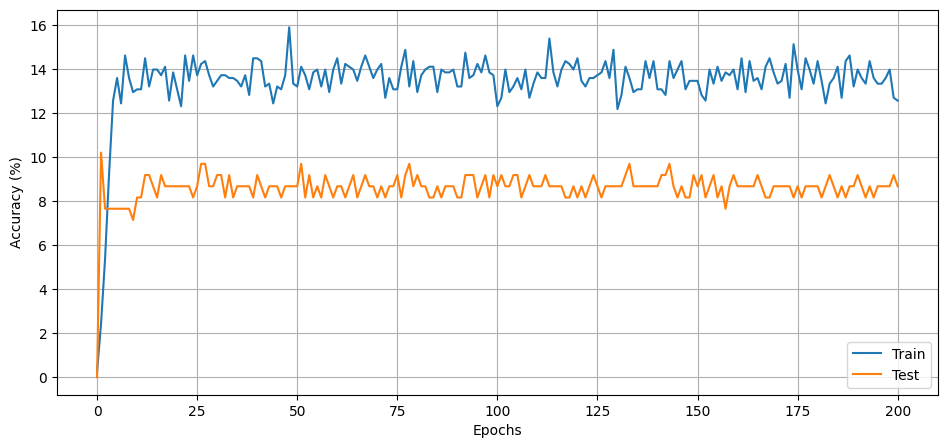

In [ ]:
plot_accuracies([(train_accuracies, 'Train'), (test_accuracies, 'Test')])

## Testing on pre-trained model



### Results

#### Train and test with default weights

#### Test only with default weights and pre-trained model

In [ ]:
def test_efficientnet_b0_model():
    """
    Load the pre-trained EfficientNetB0 model.
    """
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT, num_classes=num_classes)
    model.eval()
    return model

def test_efficientnet_v2_s_model():
    """
    Load the pre-trained EfficientNet-V2-S model.
    """
    model = models.efficientnet_v2_s(weights=models.EfficientNet_V2_S_Weights.DEFAULT, num_classes=num_classes)
    model.eval()
    return model

def test_resnet50_model():
    """
    Load the pre-trained ResNet50 model.
    """
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2, num_classes=num_classes)
    model.eval()
    return model

In [ ]:
# Optimizer, loss function, and learning rate scheduler
criterion = nn.CrossEntropyLoss()

Efficientnet_v2_s

In [ ]:
test_accuracy, test_loss = test(test_efficientnet_v2_s_model().to(device), test_loader, device, criterion)
print(f'Efficientnet_v2_s Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')

Efficientnet_v2_s Test Accuracy: 84.06%, Test Loss: 0.7213


Efficientnet_b0

In [ ]:
test_accuracy, test_loss = test(test_efficientnet_b0_model().to(device), test_loader, device, criterion)
print(f'Efficientnet_b0 Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')

Efficientnet_b0 Test Accuracy: 78.99%, Test Loss: 0.8590


Resnet50

In [ ]:
test_accuracy, test_loss = test(test_resnet50_model().to(device), test_loader, device, criterion)
print(f'Resnet50 Test Accuracy: {test_accuracy:.2f}%, Test Loss: {test_loss:.4f}')

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 50.2MB/s]
                                                      

Resnet50 Test Accuracy: 81.16%, Test Loss: 3.4024


# MNIST

# HyperParameter Check without Scheduler

## Initialization

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

# Upload your Kaggle.json here
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Mounted at /content/gdrive/


Saving kaggle.json to kaggle (2).json
mkdir: cannot create directory ‘/root/.kaggle’: File exists


## Helper Functions

In [ ]:
import torch
import time
import torch.optim as optim
import torch.nn as nn

# Trains and returns accuracies of the model
def trainEfficientNet(model, train_loader, test_loader):
    start_time = time.time()

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    learning_rate = 0.001
    # model
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()

    epochs = 350
    accuracies_train = []
    accuracies_test = []
    loss_train = []
    loss_test = []

    for epoch in range(epochs):
        # Training
        model.train()
        correct_train = 0
        total_train = 0
        for i, (inputs, labels) in enumerate(train_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            # Loss
            loss = criterion(outputs, labels)
            loss_train.append(loss.item())
            optimizer.zero_grad()
            # Computes gradient
            loss.backward()
            optimizer.step()
            # Accuracy
            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        # Testing
        model.eval()
        correct_test = 0
        total_test = 0
        with torch.no_grad():
            for j, (inputs, labels) in enumerate(test_loader):
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss_test.append(loss.item())
                _, predicted = torch.max(outputs.data, 1)
                total_test += labels.size(0)
                correct_test += (predicted == labels).sum().item()

        print('Epoch: {}, Train Accuracy: {:.2f}%'.format(epoch+1, 100*correct_train/total_train))
        print('Epoch: {}, Test Accuracy: {:.2f}%'.format(epoch+1, 100*correct_test/total_test))
        accuracies_train.append(correct_train/total_train*100)
        accuracies_test.append(correct_test/total_test*100)

    end_time = time.time()
    elapsed_time = end_time - start_time

    return accuracies_train, accuracies_test, elapsed_time

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split

def split_data(data, labels, test_size=0.2, random_state=42):
    """
    Splits the input data and labels arrays into a training and test set.

    Args:
    - data (numpy array): the input data array
    - labels (numpy array): the corresponding label array
    - test_size (float, optional): the proportion of the dataset to include in the test split (default=0.2)
    - random_state (int, optional): the seed used by the random number generator (default=42)

    Returns:
    - X_train (numpy array): the training data
    - X_test (numpy array): the test data
    - y_train (numpy array): the training labels
    - y_test (numpy array): the test labels
    """

    # Split the data and labels into a training and test set
    X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=test_size, random_state=random_state)

    return X_train, X_test, y_train, y_test

In [ ]:
import matplotlib.pyplot as plt

def plot_accuracies(accuracy_list, figsize=(25, 5)):
    fig = plt.figure(figsize=figsize) # set the figure width to 25 inches and height to 5 inches
    plt.subplot(1,2,1)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    for acc, label in accuracy_list:
        plt.plot(acc, label=label)
    plt.grid()
    plt.legend()
    plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_bar_chart(time_label_list):
    # Unzip the tuples into two lists: time and label
    time, label = zip(*time_label_list)

    # Set up the bar chart with a wider figure size
    fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the width (12) and height (6) as needed
    bars = ax.bar(label, time)

    # Set chart title and labels
    ax.set_title('Time vs Model')
    ax.set_xlabel('Model')
    ax.set_ylabel('Time (seconds)')


    # Display the chart
    plt.show()


In [ ]:
import torch
from torch.utils.data import TensorDataset
import numpy as np
from PIL import Image
import torchvision.models as models
from torchvision.transforms import transforms

def transform_dataset(X, y, size=32):
    """
    Transforms a list of numpy arrays containing images of different sizes into a PyTorch TensorDataset object.

    Args:
        X (list of numpy arrays): List of input images.
        y (list or numpy array): List or numpy array of corresponding labels.
        size (int): Size of the output images. Default is 32.

    Returns:
        TensorDataset: PyTorch TensorDataset object containing the transformed images and labels.
    """
    # Define a transformation pipeline to resize the images to a fixed size and convert them to tensors
    transform = transforms.Compose([
        transforms.Resize((size, size)),  # Resize the images to size x size
        transforms.ToTensor()            # Convert the images to PyTorch tensors
    ])
    # transform = models.EfficientNet_v2_s_Weights.DEFAULT.transform()

    # Define empty arrays to store the transformed images and labels
    X_transformed = []
    y_transformed = []

    # Loop over each image in X and apply the transformation pipeline
    for i in range(len(X)):
        # Convert the numpy array to a PIL image
        img = Image.fromarray(np.uint8(X[i]))
        # Apply the transformation pipeline to the image
        img_transformed = transform(img)

        # Append the transformed image and its corresponding label to the output arrays
        X_transformed.append(img_transformed)

    # Convert the labels to a NumPy array of integers
    classes = np.unique(y)
    y_transformed = np.searchsorted(classes, y)
    print("y_transformed")
    print(np.shape(y_transformed))

    X_transformed_new = []
    y_transformed_new = []
    for i in range(len(X_transformed)):
      if(X_transformed[i].shape[0] == 3):
        X_transformed_new.append(X_transformed[i])
        y_transformed_new.append(y_transformed[i])
      else:
        print("Deleted: ", i)

    print("X_transformed_new ", np.shape(X_transformed_new))
    print("y_transformed_new ", np.shape(y_transformed_new))

    # Convert the output arrays to PyTorch tensors
    X_transformed = torch.stack(X_transformed_new)
    y_transformed = torch.tensor(y_transformed_new)

    print("X_transformed final ", np.shape(X_transformed))
    print("y_transformed final ", np.shape(y_transformed))

    # Create a PyTorch TensorDataset object
    dataset = TensorDataset(X_transformed, y_transformed)

    return dataset

## Models

In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
## Original Model
import torchvision
from torch import nn
from torchvision.models.efficientnet import FusedMBConvConfig,MBConvConfig,EfficientNet
from functools import partial

# Creating Model

## Config For efficientnet_v2_s
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6),
    MBConvConfig(6, 3, 1, 128, 160, 9),
    MBConvConfig(6, 3, 2, 160, 256, 15),
]
last_channel = 1280

original_model = EfficientNet(inverted_residual_setting, 0.2, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Reduced Depth

## Config For efficientnet with depth multiplyer reduced to half for each layer.
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6, depth_mult= 0.01),
    MBConvConfig(6, 3, 1, 128, 160, 9, depth_mult= 0.01),
    MBConvConfig(6, 3, 2, 160, 256, 15, depth_mult= 0.01),
]
last_channel = 1280

reduced_depth_model = EfficientNet(inverted_residual_setting, 0.2, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Reduced Convulational Layers


## Config For efficientnet with depth multiplyer reduced to half for each layer.
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 1),
    FusedMBConvConfig(4, 3, 2, 24, 48, 2),
    FusedMBConvConfig(4, 3, 2, 48, 64, 3),
    MBConvConfig(4, 3, 2, 64, 128, 3),
    MBConvConfig(6, 3, 1, 128, 160, 4),
    MBConvConfig(6, 3, 2, 160, 256, 7),
]
last_channel = 1280

reduced_conv_model = EfficientNet(inverted_residual_setting, 0.2, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Increased Dropout Rate

import torchvision
from torch import nn
from torchvision.models.efficientnet import FusedMBConvConfig,MBConvConfig,EfficientNet
from functools import partial

# Creating Model

## Config For efficientnet_v2_s
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6),
    MBConvConfig(6, 3, 1, 128, 160, 9),
    MBConvConfig(6, 3, 2, 160, 256, 15),
]
last_channel = 1280

inc_dropout_model = EfficientNet(inverted_residual_setting, 0.6, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Increased Stochastic Depth

import torchvision
from torch import nn
from torchvision.models.efficientnet import FusedMBConvConfig,MBConvConfig,EfficientNet
from functools import partial

# Creating Model

## Config For efficientnet_v2_s
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6),
    MBConvConfig(6, 3, 1, 128, 160, 9),
    MBConvConfig(6, 3, 2, 160, 256, 15),
]
last_channel = 1280

inc_stoch_depth_model = EfficientNet(inverted_residual_setting, 0.2, stochastic_depth_prob=0.5, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

## Birds DataSet

### Data Processing Birds

In [ ]:
!pip install -q kaggle
!kaggle datasets download -d arjunbasandrai/25-indian-bird-species-with-226k-images

!unzip 25-indian-bird-species-with-226k-images.zip

25-indian-bird-species-with-226k-images.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  25-indian-bird-species-with-226k-images.zip
replace training_set/Asian Green Bee-Eater/ML100845971.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
N



In [ ]:
import os
import numpy as np
from PIL import Image

data_list = []
label_list = []

for subdir, dirs, files in os.walk("./training_set"):
    for i,file in enumerate(files):
        # check if the file is an image file
        if i < 100 and file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith("png"):
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            
            # Open the image using Pillow library
            img_path = os.path.join(subdir, file)
            img = Image.open(img_path)

            # Convert the image to a numpy array and add it to the data list
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Add the label to the label list
            label_list.append(label)
            
# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

<ipython-input-14-b2263378c4d8>:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
import torch
from torch.utils.data import TensorDataset
import numpy as np
from PIL import Image
import torchvision.models as models
from torchvision.transforms import transforms

def transform_dataset(X, y, size=32):
    """
    Transforms a list of numpy arrays containing images of different sizes into a PyTorch TensorDataset object.

    Args:
        X (list of numpy arrays): List of input images.
        y (list or numpy array): List or numpy array of corresponding labels.
        size (int): Size of the output images. Default is 32.

    Returns:
        TensorDataset: PyTorch TensorDataset object containing the transformed images and labels.
    """
    # Define a transformation pipeline to resize the images to a fixed size and convert them to tensors
    transform = transforms.Compose([
        transforms.Resize((size, size)),  # Resize the images to size x size
        transforms.ToTensor()            # Convert the images to PyTorch tensors
    ])
    # transform = models.EfficientNet_v2_s_Weights.DEFAULT.transform()

    # Define empty arrays to store the transformed images and labels
    X_transformed = []
    y_transformed = []

    # Loop over each image in X and apply the transformation pipeline
    for i in range(len(X)):
        # Convert the numpy array to a PIL image
        img = Image.fromarray(np.uint8(X[i]))

        # Apply the transformation pipeline to the image
        img_transformed = transform(img)

        # Append the transformed image and its corresponding label to the output arrays
        X_transformed.append(img_transformed)

    # Convert the labels to a NumPy array of integers
    classes = np.unique(y)
    y_transformed = np.searchsorted(classes, y)

    X_transformed_new = []
    y_transformed_new = []
    for i in range(len(X_transformed)):
      if(X_transformed[i].shape[0] == 3):
        X_transformed_new.append(X_transformed[i])
        y_transformed_new.append(y_transformed[i])
      else:
        print("Deleted: ", i)

    # Convert the output arrays to PyTorch tensors
    X_transformed = torch.stack(X_transformed_new)
    y_transformed = torch.tensor(y_transformed_new)
 
    # Create a PyTorch TensorDataset object
    dataset = TensorDataset(X_transformed, y_transformed)

    return dataset

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import TensorDataset, DataLoader
from torchvision.transforms import ToTensor

## Setup
X_train, X_test, y_train, y_test = split_data(data_array, label_array)
num_classes = len(np.unique(y_train))
learning_rate = 0.001

train_dataset = transform_dataset(X_train, y_train)
test_dataset = transform_dataset(X_test, y_test)

birds_train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
birds_test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

# Cleanup
del X_train
del X_test
del y_train
del y_test
del data_list
del label_list
del data_array
del label_array

Deleted:  1044
Deleted:  1740


### Original Loop

In [ ]:
original_accuracies_train_birds, original_accuracies_test_birds, original_time_birds = trainEfficientNet(original_model, birds_train_loader, birds_test_loader)

Epoch: 1, Train Accuracy: 3.80%
Epoch: 1, Test Accuracy: 3.60%
Epoch: 2, Train Accuracy: 4.25%
Epoch: 2, Test Accuracy: 4.20%
Epoch: 3, Train Accuracy: 5.26%
Epoch: 3, Test Accuracy: 2.20%
Epoch: 4, Train Accuracy: 5.11%
Epoch: 4, Test Accuracy: 4.80%
Epoch: 5, Train Accuracy: 5.71%
Epoch: 5, Test Accuracy: 5.00%
Epoch: 6, Train Accuracy: 6.26%
Epoch: 6, Test Accuracy: 6.40%
Epoch: 7, Train Accuracy: 6.91%
Epoch: 7, Test Accuracy: 4.80%
Epoch: 8, Train Accuracy: 6.16%
Epoch: 8, Test Accuracy: 8.00%
Epoch: 9, Train Accuracy: 8.16%
Epoch: 9, Test Accuracy: 7.40%
Epoch: 10, Train Accuracy: 7.86%
Epoch: 10, Test Accuracy: 9.00%
Epoch: 11, Train Accuracy: 9.71%
Epoch: 11, Test Accuracy: 6.40%
Epoch: 12, Train Accuracy: 10.96%
Epoch: 12, Test Accuracy: 7.60%
Epoch: 13, Train Accuracy: 11.76%
Epoch: 13, Test Accuracy: 8.00%
Epoch: 14, Train Accuracy: 12.81%
Epoch: 14, Test Accuracy: 8.20%
Epoch: 15, Train Accuracy: 11.76%
Epoch: 15, Test Accuracy: 8.00%
Epoch: 16, Train Accuracy: 13.61%
Epoch

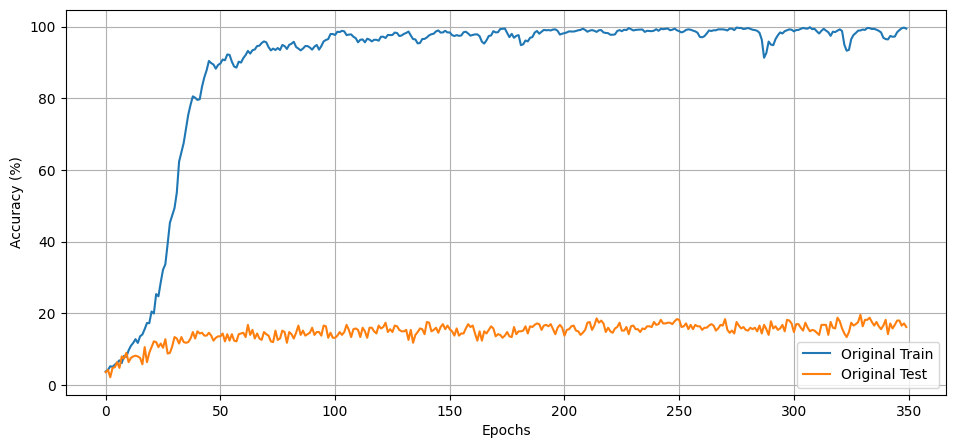

In [ ]:
accuracy_list = [(original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Depth

In [ ]:
reduced_depth_accuracies_train_birds, reduced_depth_accuracies_test_birds, reduced_depth_time_birds = trainEfficientNet(reduced_depth_model, birds_train_loader, birds_test_loader)

Epoch: 1, Train Accuracy: 5.36%
Epoch: 1, Test Accuracy: 3.00%
Epoch: 2, Train Accuracy: 13.51%
Epoch: 2, Test Accuracy: 5.00%
Epoch: 3, Train Accuracy: 23.27%
Epoch: 3, Test Accuracy: 6.20%
Epoch: 4, Train Accuracy: 38.29%
Epoch: 4, Test Accuracy: 16.20%
Epoch: 5, Train Accuracy: 50.45%
Epoch: 5, Test Accuracy: 16.20%
Epoch: 6, Train Accuracy: 64.66%
Epoch: 6, Test Accuracy: 18.20%
Epoch: 7, Train Accuracy: 73.82%
Epoch: 7, Test Accuracy: 18.80%
Epoch: 8, Train Accuracy: 82.68%
Epoch: 8, Test Accuracy: 18.00%
Epoch: 9, Train Accuracy: 83.98%
Epoch: 9, Test Accuracy: 13.80%
Epoch: 10, Train Accuracy: 86.89%
Epoch: 10, Test Accuracy: 17.60%
Epoch: 11, Train Accuracy: 89.64%
Epoch: 11, Test Accuracy: 20.20%
Epoch: 12, Train Accuracy: 92.04%
Epoch: 12, Test Accuracy: 19.40%
Epoch: 13, Train Accuracy: 92.69%
Epoch: 13, Test Accuracy: 21.40%
Epoch: 14, Train Accuracy: 93.69%
Epoch: 14, Test Accuracy: 18.00%
Epoch: 15, Train Accuracy: 95.50%
Epoch: 15, Test Accuracy: 18.80%
Epoch: 16, Train 

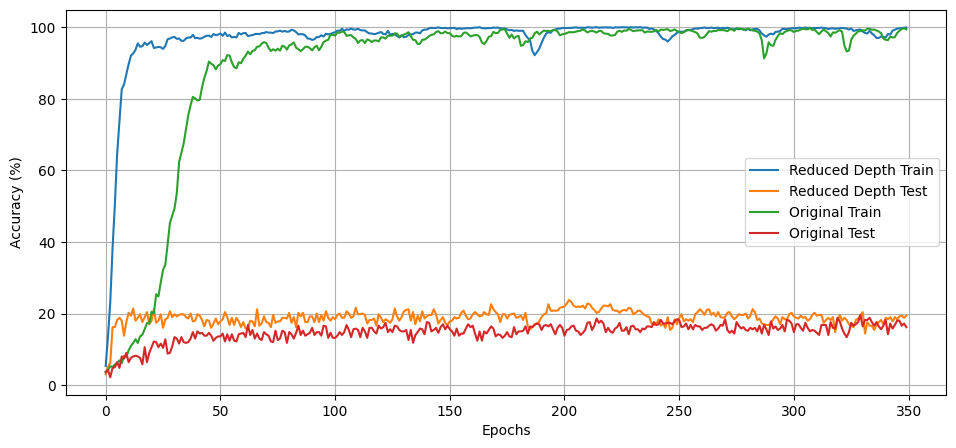

In [ ]:
accuracy_list = [(reduced_depth_accuracies_train_birds, 'Reduced Depth Train'),
                 (reduced_depth_accuracies_test_birds, 'Reduced Depth Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Convulational Block

In [ ]:
half_layers_accuracies_train_birds, half_layers_accuracies_test_birds, half_layers_time_birds = trainEfficientNet(reduced_conv_model, birds_train_loader, birds_test_loader)

Epoch: 1, Train Accuracy: 4.75%
Epoch: 1, Test Accuracy: 5.40%
Epoch: 2, Train Accuracy: 6.01%
Epoch: 2, Test Accuracy: 4.20%
Epoch: 3, Train Accuracy: 6.36%
Epoch: 3, Test Accuracy: 4.00%
Epoch: 4, Train Accuracy: 10.16%
Epoch: 4, Test Accuracy: 4.40%
Epoch: 5, Train Accuracy: 13.56%
Epoch: 5, Test Accuracy: 11.00%
Epoch: 6, Train Accuracy: 16.12%
Epoch: 6, Test Accuracy: 10.20%
Epoch: 7, Train Accuracy: 19.17%
Epoch: 7, Test Accuracy: 13.00%
Epoch: 8, Train Accuracy: 21.82%
Epoch: 8, Test Accuracy: 9.80%
Epoch: 9, Train Accuracy: 28.58%
Epoch: 9, Test Accuracy: 12.60%
Epoch: 10, Train Accuracy: 35.39%
Epoch: 10, Test Accuracy: 11.40%
Epoch: 11, Train Accuracy: 42.49%
Epoch: 11, Test Accuracy: 14.60%
Epoch: 12, Train Accuracy: 47.75%
Epoch: 12, Test Accuracy: 15.20%
Epoch: 13, Train Accuracy: 55.26%
Epoch: 13, Test Accuracy: 15.40%
Epoch: 14, Train Accuracy: 62.81%
Epoch: 14, Test Accuracy: 11.80%
Epoch: 15, Train Accuracy: 69.72%
Epoch: 15, Test Accuracy: 13.60%
Epoch: 16, Train Accu

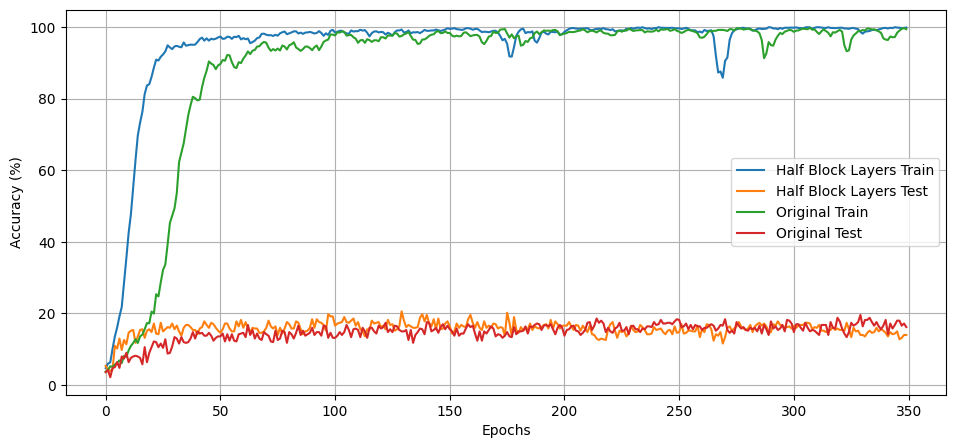

In [ ]:
accuracy_list = [(half_layers_accuracies_train_birds, 'Half Block Layers Train'),
                 (half_layers_accuracies_test_birds, 'Half Block Layers Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Dropout Rate

In [ ]:
dropout_accuracies_train_birds, dropout_accuracies_test_birds, dropout_time_birds = trainEfficientNet(inc_dropout_model, birds_train_loader, birds_test_loader)

Epoch: 1, Train Accuracy: 3.90%
Epoch: 1, Test Accuracy: 4.20%
Epoch: 2, Train Accuracy: 3.95%
Epoch: 2, Test Accuracy: 3.60%
Epoch: 3, Train Accuracy: 4.55%
Epoch: 3, Test Accuracy: 3.80%
Epoch: 4, Train Accuracy: 4.95%
Epoch: 4, Test Accuracy: 4.20%
Epoch: 5, Train Accuracy: 4.80%
Epoch: 5, Test Accuracy: 6.20%
Epoch: 6, Train Accuracy: 4.65%
Epoch: 6, Test Accuracy: 5.20%
Epoch: 7, Train Accuracy: 5.41%
Epoch: 7, Test Accuracy: 4.60%
Epoch: 8, Train Accuracy: 4.90%
Epoch: 8, Test Accuracy: 4.80%
Epoch: 9, Train Accuracy: 6.01%
Epoch: 9, Test Accuracy: 5.00%
Epoch: 10, Train Accuracy: 6.66%
Epoch: 10, Test Accuracy: 4.40%
Epoch: 11, Train Accuracy: 7.01%
Epoch: 11, Test Accuracy: 7.20%
Epoch: 12, Train Accuracy: 6.86%
Epoch: 12, Test Accuracy: 3.60%
Epoch: 13, Train Accuracy: 7.11%
Epoch: 13, Test Accuracy: 5.00%
Epoch: 14, Train Accuracy: 7.61%
Epoch: 14, Test Accuracy: 5.20%
Epoch: 15, Train Accuracy: 7.66%
Epoch: 15, Test Accuracy: 6.60%
Epoch: 16, Train Accuracy: 9.61%
Epoch: 16,

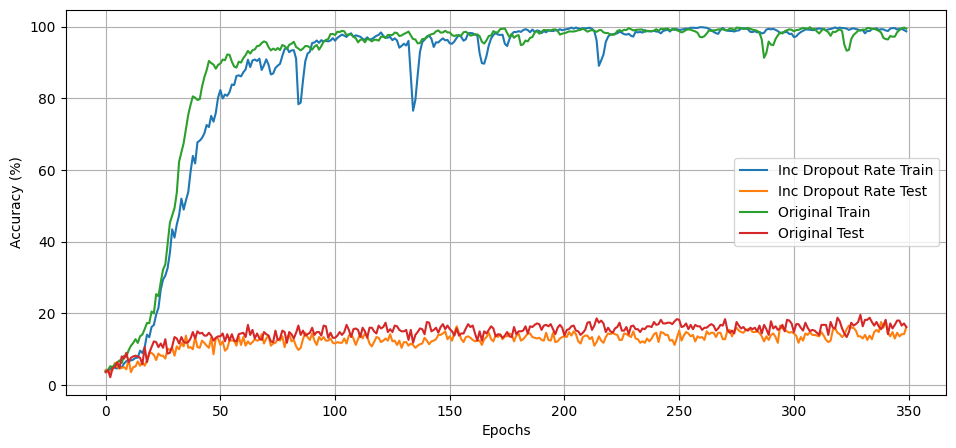

In [ ]:
accuracy_list = [(dropout_accuracies_train_birds, 'Inc Dropout Rate Train'),
                 (dropout_accuracies_test_birds, 'Inc Dropout Rate Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Stochastic Depth

In [ ]:
stochastic_depth_accuracies_train_birds, stochastic_depth_accuracies_test_birds, stochastic_depth_time_birds = trainEfficientNet(inc_stoch_depth_model, birds_train_loader, birds_test_loader)

Epoch: 1, Train Accuracy: 3.25%
Epoch: 1, Test Accuracy: 3.00%
Epoch: 2, Train Accuracy: 4.55%
Epoch: 2, Test Accuracy: 4.20%
Epoch: 3, Train Accuracy: 4.80%
Epoch: 3, Test Accuracy: 3.60%
Epoch: 4, Train Accuracy: 4.60%
Epoch: 4, Test Accuracy: 4.40%
Epoch: 5, Train Accuracy: 3.70%
Epoch: 5, Test Accuracy: 4.40%
Epoch: 6, Train Accuracy: 5.16%
Epoch: 6, Test Accuracy: 4.20%
Epoch: 7, Train Accuracy: 5.96%
Epoch: 7, Test Accuracy: 5.60%
Epoch: 8, Train Accuracy: 5.31%
Epoch: 8, Test Accuracy: 5.20%
Epoch: 9, Train Accuracy: 5.61%
Epoch: 9, Test Accuracy: 5.60%
Epoch: 10, Train Accuracy: 5.66%
Epoch: 10, Test Accuracy: 4.20%
Epoch: 11, Train Accuracy: 7.31%
Epoch: 11, Test Accuracy: 7.20%
Epoch: 12, Train Accuracy: 7.26%
Epoch: 12, Test Accuracy: 6.80%
Epoch: 13, Train Accuracy: 8.01%
Epoch: 13, Test Accuracy: 6.40%
Epoch: 14, Train Accuracy: 7.21%
Epoch: 14, Test Accuracy: 6.80%
Epoch: 15, Train Accuracy: 6.71%
Epoch: 15, Test Accuracy: 6.00%
Epoch: 16, Train Accuracy: 7.46%
Epoch: 16,

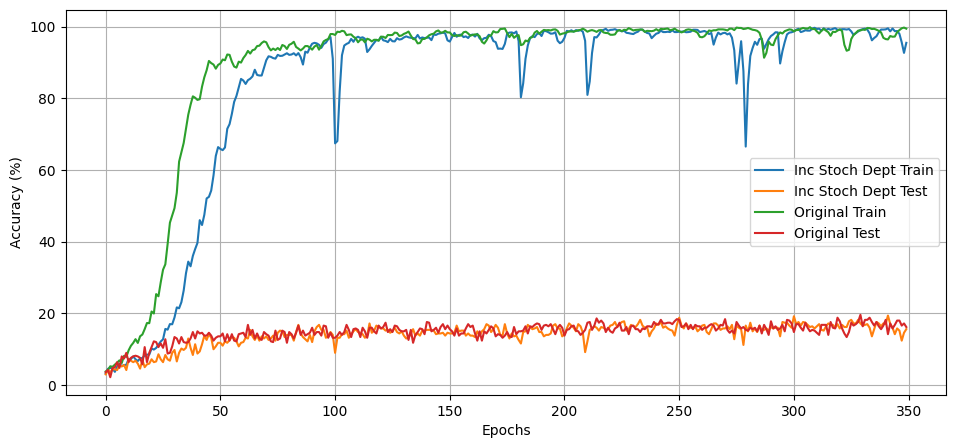

In [ ]:
accuracy_list = [(stochastic_depth_accuracies_train_birds, 'Inc Stoch Dept Train'),
                 (stochastic_depth_accuracies_test_birds, 'Inc Stoch Dept Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Summary

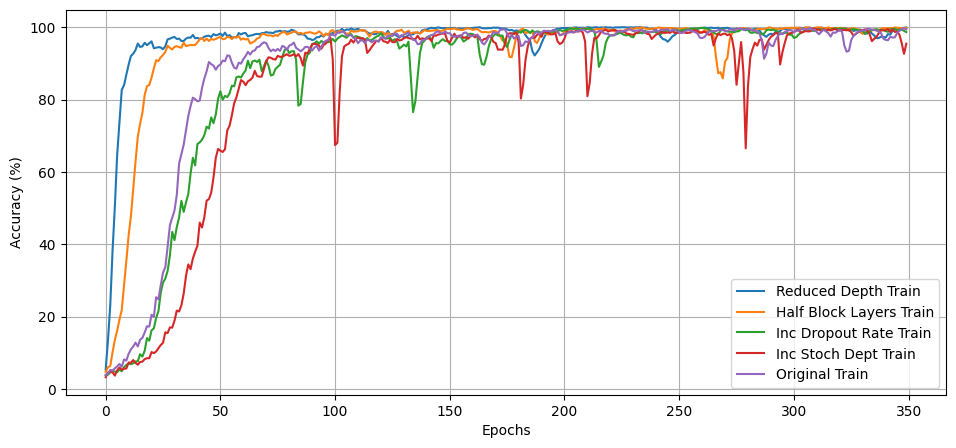

In [ ]:
# Training Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_train_birds, 'Reduced Depth Train'),
    (half_layers_accuracies_train_birds, 'Half Block Layers Train'),
    (dropout_accuracies_train_birds, 'Inc Dropout Rate Train'),
    (stochastic_depth_accuracies_train_birds, 'Inc Stoch Dept Train'),
                 (original_accuracies_train_birds, 'Original Train')]

plot_accuracies(accuracy_list)

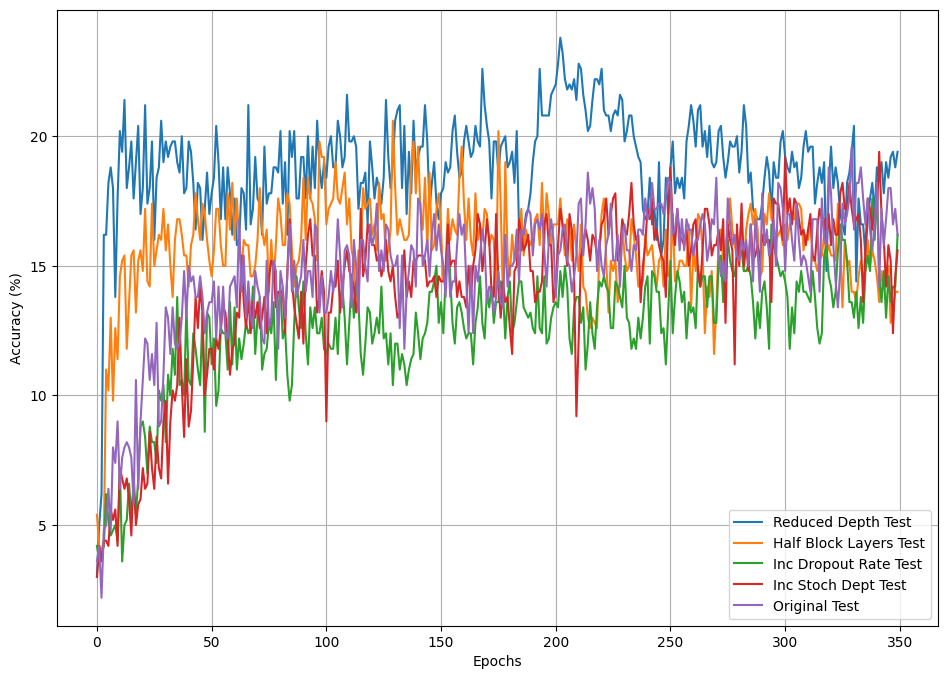

In [ ]:
# Testing Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_test_birds, 'Reduced Depth Test'),
    (half_layers_accuracies_test_birds, 'Half Block Layers Test'),
    (dropout_accuracies_test_birds, 'Inc Dropout Rate Test'),
    (stochastic_depth_accuracies_test_birds, 'Inc Stoch Dept Test'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list, figsize=(25, 8))

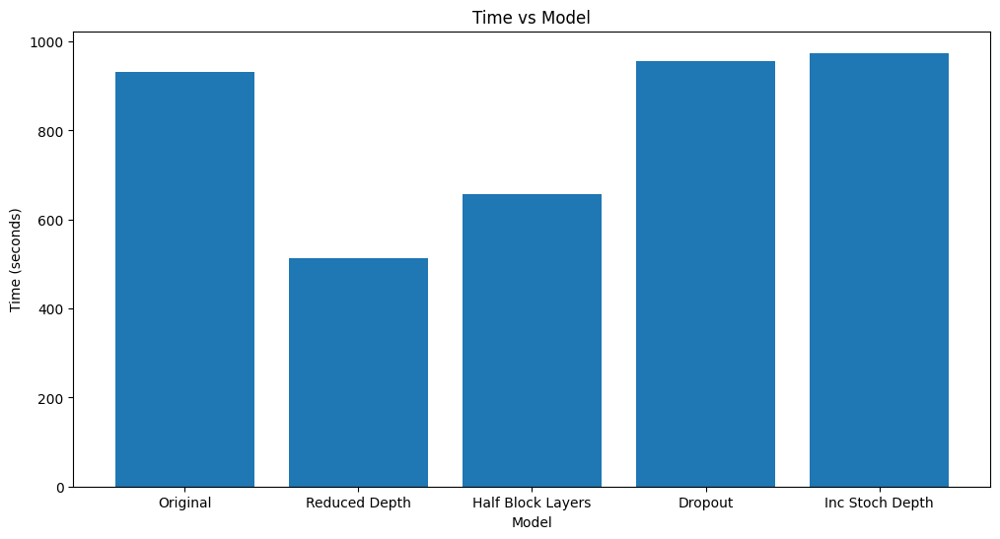

In [ ]:
# Model speed comparison

time_label_list = [(original_time_birds, 'Original'), (reduced_depth_time_birds, 'Reduced Depth'), (half_layers_time_birds, 'Half Block Layers'), (dropout_time_birds, "Dropout"), (stochastic_depth_time_birds, "Inc Stoch Depth")]
plot_bar_chart(time_label_list)


### Memory Cleanup

In [ ]:
del accuracy_list
del reduced_depth_accuracies_test_birds
del reduced_depth_accuracies_train_birds
del half_layers_accuracies_test_birds
del half_layers_accuracies_train_birds
del dropout_accuracies_test_birds
del dropout_accuracies_train_birds
del stochastic_depth_accuracies_test_birds
del stochastic_depth_accuracies_train_birds
del original_accuracies_test_birds
del original_accuracies_train_birds

del train_dataset
del test_dataset

## ImageNet 32 x 32 images

### Data Processing ImageNet

In [ ]:
import tensorflow as tf

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torchvision.transforms import ToTensor
import time
import matplotlib.pyplot as plt

import os
import numpy as np
from PIL import Image

In [ ]:
def read_classes():
    """
    Load the ImageNet class names.
    """
    with open("/content/gdrive/MyDrive/LOC_synset_mapping.txt", "r") as f:
        categories = [c.split() for c in [s.strip() for s in f.readlines()]]
    return categories

In [ ]:
mapping = {}

for c in read_classes(): 
  mapping[c[0]] = c[1:]

print(mapping)

{'n01440764': ['tench,', 'Tinca', 'tinca'], 'n01443537': ['goldfish,', 'Carassius', 'auratus'], 'n01484850': ['great', 'white', 'shark,', 'white', 'shark,', 'man-eater,', 'man-eating', 'shark,', 'Carcharodon', 'carcharias'], 'n01491361': ['tiger', 'shark,', 'Galeocerdo', 'cuvieri'], 'n01494475': ['hammerhead,', 'hammerhead', 'shark'], 'n01496331': ['electric', 'ray,', 'crampfish,', 'numbfish,', 'torpedo'], 'n01498041': ['stingray'], 'n01514668': ['cock'], 'n01514859': ['hen'], 'n01518878': ['ostrich,', 'Struthio', 'camelus'], 'n01530575': ['brambling,', 'Fringilla', 'montifringilla'], 'n01531178': ['goldfinch,', 'Carduelis', 'carduelis'], 'n01532829': ['house', 'finch,', 'linnet,', 'Carpodacus', 'mexicanus'], 'n01534433': ['junco,', 'snowbird'], 'n01537544': ['indigo', 'bunting,', 'indigo', 'finch,', 'indigo', 'bird,', 'Passerina', 'cyanea'], 'n01558993': ['robin,', 'American', 'robin,', 'Turdus', 'migratorius'], 'n01560419': ['bulbul'], 'n01580077': ['jay'], 'n01582220': ['magpie'], '

In [ ]:
# Set the computation device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model.
# model = test_efficientnet_v2_s_model()

# Initialize the image preprocess.
# preprocess = transforms.Compose([
#         transforms.Resize((128, 128)),  # Resize the images to size x size
#         transforms.ToTensor()            # Convert the images to PyTorch tensors
#     ]) if train else models.EfficientNet_V2_S_Weights.DEFAULT.transforms()

# TODO: scan images and preprocess
data_list = []
label_list = []

for subdir, dirs, files in os.walk("./gdrive/MyDrive/imagenette2-160/train/"):
    for i, file in enumerate(files):
        # Check if the file has a valid image extension
        file_extension = os.path.splitext(file)[-1].lower()
        if file_extension not in ['.jpg', '.jpeg', '.png']:
            continue

        # Open the image using Pillow library
        if i < 100:
          img_path = os.path.join(subdir, file)
          img = Image.open(img_path)
          if img.mode == 'RGB':
            # Convert the image to a numpy array and add it to the data list
            # img_array = np.asarray(preprocess(img))
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            # Add the label to the label list
            label_list.append(label)

# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

print(np.shape(data_array))
print(np.shape(label_array))

(979,)
(979,)


<ipython-input-34-1f895ce8b8fd>:40: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
# Split data into train and test set.
X_train, X_test, y_train, y_test = split_data(data_array, label_array)

# Load the ImageNet class names.
classes = list(mapping.keys())
# Count number of classes
num_classes = len(classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataset = transform_dataset(X_train, y_train)
test_dataset = transform_dataset(X_test, y_test)

imageNet_train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
imageNet_test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

# Cleanup
del X_train
del X_test
del y_train
del y_test
del data_list
del label_list
del data_array
del label_array

### Original Loop

In [ ]:
original_accuracies_train_imageNet, original_accuracies_test_imageNet, original_time_imageNet = trainEfficientNet(original_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 3.83%
Epoch: 1, Test Accuracy: 6.63%
Epoch: 2, Train Accuracy: 15.20%
Epoch: 2, Test Accuracy: 13.78%
Epoch: 3, Train Accuracy: 25.16%
Epoch: 3, Test Accuracy: 15.31%
Epoch: 4, Train Accuracy: 30.14%
Epoch: 4, Test Accuracy: 18.37%
Epoch: 5, Train Accuracy: 31.42%
Epoch: 5, Test Accuracy: 15.82%
Epoch: 6, Train Accuracy: 32.57%
Epoch: 6, Test Accuracy: 18.88%
Epoch: 7, Train Accuracy: 33.46%
Epoch: 7, Test Accuracy: 20.41%
Epoch: 8, Train Accuracy: 33.21%
Epoch: 8, Test Accuracy: 17.35%
Epoch: 9, Train Accuracy: 34.99%
Epoch: 9, Test Accuracy: 17.86%
Epoch: 10, Train Accuracy: 33.97%
Epoch: 10, Test Accuracy: 17.86%
Epoch: 11, Train Accuracy: 36.02%
Epoch: 11, Test Accuracy: 21.94%
Epoch: 12, Train Accuracy: 39.59%
Epoch: 12, Test Accuracy: 22.96%
Epoch: 13, Train Accuracy: 40.36%
Epoch: 13, Test Accuracy: 22.45%
Epoch: 14, Train Accuracy: 43.81%
Epoch: 14, Test Accuracy: 22.45%
Epoch: 15, Train Accuracy: 46.49%
Epoch: 15, Test Accuracy: 19.90%
Epoch: 16, Trai

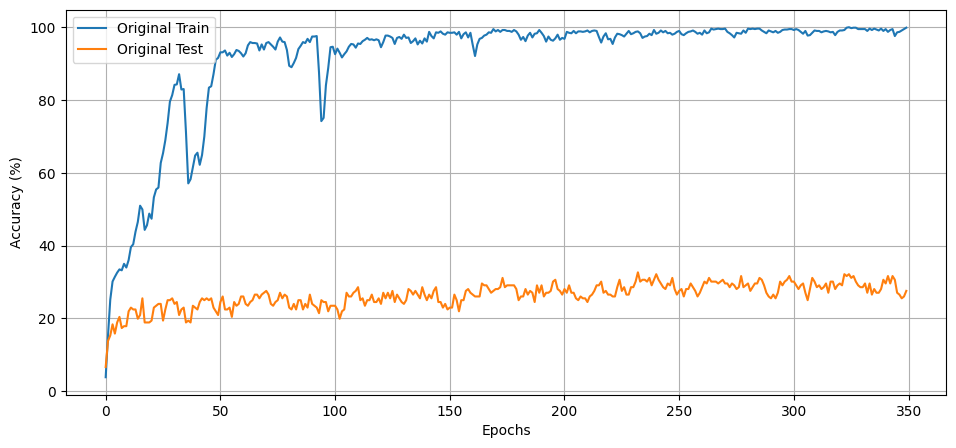

In [ ]:
accuracy_list = [(original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Depth

In [ ]:
reduced_depth_accuracies_train_imageNet, reduced_depth_accuracies_test_imageNet, reduced_depth_time_imageNet = trainEfficientNet(reduced_depth_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 4.47%
Epoch: 1, Test Accuracy: 4.08%
Epoch: 2, Train Accuracy: 23.37%
Epoch: 2, Test Accuracy: 9.18%
Epoch: 3, Train Accuracy: 44.44%
Epoch: 3, Test Accuracy: 14.29%
Epoch: 4, Train Accuracy: 58.75%
Epoch: 4, Test Accuracy: 17.35%
Epoch: 5, Train Accuracy: 72.03%
Epoch: 5, Test Accuracy: 20.41%
Epoch: 6, Train Accuracy: 84.29%
Epoch: 6, Test Accuracy: 20.41%
Epoch: 7, Train Accuracy: 87.61%
Epoch: 7, Test Accuracy: 23.98%
Epoch: 8, Train Accuracy: 93.10%
Epoch: 8, Test Accuracy: 21.94%
Epoch: 9, Train Accuracy: 95.15%
Epoch: 9, Test Accuracy: 22.45%
Epoch: 10, Train Accuracy: 96.04%
Epoch: 10, Test Accuracy: 23.47%
Epoch: 11, Train Accuracy: 96.68%
Epoch: 11, Test Accuracy: 25.51%
Epoch: 12, Train Accuracy: 97.70%
Epoch: 12, Test Accuracy: 26.53%
Epoch: 13, Train Accuracy: 98.47%
Epoch: 13, Test Accuracy: 25.51%
Epoch: 14, Train Accuracy: 98.34%
Epoch: 14, Test Accuracy: 25.51%
Epoch: 15, Train Accuracy: 97.06%
Epoch: 15, Test Accuracy: 26.53%
Epoch: 16, Train

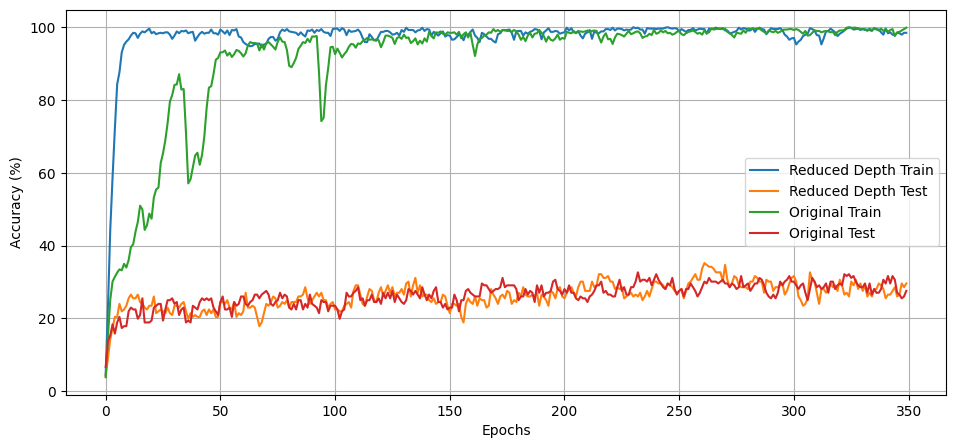

In [ ]:
accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
                 (reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Convulational Block

In [ ]:
half_layers_accuracies_train_imageNet, half_layers_accuracies_test_imageNet, half_layers_time_imageNet = trainEfficientNet(reduced_conv_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 4.85%
Epoch: 1, Test Accuracy: 8.16%
Epoch: 2, Train Accuracy: 21.84%
Epoch: 2, Test Accuracy: 16.33%
Epoch: 3, Train Accuracy: 38.70%
Epoch: 3, Test Accuracy: 18.88%
Epoch: 4, Train Accuracy: 52.62%
Epoch: 4, Test Accuracy: 20.92%
Epoch: 5, Train Accuracy: 58.37%
Epoch: 5, Test Accuracy: 20.41%
Epoch: 6, Train Accuracy: 64.37%
Epoch: 6, Test Accuracy: 21.94%
Epoch: 7, Train Accuracy: 68.84%
Epoch: 7, Test Accuracy: 22.45%
Epoch: 8, Train Accuracy: 74.58%
Epoch: 8, Test Accuracy: 25.51%
Epoch: 9, Train Accuracy: 77.14%
Epoch: 9, Test Accuracy: 25.51%
Epoch: 10, Train Accuracy: 83.65%
Epoch: 10, Test Accuracy: 23.47%
Epoch: 11, Train Accuracy: 86.46%
Epoch: 11, Test Accuracy: 23.98%
Epoch: 12, Train Accuracy: 90.04%
Epoch: 12, Test Accuracy: 25.00%
Epoch: 13, Train Accuracy: 91.70%
Epoch: 13, Test Accuracy: 22.96%
Epoch: 14, Train Accuracy: 91.44%
Epoch: 14, Test Accuracy: 25.51%
Epoch: 15, Train Accuracy: 86.59%
Epoch: 15, Test Accuracy: 27.04%
Epoch: 16, Trai

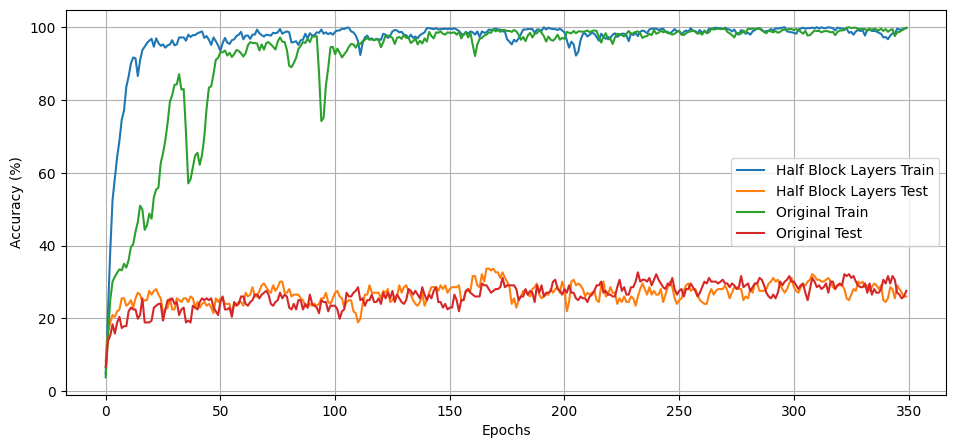

In [ ]:
accuracy_list = [(half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
                 (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Dropout Rate

In [ ]:
dropout_accuracies_train_imageNet, dropout_accuracies_test_imageNet, dropout_time_imageNet = trainEfficientNet(inc_dropout_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 5.87%
Epoch: 1, Test Accuracy: 8.67%
Epoch: 2, Train Accuracy: 21.84%
Epoch: 2, Test Accuracy: 14.80%
Epoch: 3, Train Accuracy: 26.31%
Epoch: 3, Test Accuracy: 14.29%
Epoch: 4, Train Accuracy: 25.67%
Epoch: 4, Test Accuracy: 11.22%
Epoch: 5, Train Accuracy: 29.12%
Epoch: 5, Test Accuracy: 11.73%
Epoch: 6, Train Accuracy: 29.50%
Epoch: 6, Test Accuracy: 13.27%
Epoch: 7, Train Accuracy: 29.63%
Epoch: 7, Test Accuracy: 18.88%
Epoch: 8, Train Accuracy: 30.65%
Epoch: 8, Test Accuracy: 14.80%
Epoch: 9, Train Accuracy: 35.89%
Epoch: 9, Test Accuracy: 11.73%
Epoch: 10, Train Accuracy: 37.29%
Epoch: 10, Test Accuracy: 13.78%
Epoch: 11, Train Accuracy: 40.87%
Epoch: 11, Test Accuracy: 19.39%
Epoch: 12, Train Accuracy: 45.59%
Epoch: 12, Test Accuracy: 19.39%
Epoch: 13, Train Accuracy: 50.06%
Epoch: 13, Test Accuracy: 20.92%
Epoch: 14, Train Accuracy: 54.41%
Epoch: 14, Test Accuracy: 19.90%
Epoch: 15, Train Accuracy: 58.11%
Epoch: 15, Test Accuracy: 21.94%
Epoch: 16, Trai

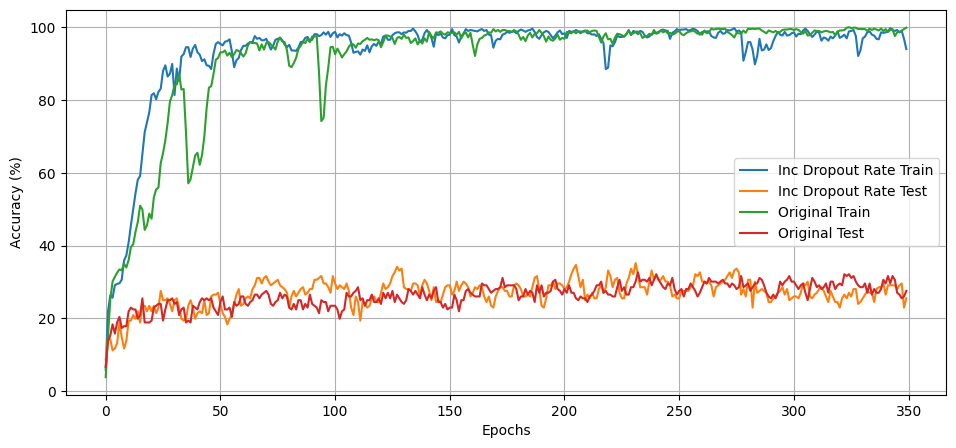

In [ ]:
accuracy_list = [(dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
                 (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Stochastic Depth

In [ ]:
stochastic_depth_accuracies_train_imageNet, stochastic_depth_accuracies_test_imageNet, stochastic_depth_time_imageNet = trainEfficientNet(inc_stoch_depth_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 4.85%
Epoch: 1, Test Accuracy: 5.61%
Epoch: 2, Train Accuracy: 21.20%
Epoch: 2, Test Accuracy: 13.78%
Epoch: 3, Train Accuracy: 28.48%
Epoch: 3, Test Accuracy: 18.88%
Epoch: 4, Train Accuracy: 29.63%
Epoch: 4, Test Accuracy: 15.31%
Epoch: 5, Train Accuracy: 28.86%
Epoch: 5, Test Accuracy: 18.37%
Epoch: 6, Train Accuracy: 41.63%
Epoch: 6, Test Accuracy: 19.90%
Epoch: 7, Train Accuracy: 43.55%
Epoch: 7, Test Accuracy: 19.90%
Epoch: 8, Train Accuracy: 44.06%
Epoch: 8, Test Accuracy: 16.84%
Epoch: 9, Train Accuracy: 49.55%
Epoch: 9, Test Accuracy: 20.41%
Epoch: 10, Train Accuracy: 54.66%
Epoch: 10, Test Accuracy: 21.43%
Epoch: 11, Train Accuracy: 58.24%
Epoch: 11, Test Accuracy: 16.84%
Epoch: 12, Train Accuracy: 53.90%
Epoch: 12, Test Accuracy: 14.29%
Epoch: 13, Train Accuracy: 55.94%
Epoch: 13, Test Accuracy: 16.33%
Epoch: 14, Train Accuracy: 60.66%
Epoch: 14, Test Accuracy: 18.88%
Epoch: 15, Train Accuracy: 65.39%
Epoch: 15, Test Accuracy: 20.41%
Epoch: 16, Trai

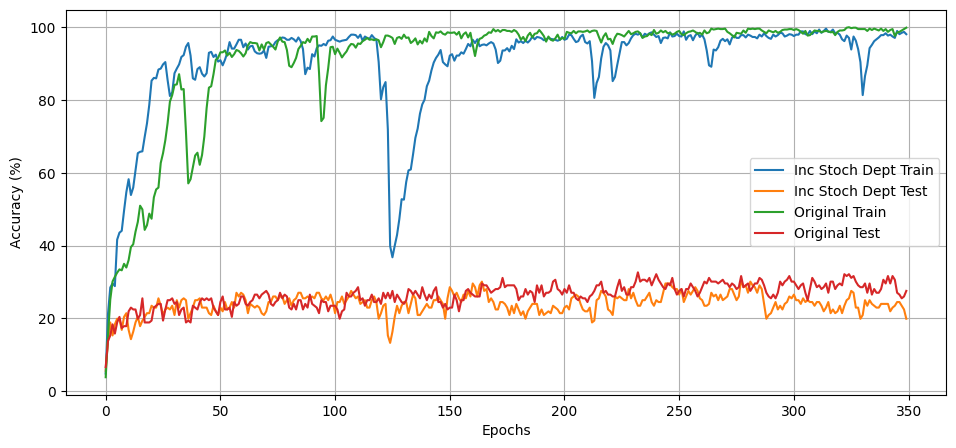

In [ ]:
accuracy_list = [(stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Summary

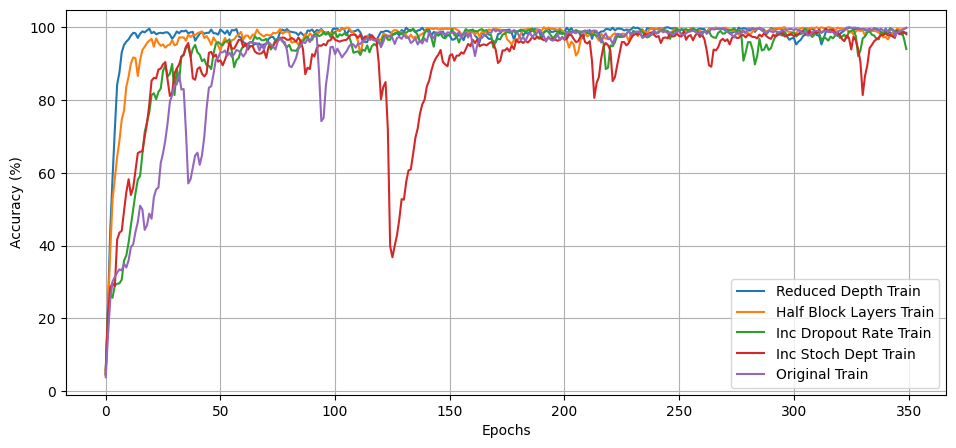

In [ ]:
# Training Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
    (half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
    (dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
    (stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (original_accuracies_train_imageNet, 'Original Train')]

plot_accuracies(accuracy_list)

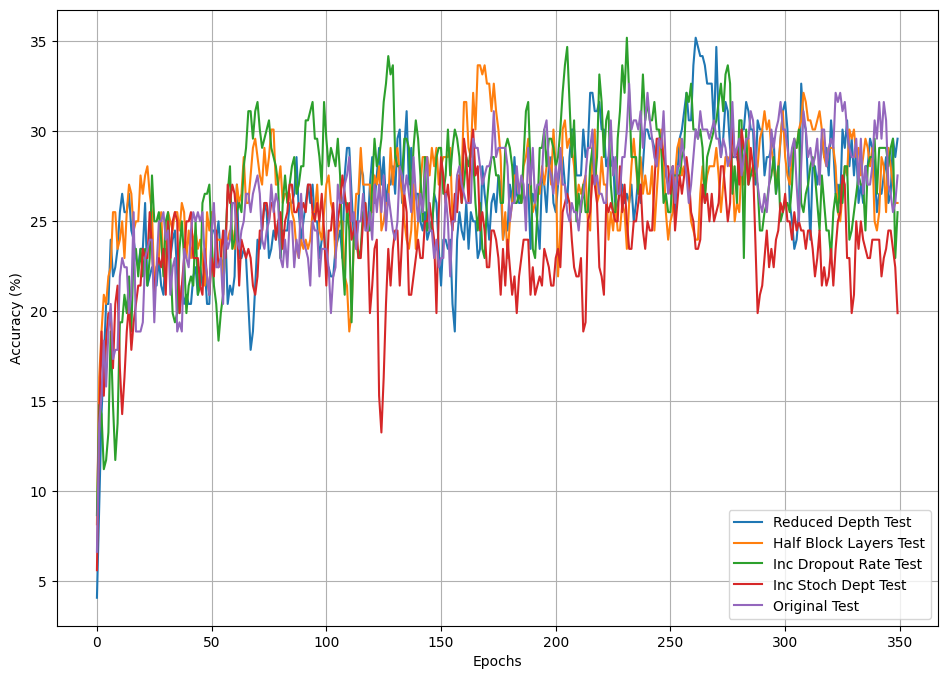

In [ ]:
# Testing Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
    (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
    (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
    (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list, figsize=(25, 8))

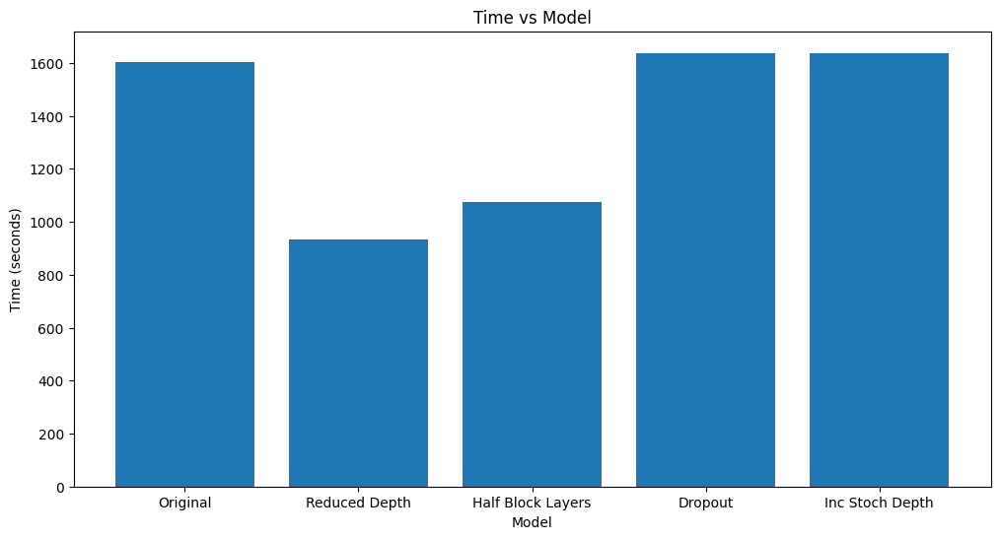

In [ ]:
# Model speed comparison

time_label_list = [(original_time_imageNet, 'Original'), (reduced_depth_time_imageNet, 'Reduced Depth'), (half_layers_time_imageNet, 'Half Block Layers'), (dropout_time_imageNet, "Dropout"), (stochastic_depth_time_imageNet, "Inc Stoch Depth")]
plot_bar_chart(time_label_list)

### Memory Cleanup

In [ ]:
del accuracy_list
del reduced_depth_accuracies_test_imageNet
del reduced_depth_accuracies_train_imageNet
del half_layers_accuracies_test_imageNet
del half_layers_accuracies_train_imageNet
del dropout_accuracies_test_imageNet
del dropout_accuracies_train_imageNet
del stochastic_depth_accuracies_test_imageNet
del stochastic_depth_accuracies_train_imageNet
del original_accuracies_test_imageNet
del original_accuracies_train_imageNet

del train_dataset
del test_dataset

## ImageNet 128 x 128 images

### Data Processing ImageNet

In [ ]:
import tensorflow as tf

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torchvision.transforms import ToTensor
import time
import matplotlib.pyplot as plt

import os
import numpy as np
from PIL import Image

In [ ]:
def read_classes():
    """
    Load the ImageNet class names.
    """
    with open("/content/gdrive/MyDrive/LOC_synset_mapping.txt", "r") as f:
        categories = [c.split() for c in [s.strip() for s in f.readlines()]]
    return categories

In [ ]:
mapping = {}

for c in read_classes(): 
  mapping[c[0]] = c[1:]

print(mapping)

{'n01440764': ['tench,', 'Tinca', 'tinca'], 'n01443537': ['goldfish,', 'Carassius', 'auratus'], 'n01484850': ['great', 'white', 'shark,', 'white', 'shark,', 'man-eater,', 'man-eating', 'shark,', 'Carcharodon', 'carcharias'], 'n01491361': ['tiger', 'shark,', 'Galeocerdo', 'cuvieri'], 'n01494475': ['hammerhead,', 'hammerhead', 'shark'], 'n01496331': ['electric', 'ray,', 'crampfish,', 'numbfish,', 'torpedo'], 'n01498041': ['stingray'], 'n01514668': ['cock'], 'n01514859': ['hen'], 'n01518878': ['ostrich,', 'Struthio', 'camelus'], 'n01530575': ['brambling,', 'Fringilla', 'montifringilla'], 'n01531178': ['goldfinch,', 'Carduelis', 'carduelis'], 'n01532829': ['house', 'finch,', 'linnet,', 'Carpodacus', 'mexicanus'], 'n01534433': ['junco,', 'snowbird'], 'n01537544': ['indigo', 'bunting,', 'indigo', 'finch,', 'indigo', 'bird,', 'Passerina', 'cyanea'], 'n01558993': ['robin,', 'American', 'robin,', 'Turdus', 'migratorius'], 'n01560419': ['bulbul'], 'n01580077': ['jay'], 'n01582220': ['magpie'], '

In [ ]:
# Set the computation device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model.
# model = test_efficientnet_v2_s_model()

# Initialize the image preprocess.
# preprocess = transforms.Compose([
#         transforms.Resize((128, 128)),  # Resize the images to size x size
#         transforms.ToTensor()            # Convert the images to PyTorch tensors
#     ]) if train else models.EfficientNet_V2_S_Weights.DEFAULT.transforms()

# TODO: scan images and preprocess
data_list = []
label_list = []

for subdir, dirs, files in os.walk("./gdrive/MyDrive/imagenette2-160/train/"):
    for i, file in enumerate(files):
        # Check if the file has a valid image extension
        file_extension = os.path.splitext(file)[-1].lower()
        if file_extension not in ['.jpg', '.jpeg', '.png']:
            continue

        # Open the image using Pillow library
        if i < 100:
          img_path = os.path.join(subdir, file)
          img = Image.open(img_path)
          if img.mode == 'RGB':
            # Convert the image to a numpy array and add it to the data list
            # img_array = np.asarray(preprocess(img))
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            # Add the label to the label list
            label_list.append(label)

# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

print(np.shape(data_array))
print(np.shape(label_array))

(979,)
(979,)


<ipython-input-53-1f895ce8b8fd>:40: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
# Split data into train and test set.
X_train, X_test, y_train, y_test = split_data(data_array, label_array)

# Load the ImageNet class names.
classes = list(mapping.keys())
# Count number of classes
num_classes = len(classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataset = transform_dataset(X_train, y_train, 128)
test_dataset = transform_dataset(X_test, y_test, 128)

imageNet_train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
imageNet_test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

# Cleanup
del X_train
del X_test
del y_train
del y_test
del data_list
del label_list
del data_array
del label_array

### Original Loop

In [ ]:
original_accuracies_train_imageNet, original_accuracies_test_imageNet, original_time_imageNet = trainEfficientNet(original_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 20.95%
Epoch: 1, Test Accuracy: 22.96%
Epoch: 2, Train Accuracy: 40.74%
Epoch: 2, Test Accuracy: 25.00%
Epoch: 3, Train Accuracy: 52.87%
Epoch: 3, Test Accuracy: 28.06%
Epoch: 4, Train Accuracy: 69.35%
Epoch: 4, Test Accuracy: 31.12%
Epoch: 5, Train Accuracy: 79.95%
Epoch: 5, Test Accuracy: 27.04%
Epoch: 6, Train Accuracy: 91.19%
Epoch: 6, Test Accuracy: 24.49%
Epoch: 7, Train Accuracy: 94.25%
Epoch: 7, Test Accuracy: 27.04%
Epoch: 8, Train Accuracy: 95.53%
Epoch: 8, Test Accuracy: 23.98%
Epoch: 9, Train Accuracy: 96.04%
Epoch: 9, Test Accuracy: 21.94%
Epoch: 10, Train Accuracy: 93.61%
Epoch: 10, Test Accuracy: 24.49%
Epoch: 11, Train Accuracy: 94.76%
Epoch: 11, Test Accuracy: 23.47%
Epoch: 12, Train Accuracy: 95.79%
Epoch: 12, Test Accuracy: 20.92%
Epoch: 13, Train Accuracy: 97.45%
Epoch: 13, Test Accuracy: 25.00%
Epoch: 14, Train Accuracy: 97.57%
Epoch: 14, Test Accuracy: 23.47%
Epoch: 15, Train Accuracy: 98.21%
Epoch: 15, Test Accuracy: 24.49%
Epoch: 16, Tr

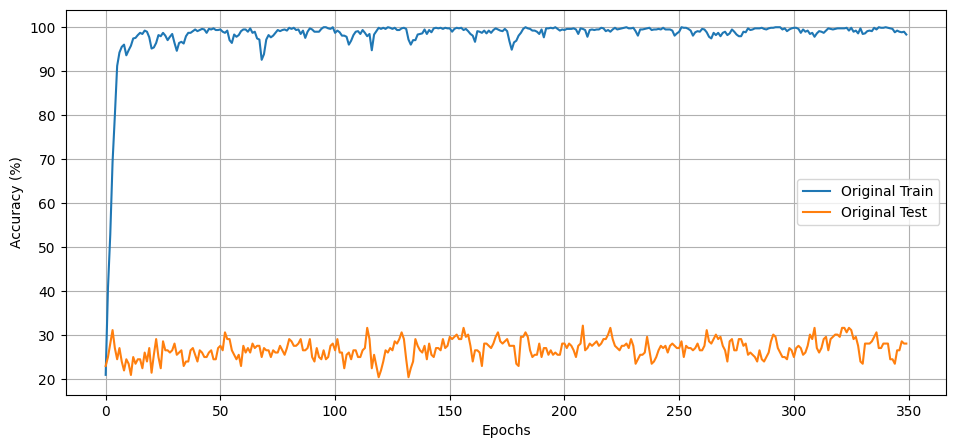

In [ ]:
accuracy_list = [(original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Depth

In [ ]:
reduced_depth_accuracies_train_imageNet, reduced_depth_accuracies_test_imageNet, reduced_depth_time_imageNet = trainEfficientNet(reduced_depth_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 24.52%
Epoch: 1, Test Accuracy: 28.06%
Epoch: 2, Train Accuracy: 56.19%
Epoch: 2, Test Accuracy: 29.59%
Epoch: 3, Train Accuracy: 74.07%
Epoch: 3, Test Accuracy: 29.59%
Epoch: 4, Train Accuracy: 85.57%
Epoch: 4, Test Accuracy: 30.10%
Epoch: 5, Train Accuracy: 91.95%
Epoch: 5, Test Accuracy: 31.63%
Epoch: 6, Train Accuracy: 95.27%
Epoch: 6, Test Accuracy: 31.12%
Epoch: 7, Train Accuracy: 98.21%
Epoch: 7, Test Accuracy: 33.16%
Epoch: 8, Train Accuracy: 99.36%
Epoch: 8, Test Accuracy: 35.20%
Epoch: 9, Train Accuracy: 99.36%
Epoch: 9, Test Accuracy: 34.18%
Epoch: 10, Train Accuracy: 99.23%
Epoch: 10, Test Accuracy: 32.65%
Epoch: 11, Train Accuracy: 100.00%
Epoch: 11, Test Accuracy: 34.18%
Epoch: 12, Train Accuracy: 99.74%
Epoch: 12, Test Accuracy: 35.71%
Epoch: 13, Train Accuracy: 99.74%
Epoch: 13, Test Accuracy: 35.20%
Epoch: 14, Train Accuracy: 99.62%
Epoch: 14, Test Accuracy: 37.76%
Epoch: 15, Train Accuracy: 99.74%
Epoch: 15, Test Accuracy: 36.22%
Epoch: 16, T

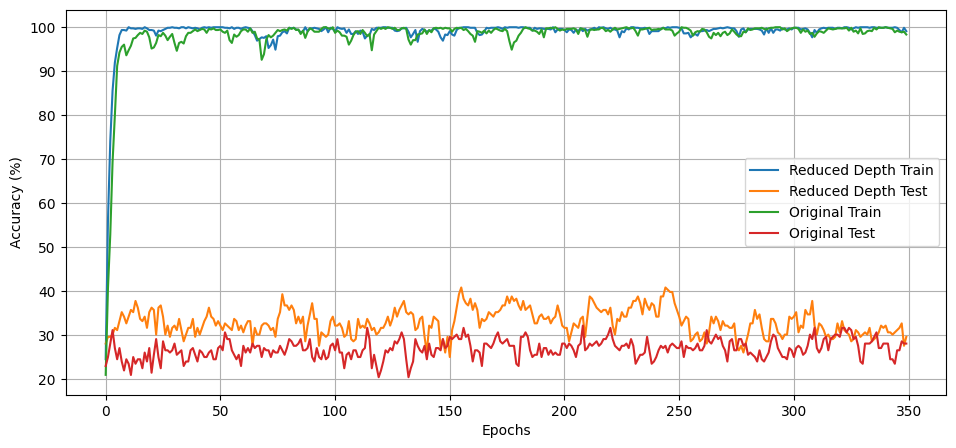

In [ ]:
accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
                 (reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Convulational Block

In [ ]:
half_layers_accuracies_train_imageNet, half_layers_accuracies_test_imageNet, half_layers_time_imageNet = trainEfficientNet(reduced_conv_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 23.12%
Epoch: 1, Test Accuracy: 23.47%
Epoch: 2, Train Accuracy: 49.81%
Epoch: 2, Test Accuracy: 23.47%
Epoch: 3, Train Accuracy: 63.09%
Epoch: 3, Test Accuracy: 24.49%
Epoch: 4, Train Accuracy: 76.12%
Epoch: 4, Test Accuracy: 26.53%
Epoch: 5, Train Accuracy: 84.93%
Epoch: 5, Test Accuracy: 27.55%
Epoch: 6, Train Accuracy: 92.21%
Epoch: 6, Test Accuracy: 26.53%
Epoch: 7, Train Accuracy: 94.64%
Epoch: 7, Test Accuracy: 26.02%
Epoch: 8, Train Accuracy: 97.19%
Epoch: 8, Test Accuracy: 26.02%
Epoch: 9, Train Accuracy: 98.72%
Epoch: 9, Test Accuracy: 27.04%
Epoch: 10, Train Accuracy: 98.47%
Epoch: 10, Test Accuracy: 29.08%
Epoch: 11, Train Accuracy: 99.74%
Epoch: 11, Test Accuracy: 29.59%
Epoch: 12, Train Accuracy: 99.74%
Epoch: 12, Test Accuracy: 30.61%
Epoch: 13, Train Accuracy: 99.36%
Epoch: 13, Test Accuracy: 29.59%
Epoch: 14, Train Accuracy: 98.98%
Epoch: 14, Test Accuracy: 28.06%
Epoch: 15, Train Accuracy: 99.11%
Epoch: 15, Test Accuracy: 29.08%
Epoch: 16, Tr

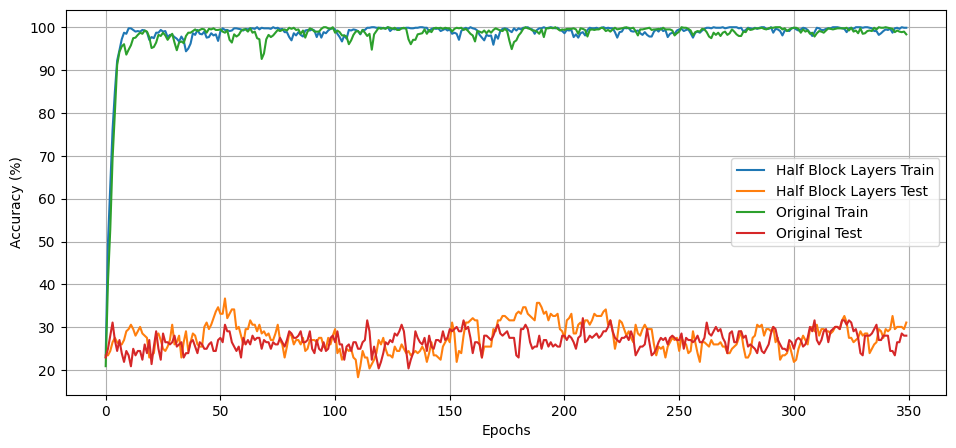

In [ ]:
accuracy_list = [(half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
                 (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Dropout Rate

In [ ]:
dropout_accuracies_train_imageNet, dropout_accuracies_test_imageNet, dropout_time_imageNet = trainEfficientNet(inc_dropout_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 18.52%
Epoch: 1, Test Accuracy: 17.35%
Epoch: 2, Train Accuracy: 33.46%
Epoch: 2, Test Accuracy: 23.47%
Epoch: 3, Train Accuracy: 40.74%
Epoch: 3, Test Accuracy: 23.47%
Epoch: 4, Train Accuracy: 51.09%
Epoch: 4, Test Accuracy: 26.53%
Epoch: 5, Train Accuracy: 63.47%
Epoch: 5, Test Accuracy: 32.65%
Epoch: 6, Train Accuracy: 76.25%
Epoch: 6, Test Accuracy: 34.18%
Epoch: 7, Train Accuracy: 84.04%
Epoch: 7, Test Accuracy: 31.12%
Epoch: 8, Train Accuracy: 91.06%
Epoch: 8, Test Accuracy: 31.63%
Epoch: 9, Train Accuracy: 95.27%
Epoch: 9, Test Accuracy: 32.14%
Epoch: 10, Train Accuracy: 96.17%
Epoch: 10, Test Accuracy: 30.61%
Epoch: 11, Train Accuracy: 96.55%
Epoch: 11, Test Accuracy: 28.06%
Epoch: 12, Train Accuracy: 97.70%
Epoch: 12, Test Accuracy: 27.04%
Epoch: 13, Train Accuracy: 95.79%
Epoch: 13, Test Accuracy: 25.00%
Epoch: 14, Train Accuracy: 95.27%
Epoch: 14, Test Accuracy: 25.51%
Epoch: 15, Train Accuracy: 92.85%
Epoch: 15, Test Accuracy: 25.00%
Epoch: 16, Tr

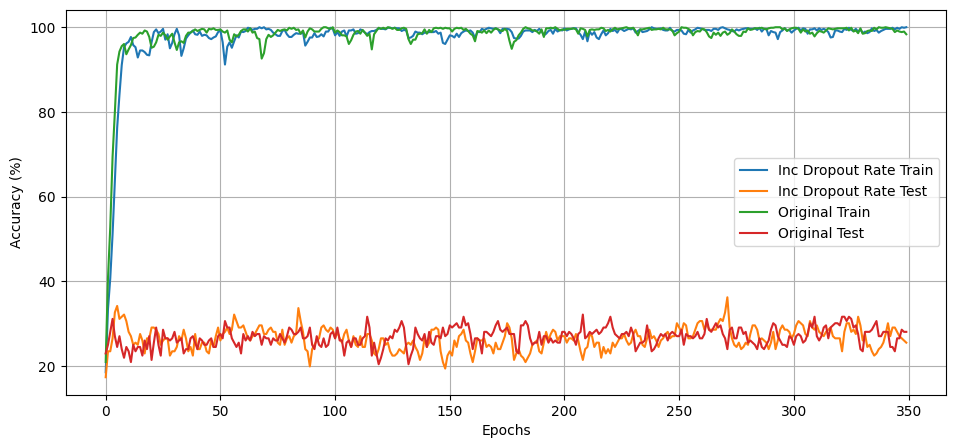

In [ ]:
accuracy_list = [(dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
                 (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Stochastic Depth

In [ ]:
stochastic_depth_accuracies_train_imageNet, stochastic_depth_accuracies_test_imageNet, stochastic_depth_time_imageNet = trainEfficientNet(inc_stoch_depth_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 19.80%
Epoch: 1, Test Accuracy: 23.98%
Epoch: 2, Train Accuracy: 36.27%
Epoch: 2, Test Accuracy: 26.53%
Epoch: 3, Train Accuracy: 49.04%
Epoch: 3, Test Accuracy: 30.10%
Epoch: 4, Train Accuracy: 55.43%
Epoch: 4, Test Accuracy: 33.67%
Epoch: 5, Train Accuracy: 64.62%
Epoch: 5, Test Accuracy: 32.65%
Epoch: 6, Train Accuracy: 73.31%
Epoch: 6, Test Accuracy: 26.53%
Epoch: 7, Train Accuracy: 82.12%
Epoch: 7, Test Accuracy: 25.00%
Epoch: 8, Train Accuracy: 86.33%
Epoch: 8, Test Accuracy: 27.04%
Epoch: 9, Train Accuracy: 91.06%
Epoch: 9, Test Accuracy: 28.06%
Epoch: 10, Train Accuracy: 93.49%
Epoch: 10, Test Accuracy: 25.51%
Epoch: 11, Train Accuracy: 94.00%
Epoch: 11, Test Accuracy: 26.02%
Epoch: 12, Train Accuracy: 95.53%
Epoch: 12, Test Accuracy: 28.57%
Epoch: 13, Train Accuracy: 94.25%
Epoch: 13, Test Accuracy: 29.59%
Epoch: 14, Train Accuracy: 96.55%
Epoch: 14, Test Accuracy: 25.51%
Epoch: 15, Train Accuracy: 95.40%
Epoch: 15, Test Accuracy: 26.02%
Epoch: 16, Tr

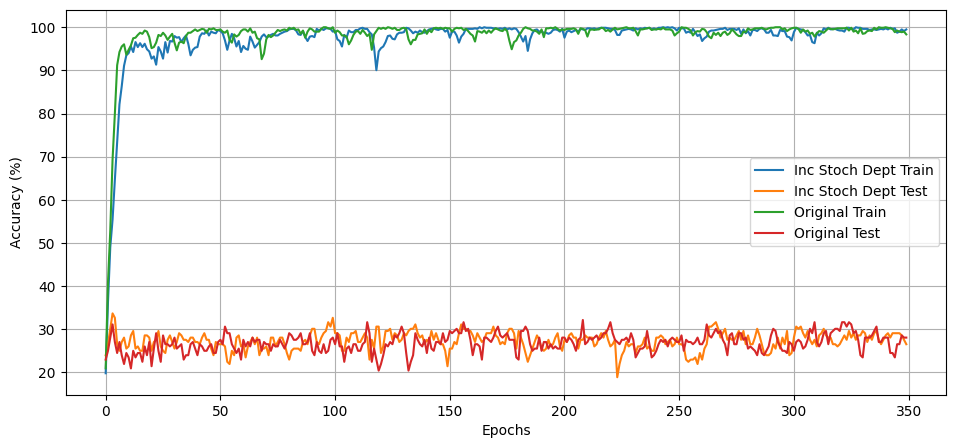

In [ ]:
accuracy_list = [(stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Summary

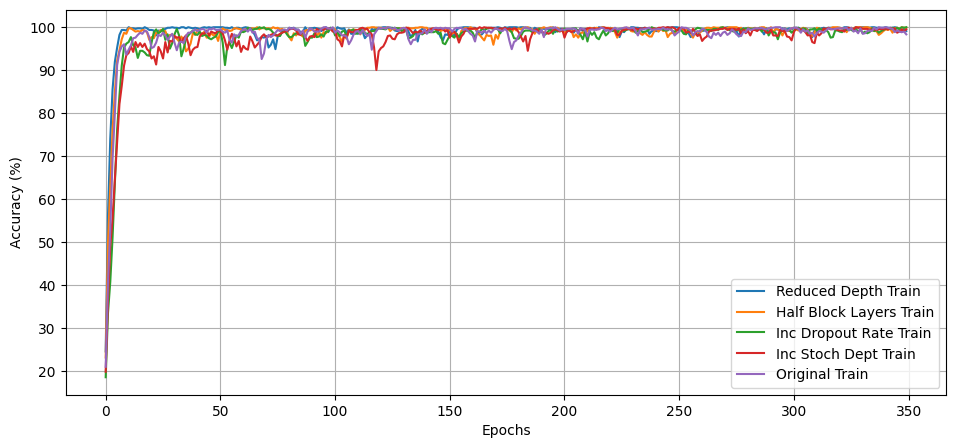

In [ ]:
# Training Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
    (half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
    (dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
    (stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (original_accuracies_train_imageNet, 'Original Train')]

plot_accuracies(accuracy_list)

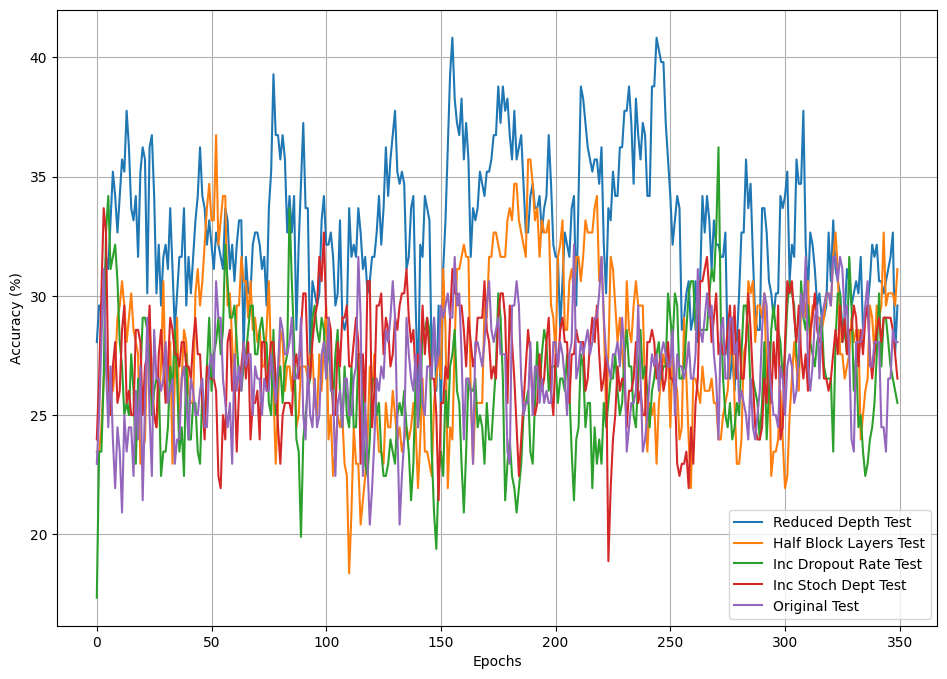

In [ ]:
# Testing Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
    (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
    (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
    (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list, figsize=(25, 8))

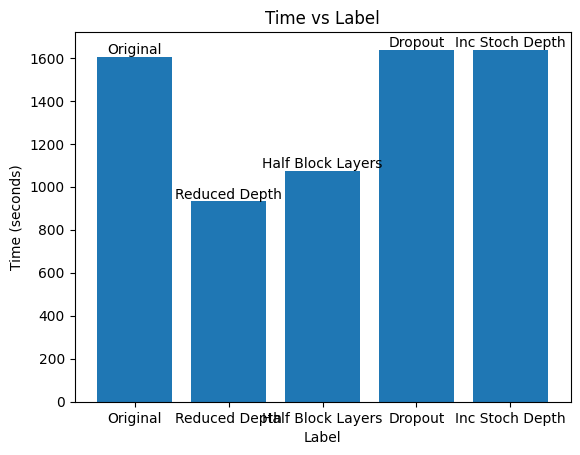

In [ ]:
# Model speed comparison

time_label_list = [(original_time_imageNet, 'Original'), (reduced_depth_time_imageNet, 'Reduced Depth'), (half_layers_time_imageNet, 'Half Block Layers'), (dropout_time_imageNet, "Dropout"), (stochastic_depth_time_imageNet, "Inc Stoch Depth")]
plot_bar_chart(time_label_list)

### Memory Cleanup

In [ ]:
del accuracy_list
del reduced_depth_accuracies_test_imageNet
del reduced_depth_accuracies_train_imageNet
del half_layers_accuracies_test_imageNet
del half_layers_accuracies_train_imageNet
del dropout_accuracies_test_imageNet
del dropout_accuracies_train_imageNet
del stochastic_depth_accuracies_test_imageNet
del stochastic_depth_accuracies_train_imageNet
del original_accuracies_test_imageNet
del original_accuracies_train_imageNet

del train_dataset
del test_dataset

# HyperParameter Check with scheduler

## Initialization

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

# Upload your Kaggle.json here
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Mounted at /content/gdrive/


Saving kaggle.json to kaggle (2).json
mkdir: cannot create directory ‘/root/.kaggle’: File exists


## Helper Functions

In [ ]:
import torch
import time
import torch.optim as optim
import torch.nn as nn

# Trains and returns accuracies of the model
def trainEfficientNet(model, train_loader, test_loader):
    start_time = time.time()

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    learning_rate = 0.0001
    # model
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=10)

    epochs = 350
    patience = 50  # Add patience parameter for early stopping
    epochs_without_improvement = 0  # Initialize counter for epochs without improvement
    best_accuracy = 0  # Initialize variable to store the best test accuracy

    accuracies_train = []
    accuracies_test = []
    loss_train = []
    loss_test = []

    for epoch in range(epochs):
        # Training
        model.train()
        correct_train = 0
        total_train = 0
        for i, (inputs, labels) in enumerate(train_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            # Loss
            loss = criterion(outputs, labels)
            loss_train.append(loss.item())
            optimizer.zero_grad()
            # Computes gradient
            loss.backward()
            optimizer.step()
            # Accuracy
            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        # Testing
        model.eval()
        correct_test = 0
        total_test = 0
        with torch.no_grad():
            for j, (inputs, labels) in enumerate(test_loader):
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                loss_test.append(loss.item())
                _, predicted = torch.max(outputs.data, 1)
                total_test += labels.size(0)
                correct_test += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        test_accuracy = 100 * correct_test / total_test
        print('Epoch: {}, Train Accuracy: {:.2f}%'.format(epoch+1, train_accuracy))
        print('Epoch: {}, Test Accuracy: {:.2f}%'.format(epoch+1, test_accuracy))
        accuracies_train.append(train_accuracy)
        accuracies_test.append(test_accuracy)
        scheduler.step(test_accuracy)

        if epoch > 150:
          # Early stopping logic
          if test_accuracy > best_accuracy:
            best_accuracy = test_accuracy
            epochs_without_improvement = 0
          else:
            epochs_without_improvement += 1

          if epochs_without_improvement >= patience:
            print(f"Early stopping after {patience} epochs without improvement.")
            break

    end_time = time.time()
    elapsed_time = end_time - start_time

    return accuracies_train, accuracies_test, elapsed_time


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split

def split_data(data, labels, test_size=0.2, random_state=42):
    """
    Splits the input data and labels arrays into a training and test set.

    Args:
    - data (numpy array): the input data array
    - labels (numpy array): the corresponding label array
    - test_size (float, optional): the proportion of the dataset to include in the test split (default=0.2)
    - random_state (int, optional): the seed used by the random number generator (default=42)

    Returns:
    - X_train (numpy array): the training data
    - X_test (numpy array): the test data
    - y_train (numpy array): the training labels
    - y_test (numpy array): the test labels
    """

    # Split the data and labels into a training and test set
    X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=test_size, random_state=random_state)

    return X_train, X_test, y_train, y_test

In [ ]:
import matplotlib.pyplot as plt

def plot_accuracies(accuracy_list, figsize=(25, 5)):
    fig = plt.figure(figsize=figsize) # set the figure width to 25 inches and height to 5 inches
    plt.subplot(1,2,1)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    for acc, label in accuracy_list:
        plt.plot(acc, label=label)
    plt.grid()
    plt.legend()
    plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_bar_chart(time_label_list):
    # Unzip the tuples into two lists: time and label
    time, label = zip(*time_label_list)

    # Set up the bar chart with a wider figure size
    fig, ax = plt.subplots(figsize=(12, 6))  # Adjust the width (12) and height (6) as needed
    bars = ax.bar(label, time)

    # Set chart title and labels
    ax.set_title('Time vs Model')
    ax.set_xlabel('Model')
    ax.set_ylabel('Time (seconds)')


    # Display the chart
    plt.show()


In [ ]:
import torch
from torch.utils.data import TensorDataset
import numpy as np
from PIL import Image
import torchvision.models as models
from torchvision.transforms import transforms

def transform_dataset(X, y, size=32):
    """
    Transforms a list of numpy arrays containing images of different sizes into a PyTorch TensorDataset object.

    Args:
        X (list of numpy arrays): List of input images.
        y (list or numpy array): List or numpy array of corresponding labels.
        size (int): Size of the output images. Default is 32.

    Returns:
        TensorDataset: PyTorch TensorDataset object containing the transformed images and labels.
    """
    # Define a transformation pipeline to resize the images to a fixed size and convert them to tensors
    transform = transforms.Compose([
        transforms.Resize((size, size)),  # Resize the images to size x size
        transforms.ToTensor()            # Convert the images to PyTorch tensors
    ])
    # transform = models.EfficientNet_v2_s_Weights.DEFAULT.transform()

    # Define empty arrays to store the transformed images and labels
    X_transformed = []
    y_transformed = []

    # Loop over each image in X and apply the transformation pipeline
    for i in range(len(X)):
        # Convert the numpy array to a PIL image
        img = Image.fromarray(np.uint8(X[i]))
        # Apply the transformation pipeline to the image
        img_transformed = transform(img)

        # Append the transformed image and its corresponding label to the output arrays
        X_transformed.append(img_transformed)

    # Convert the labels to a NumPy array of integers
    classes = np.unique(y)
    y_transformed = np.searchsorted(classes, y)
    print("y_transformed")
    print(np.shape(y_transformed))

    X_transformed_new = []
    y_transformed_new = []
    for i in range(len(X_transformed)):
      if(X_transformed[i].shape[0] == 3):
        X_transformed_new.append(X_transformed[i])
        y_transformed_new.append(y_transformed[i])
      else:
        print("Deleted: ", i)

    print("X_transformed_new ", np.shape(X_transformed_new))
    print("y_transformed_new ", np.shape(y_transformed_new))

    # Convert the output arrays to PyTorch tensors
    X_transformed = torch.stack(X_transformed_new)
    y_transformed = torch.tensor(y_transformed_new)

    print("X_transformed final ", np.shape(X_transformed))
    print("y_transformed final ", np.shape(y_transformed))

    # Create a PyTorch TensorDataset object
    dataset = TensorDataset(X_transformed, y_transformed)

    return dataset

## Models

In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
## Original Model
import torchvision
from torch import nn
from torchvision.models.efficientnet import FusedMBConvConfig,MBConvConfig,EfficientNet
from functools import partial

# Creating Model

## Config For efficientnet_v2_s
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6),
    MBConvConfig(6, 3, 1, 128, 160, 9),
    MBConvConfig(6, 3, 2, 160, 256, 15),
]
last_channel = 1280

original_model = EfficientNet(inverted_residual_setting, 0.2, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Reduced Depth

## Config For efficientnet with depth multiplyer reduced to half for each layer.
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6, depth_mult= 0.01),
    MBConvConfig(6, 3, 1, 128, 160, 9, depth_mult= 0.01),
    MBConvConfig(6, 3, 2, 160, 256, 15, depth_mult= 0.01),
]
last_channel = 1280

reduced_depth_model = EfficientNet(inverted_residual_setting, 0.2, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Reduced Convulational Layers


## Config For efficientnet with depth multiplyer reduced to half for each layer.
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 1),
    FusedMBConvConfig(4, 3, 2, 24, 48, 2),
    FusedMBConvConfig(4, 3, 2, 48, 64, 3),
    MBConvConfig(4, 3, 2, 64, 128, 3),
    MBConvConfig(6, 3, 1, 128, 160, 4),
    MBConvConfig(6, 3, 2, 160, 256, 7),
]
last_channel = 1280

reduced_conv_model = EfficientNet(inverted_residual_setting, 0.2, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Increased Dropout Rate

import torchvision
from torch import nn
from torchvision.models.efficientnet import FusedMBConvConfig,MBConvConfig,EfficientNet
from functools import partial

# Creating Model

## Config For efficientnet_v2_s
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6),
    MBConvConfig(6, 3, 1, 128, 160, 9),
    MBConvConfig(6, 3, 2, 160, 256, 15),
]
last_channel = 1280

inc_dropout_model = EfficientNet(inverted_residual_setting, 0.6, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

In [ ]:
## Increased Stochastic Depth

import torchvision
from torch import nn
from torchvision.models.efficientnet import FusedMBConvConfig,MBConvConfig,EfficientNet
from functools import partial

# Creating Model

## Config For efficientnet_v2_s
inverted_residual_setting = [
    FusedMBConvConfig(1, 3, 1, 24, 24, 2),
    FusedMBConvConfig(4, 3, 2, 24, 48, 4),
    FusedMBConvConfig(4, 3, 2, 48, 64, 4),
    MBConvConfig(4, 3, 2, 64, 128, 6),
    MBConvConfig(6, 3, 1, 128, 160, 9),
    MBConvConfig(6, 3, 2, 160, 256, 15),
]
last_channel = 1280

inc_stoch_depth_model = EfficientNet(inverted_residual_setting, 0.2, stochastic_depth_prob=0.5, last_channel=last_channel, norm_layer=partial(nn.BatchNorm2d, eps=1e-03)).to(device)

## Birds DataSet

### Data Processing Birds

In [ ]:
!pip install -q kaggle
!kaggle datasets download -d arjunbasandrai/25-indian-bird-species-with-226k-images

!unzip 25-indian-bird-species-with-226k-images.zip

25-indian-bird-species-with-226k-images.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  25-indian-bird-species-with-226k-images.zip
replace training_set/Asian Green Bee-Eater/ML100845971.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
import os
import numpy as np
from PIL import Image

data_list = []
label_list = []

for subdir, dirs, files in os.walk("./training_set"):
    for i,file in enumerate(files):
        # check if the file is an image file
        if i < 100 and file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith("png"):
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            
            # Open the image using Pillow library
            img_path = os.path.join(subdir, file)
            img = Image.open(img_path)

            # Convert the image to a numpy array and add it to the data list
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Add the label to the label list
            label_list.append(label)
            
# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

<ipython-input-14-b2263378c4d8>:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
import torch
from torch.utils.data import TensorDataset
import numpy as np
from PIL import Image
import torchvision.models as models
from torchvision.transforms import transforms

def transform_dataset(X, y, size=32):
    """
    Transforms a list of numpy arrays containing images of different sizes into a PyTorch TensorDataset object.

    Args:
        X (list of numpy arrays): List of input images.
        y (list or numpy array): List or numpy array of corresponding labels.
        size (int): Size of the output images. Default is 32.

    Returns:
        TensorDataset: PyTorch TensorDataset object containing the transformed images and labels.
    """
    # Define a transformation pipeline to resize the images to a fixed size and convert them to tensors
    transform = transforms.Compose([
        transforms.Resize((size, size)),  # Resize the images to size x size
        transforms.ToTensor()            # Convert the images to PyTorch tensors
    ])
    # transform = models.EfficientNet_v2_s_Weights.DEFAULT.transform()

    # Define empty arrays to store the transformed images and labels
    X_transformed = []
    y_transformed = []

    # Loop over each image in X and apply the transformation pipeline
    for i in range(len(X)):
        # Convert the numpy array to a PIL image
        img = Image.fromarray(np.uint8(X[i]))

        # Apply the transformation pipeline to the image
        img_transformed = transform(img)

        # Append the transformed image and its corresponding label to the output arrays
        X_transformed.append(img_transformed)

    # Convert the labels to a NumPy array of integers
    classes = np.unique(y)
    y_transformed = np.searchsorted(classes, y)

    X_transformed_new = []
    y_transformed_new = []
    for i in range(len(X_transformed)):
      if(X_transformed[i].shape[0] == 3):
        X_transformed_new.append(X_transformed[i])
        y_transformed_new.append(y_transformed[i])
      else:
        print("Deleted: ", i)

    # Convert the output arrays to PyTorch tensors
    X_transformed = torch.stack(X_transformed_new)
    y_transformed = torch.tensor(y_transformed_new)
 
    # Create a PyTorch TensorDataset object
    dataset = TensorDataset(X_transformed, y_transformed)

    return dataset

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import TensorDataset, DataLoader
from torchvision.transforms import ToTensor

## Setup
X_train, X_test, y_train, y_test = split_data(data_array, label_array)
num_classes = len(np.unique(y_train))
learning_rate = 0.001

train_dataset = transform_dataset(X_train, y_train)
test_dataset = transform_dataset(X_test, y_test)

birds_train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
birds_test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

# Cleanup
del X_train
del X_test
del y_train
del y_test
del data_list
del label_list
del data_array
del label_array

Deleted:  74
Deleted:  781
Deleted:  1015
Deleted:  1176
Deleted:  1358


### Original Loop

In [ ]:
original_accuracies_train_birds, original_accuracies_test_birds, original_time_birds = trainEfficientNet(original_model, birds_train_loader, birds_test_loader)

Epoch: 1, Train Accuracy: 0.60%
Epoch: 1, Test Accuracy: 3.40%
Epoch: 2, Train Accuracy: 4.91%
Epoch: 2, Test Accuracy: 3.40%
Epoch: 3, Train Accuracy: 5.11%
Epoch: 3, Test Accuracy: 5.40%
Epoch: 4, Train Accuracy: 5.16%
Epoch: 4, Test Accuracy: 5.40%
Epoch: 5, Train Accuracy: 6.02%
Epoch: 5, Test Accuracy: 4.00%
Epoch: 6, Train Accuracy: 5.86%
Epoch: 6, Test Accuracy: 4.00%
Epoch: 7, Train Accuracy: 6.42%
Epoch: 7, Test Accuracy: 5.00%
Epoch: 8, Train Accuracy: 6.32%
Epoch: 8, Test Accuracy: 4.80%
Epoch: 9, Train Accuracy: 6.17%
Epoch: 9, Test Accuracy: 5.60%
Epoch: 10, Train Accuracy: 6.52%
Epoch: 10, Test Accuracy: 6.20%
Epoch: 11, Train Accuracy: 6.37%
Epoch: 11, Test Accuracy: 5.40%
Epoch: 12, Train Accuracy: 6.67%
Epoch: 12, Test Accuracy: 6.00%
Epoch: 13, Train Accuracy: 7.02%
Epoch: 13, Test Accuracy: 5.80%
Epoch: 14, Train Accuracy: 7.62%
Epoch: 14, Test Accuracy: 4.40%
Epoch: 15, Train Accuracy: 6.67%
Epoch: 15, Test Accuracy: 5.40%
Epoch: 16, Train Accuracy: 6.57%
Epoch: 16,

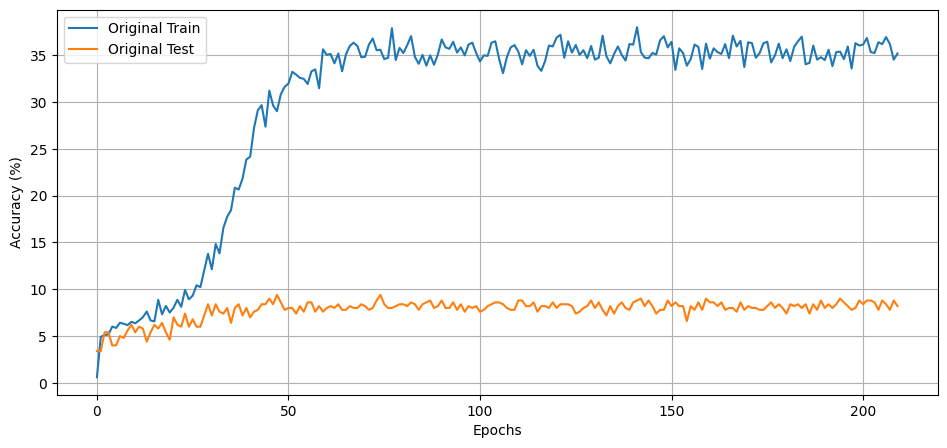

In [ ]:
accuracy_list = [(original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Depth

In [ ]:
reduced_depth_accuracies_train_birds, reduced_depth_accuracies_test_birds, reduced_depth_time_birds = trainEfficientNet(reduced_depth_model, birds_train_loader, birds_test_loader)

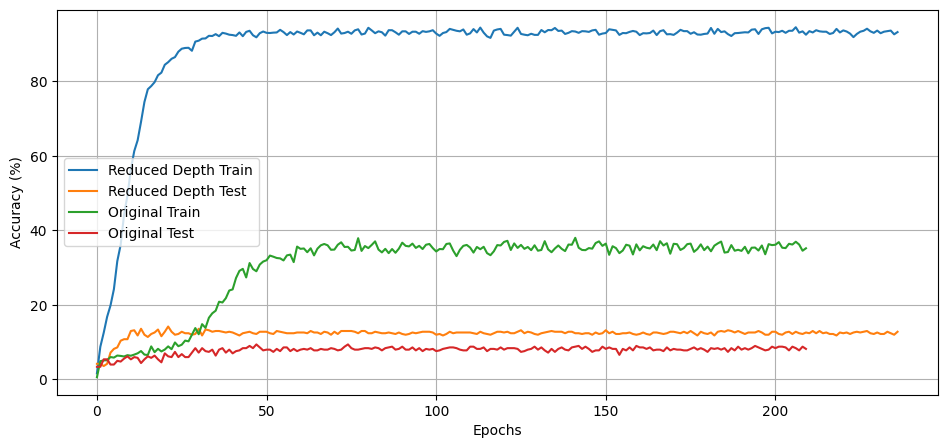

In [ ]:
accuracy_list = [(reduced_depth_accuracies_train_birds, 'Reduced Depth Train'),
                 (reduced_depth_accuracies_test_birds, 'Reduced Depth Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Convulational Block

In [ ]:
half_layers_accuracies_train_birds, half_layers_accuracies_test_birds, half_layers_time_birds = trainEfficientNet(reduced_conv_model, birds_train_loader, birds_test_loader)

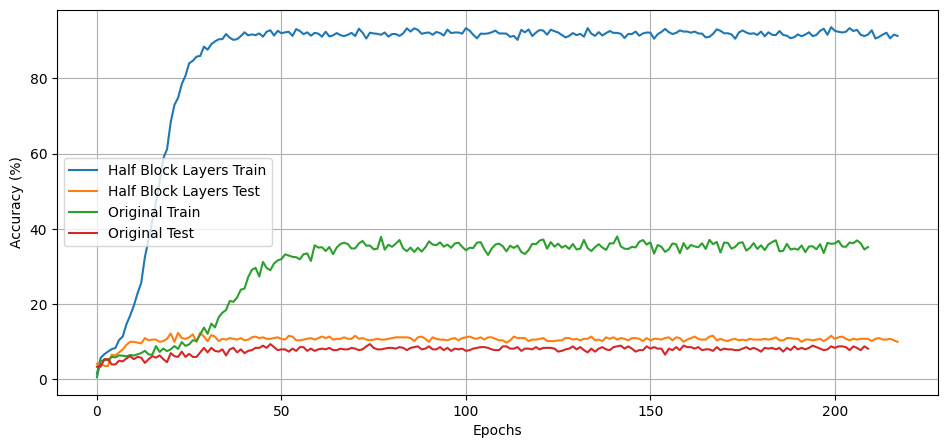

In [ ]:
accuracy_list = [(half_layers_accuracies_train_birds, 'Half Block Layers Train'),
                 (half_layers_accuracies_test_birds, 'Half Block Layers Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Dropout Rate

In [ ]:
dropout_accuracies_train_birds, dropout_accuracies_test_birds, dropout_time_birds = trainEfficientNet(inc_dropout_model, birds_train_loader, birds_test_loader)

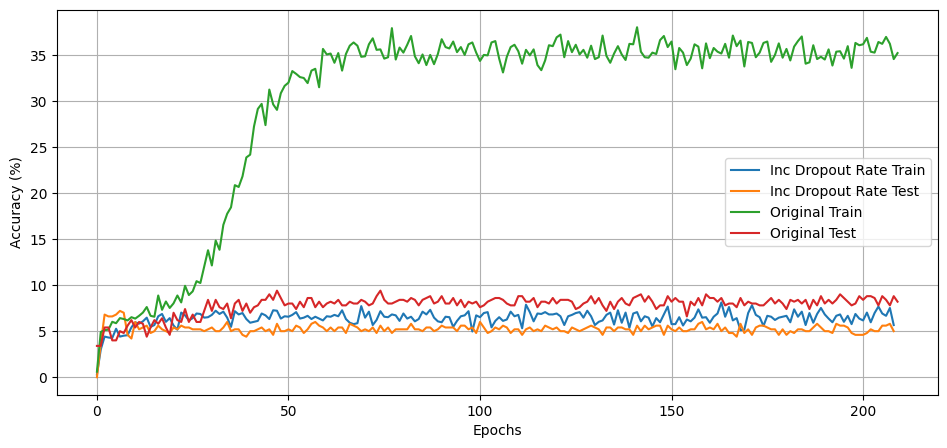

In [ ]:
accuracy_list = [(dropout_accuracies_train_birds, 'Inc Dropout Rate Train'),
                 (dropout_accuracies_test_birds, 'Inc Dropout Rate Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Stochastic Depth

In [ ]:
stochastic_depth_accuracies_train_birds, stochastic_depth_accuracies_test_birds, stochastic_depth_time_birds = trainEfficientNet(inc_stoch_depth_model, birds_train_loader, birds_test_loader)

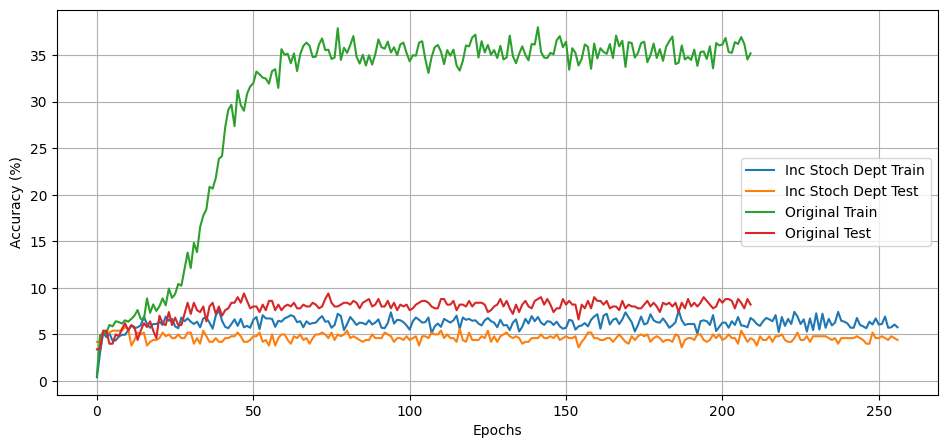

In [ ]:
accuracy_list = [(stochastic_depth_accuracies_train_birds, 'Inc Stoch Dept Train'),
                 (stochastic_depth_accuracies_test_birds, 'Inc Stoch Dept Test'),
                 (original_accuracies_train_birds, 'Original Train'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list)

### Summary

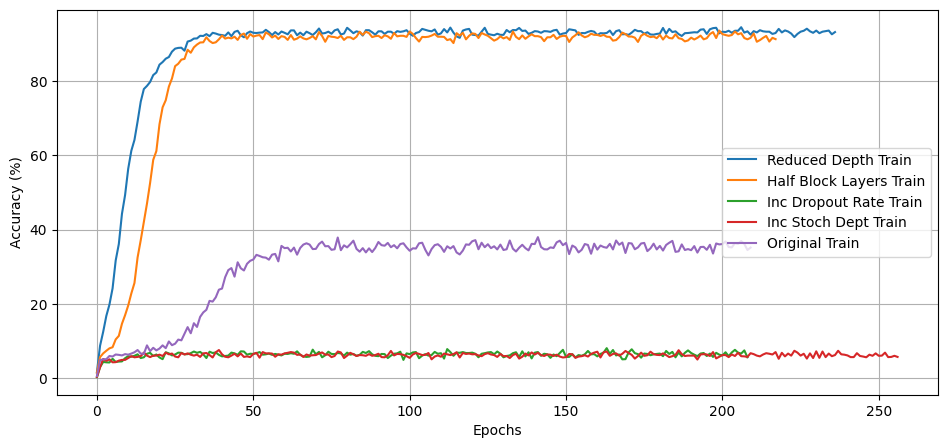

In [ ]:
# Training Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_train_birds, 'Reduced Depth Train'),
    (half_layers_accuracies_train_birds, 'Half Block Layers Train'),
    (dropout_accuracies_train_birds, 'Inc Dropout Rate Train'),
    (stochastic_depth_accuracies_train_birds, 'Inc Stoch Dept Train'),
                 (original_accuracies_train_birds, 'Original Train')]

plot_accuracies(accuracy_list)

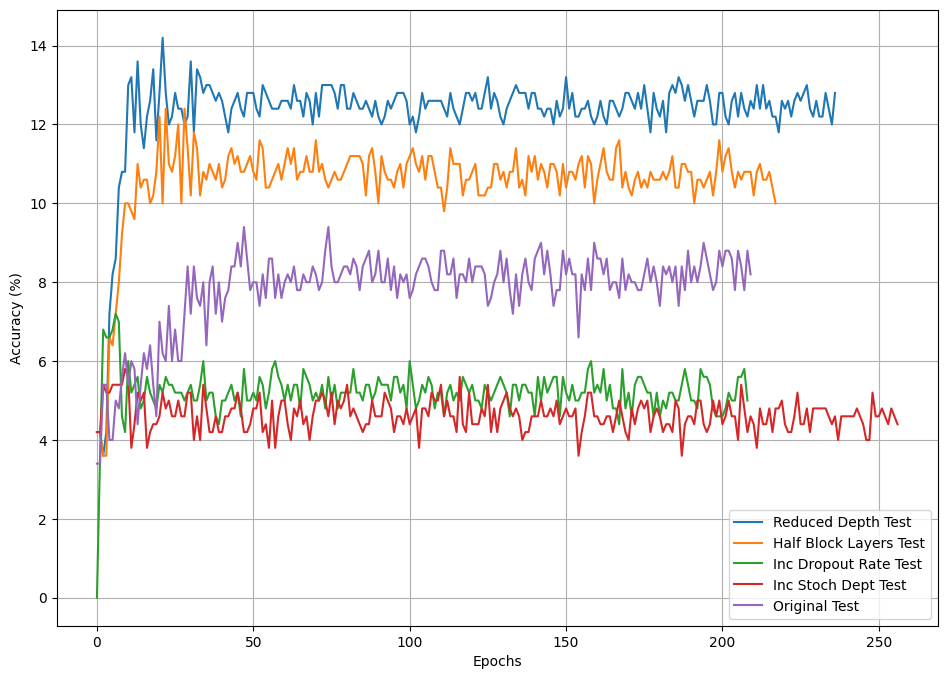

In [ ]:
# Testing Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_test_birds, 'Reduced Depth Test'),
    (half_layers_accuracies_test_birds, 'Half Block Layers Test'),
    (dropout_accuracies_test_birds, 'Inc Dropout Rate Test'),
    (stochastic_depth_accuracies_test_birds, 'Inc Stoch Dept Test'),
                 (original_accuracies_test_birds, 'Original Test')]

plot_accuracies(accuracy_list, figsize=(25, 8))

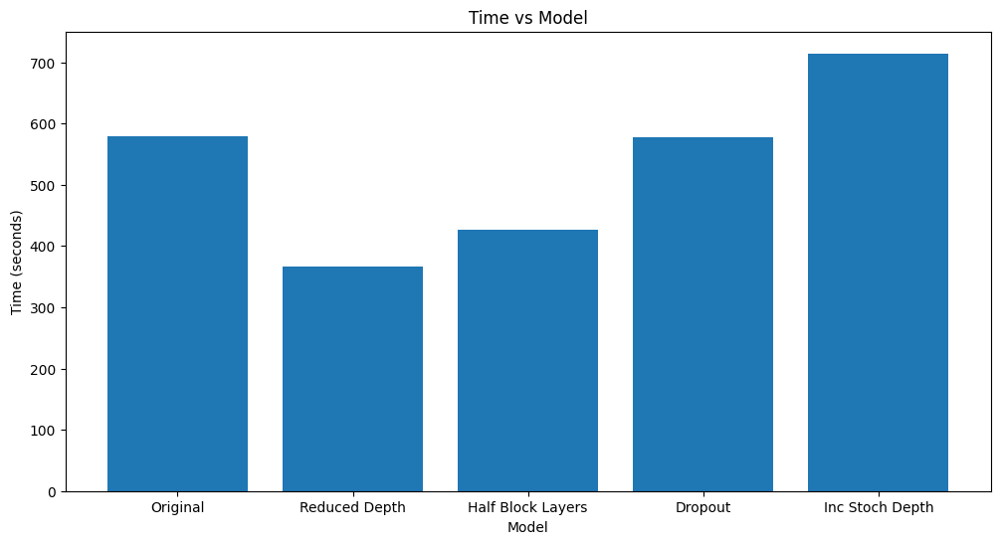

In [ ]:
# Model speed comparison

time_label_list = [(original_time_birds, 'Original'), (reduced_depth_time_birds, 'Reduced Depth'), (half_layers_time_birds, 'Half Block Layers'), (dropout_time_birds, "Dropout"), (stochastic_depth_time_birds, "Inc Stoch Depth")]
plot_bar_chart(time_label_list)


### Memory Cleanup

In [ ]:
del accuracy_list
del reduced_depth_accuracies_test_birds
del reduced_depth_accuracies_train_birds
del half_layers_accuracies_test_birds
del half_layers_accuracies_train_birds
del dropout_accuracies_test_birds
del dropout_accuracies_train_birds
del stochastic_depth_accuracies_test_birds
del stochastic_depth_accuracies_train_birds
del original_accuracies_test_birds
del original_accuracies_train_birds

del train_dataset
del test_dataset

## ImageNet 32 x 32 images

### Data Processing ImageNet

In [ ]:
import tensorflow as tf

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torchvision.transforms import ToTensor
import time
import matplotlib.pyplot as plt

import os
import numpy as np
from PIL import Image

In [ ]:
def read_classes():
    """
    Load the ImageNet class names.
    """
    with open("/content/gdrive/MyDrive/LOC_synset_mapping.txt", "r") as f:
        categories = [c.split() for c in [s.strip() for s in f.readlines()]]
    return categories

In [ ]:
mapping = {}

for c in read_classes(): 
  mapping[c[0]] = c[1:]

print(mapping)

{'n01440764': ['tench,', 'Tinca', 'tinca'], 'n01443537': ['goldfish,', 'Carassius', 'auratus'], 'n01484850': ['great', 'white', 'shark,', 'white', 'shark,', 'man-eater,', 'man-eating', 'shark,', 'Carcharodon', 'carcharias'], 'n01491361': ['tiger', 'shark,', 'Galeocerdo', 'cuvieri'], 'n01494475': ['hammerhead,', 'hammerhead', 'shark'], 'n01496331': ['electric', 'ray,', 'crampfish,', 'numbfish,', 'torpedo'], 'n01498041': ['stingray'], 'n01514668': ['cock'], 'n01514859': ['hen'], 'n01518878': ['ostrich,', 'Struthio', 'camelus'], 'n01530575': ['brambling,', 'Fringilla', 'montifringilla'], 'n01531178': ['goldfinch,', 'Carduelis', 'carduelis'], 'n01532829': ['house', 'finch,', 'linnet,', 'Carpodacus', 'mexicanus'], 'n01534433': ['junco,', 'snowbird'], 'n01537544': ['indigo', 'bunting,', 'indigo', 'finch,', 'indigo', 'bird,', 'Passerina', 'cyanea'], 'n01558993': ['robin,', 'American', 'robin,', 'Turdus', 'migratorius'], 'n01560419': ['bulbul'], 'n01580077': ['jay'], 'n01582220': ['magpie'], '

In [ ]:
# Set the computation device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model.
# model = test_efficientnet_v2_s_model()

# Initialize the image preprocess.
# preprocess = transforms.Compose([
#         transforms.Resize((128, 128)),  # Resize the images to size x size
#         transforms.ToTensor()            # Convert the images to PyTorch tensors
#     ]) if train else models.EfficientNet_V2_S_Weights.DEFAULT.transforms()

# TODO: scan images and preprocess
data_list = []
label_list = []

for subdir, dirs, files in os.walk("./gdrive/MyDrive/imagenette2-160/train/"):
    for i, file in enumerate(files):
        # Check if the file has a valid image extension
        file_extension = os.path.splitext(file)[-1].lower()
        if file_extension not in ['.jpg', '.jpeg', '.png']:
            continue

        # Open the image using Pillow library
        if i < 100:
          img_path = os.path.join(subdir, file)
          img = Image.open(img_path)
          if img.mode == 'RGB':
            # Convert the image to a numpy array and add it to the data list
            # img_array = np.asarray(preprocess(img))
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            # Add the label to the label list
            label_list.append(label)

# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

print(np.shape(data_array))
print(np.shape(label_array))

(982,)
(982,)


<ipython-input-34-1f895ce8b8fd>:40: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
# Split data into train and test set.
X_train, X_test, y_train, y_test = split_data(data_array, label_array)

# Load the ImageNet class names.
classes = list(mapping.keys())
# Count number of classes
num_classes = len(classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataset = transform_dataset(X_train, y_train)
test_dataset = transform_dataset(X_test, y_test)

imageNet_train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
imageNet_test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

# Cleanup
del X_train
del X_test
del y_train
del y_test
del data_list
del label_list
del data_array
del label_array

### Original Loop

In [ ]:
original_accuracies_train_imageNet, original_accuracies_test_imageNet, original_time_imageNet = trainEfficientNet(original_model, imageNet_train_loader, imageNet_test_loader)

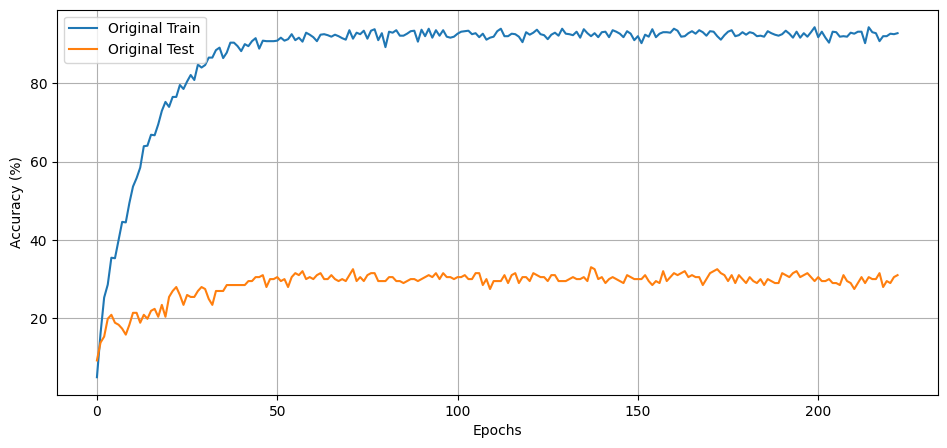

In [ ]:
accuracy_list = [(original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Depth

In [ ]:
reduced_depth_accuracies_train_imageNet, reduced_depth_accuracies_test_imageNet, reduced_depth_time_imageNet = trainEfficientNet(reduced_depth_model, imageNet_train_loader, imageNet_test_loader)

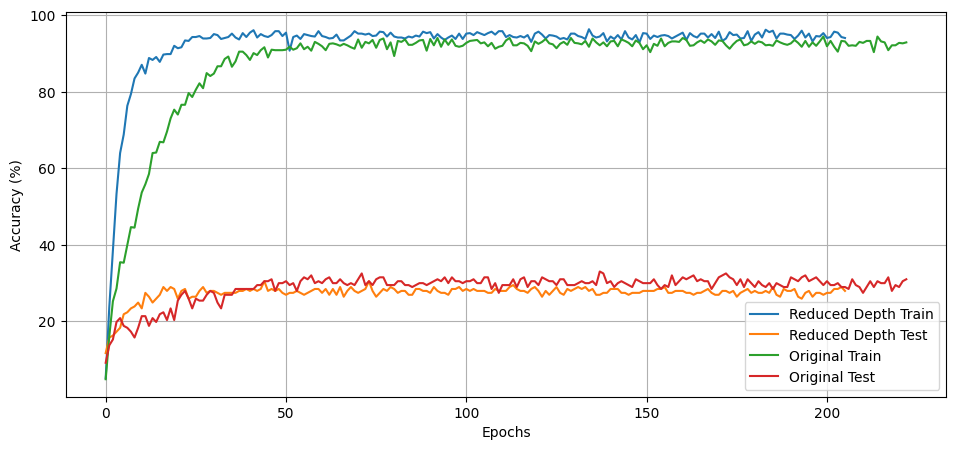

In [ ]:
accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
                 (reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Convulational Block

In [ ]:
half_layers_accuracies_train_imageNet, half_layers_accuracies_test_imageNet, half_layers_time_imageNet = trainEfficientNet(reduced_conv_model, imageNet_train_loader, imageNet_test_loader)

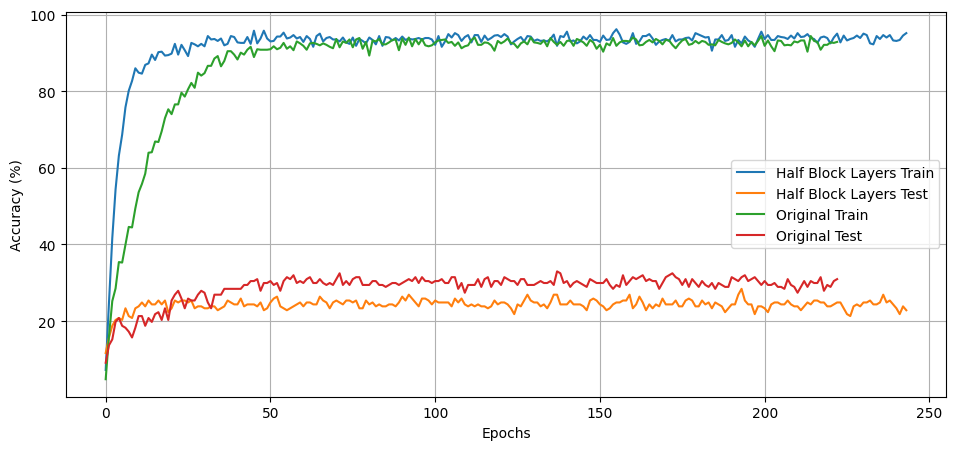

In [ ]:
accuracy_list = [(half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
                 (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Dropout Rate

In [ ]:
dropout_accuracies_train_imageNet, dropout_accuracies_test_imageNet, dropout_time_imageNet = trainEfficientNet(inc_dropout_model, imageNet_train_loader, imageNet_test_loader)

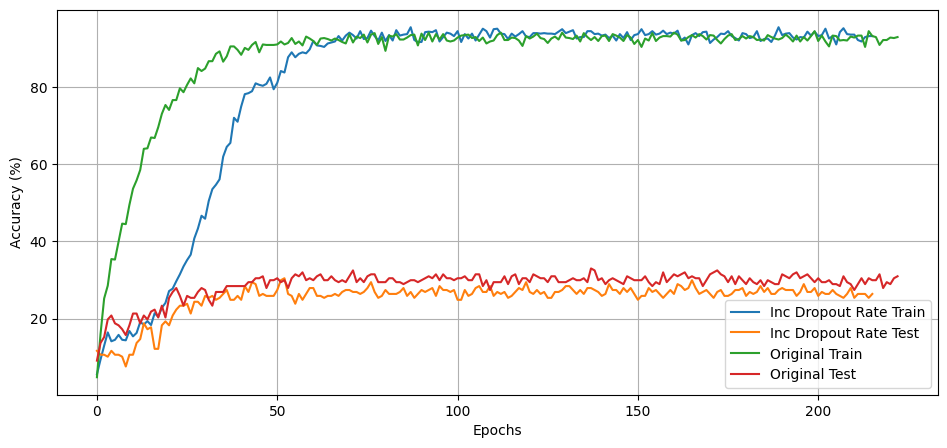

In [ ]:
accuracy_list = [(dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
                 (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Stochastic Depth

In [ ]:
stochastic_depth_accuracies_train_imageNet, stochastic_depth_accuracies_test_imageNet, stochastic_depth_time_imageNet = trainEfficientNet(inc_stoch_depth_model, imageNet_train_loader, imageNet_test_loader)

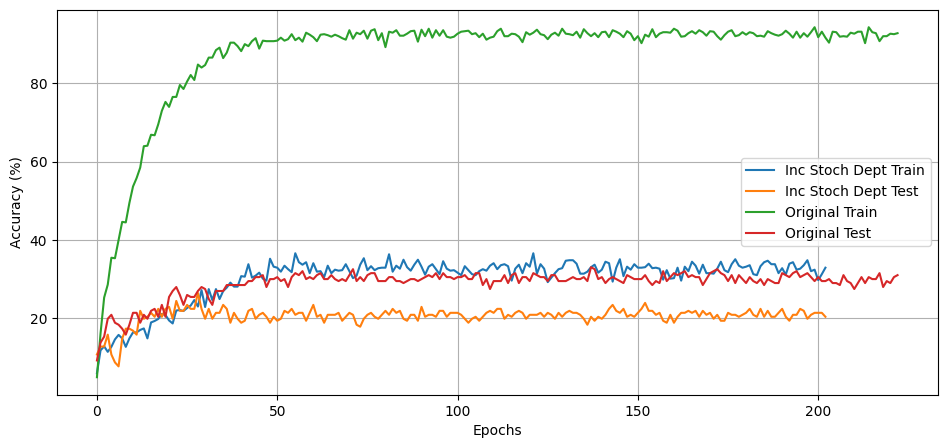

In [ ]:
accuracy_list = [(stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Summary

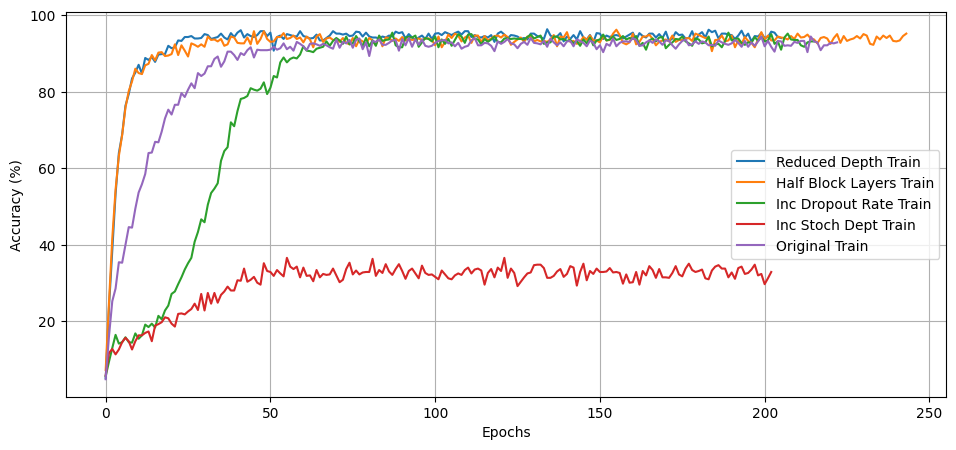

In [ ]:
# Training Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
    (half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
    (dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
    (stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (original_accuracies_train_imageNet, 'Original Train')]

plot_accuracies(accuracy_list)

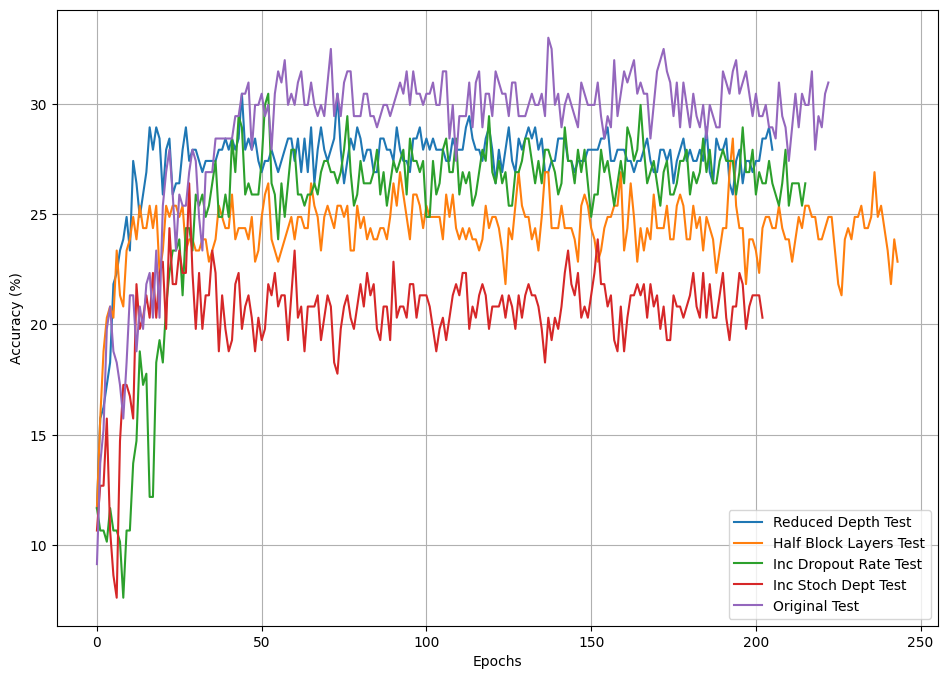

In [ ]:
# Testing Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
    (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
    (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
    (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list, figsize=(25, 8))

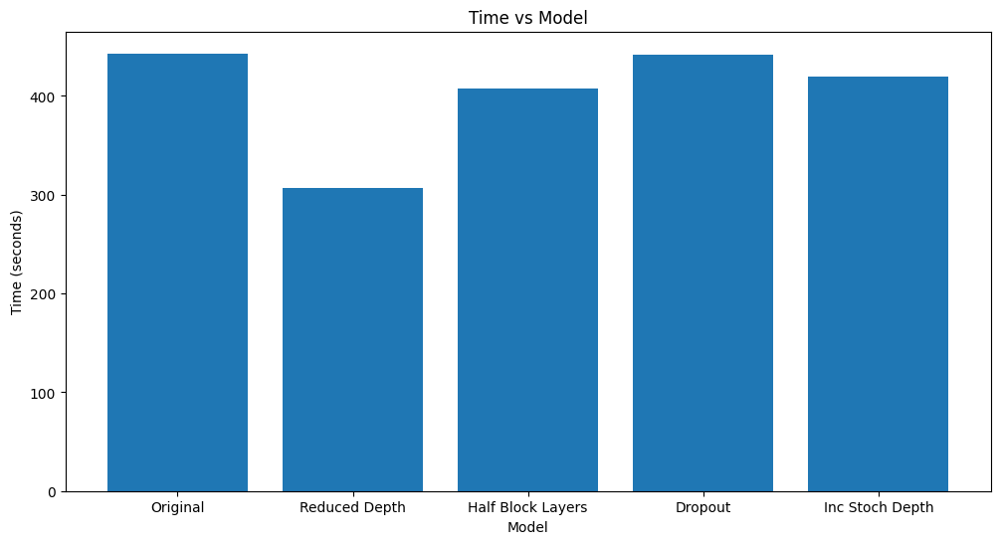

In [ ]:
# Model speed comparison

time_label_list = [(original_time_imageNet, 'Original'), (reduced_depth_time_imageNet, 'Reduced Depth'), (half_layers_time_imageNet, 'Half Block Layers'), (dropout_time_imageNet, "Dropout"), (stochastic_depth_time_imageNet, "Inc Stoch Depth")]
plot_bar_chart(time_label_list)

### Memory Cleanup

In [ ]:
del accuracy_list
del reduced_depth_accuracies_test_imageNet
del reduced_depth_accuracies_train_imageNet
del half_layers_accuracies_test_imageNet
del half_layers_accuracies_train_imageNet
del dropout_accuracies_test_imageNet
del dropout_accuracies_train_imageNet
del stochastic_depth_accuracies_test_imageNet
del stochastic_depth_accuracies_train_imageNet
del original_accuracies_test_imageNet
del original_accuracies_train_imageNet

del train_dataset
del test_dataset

## ImageNet 128 x 128 images

### Data Processing ImageNet

In [ ]:
import tensorflow as tf

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR10
from torchvision.transforms import ToTensor
import time
import matplotlib.pyplot as plt

import os
import numpy as np
from PIL import Image

In [ ]:
def read_classes():
    """
    Load the ImageNet class names.
    """
    with open("/content/gdrive/MyDrive/LOC_synset_mapping.txt", "r") as f:
        categories = [c.split() for c in [s.strip() for s in f.readlines()]]
    return categories

In [ ]:
mapping = {}

for c in read_classes(): 
  mapping[c[0]] = c[1:]

print(mapping)

{'n01440764': ['tench,', 'Tinca', 'tinca'], 'n01443537': ['goldfish,', 'Carassius', 'auratus'], 'n01484850': ['great', 'white', 'shark,', 'white', 'shark,', 'man-eater,', 'man-eating', 'shark,', 'Carcharodon', 'carcharias'], 'n01491361': ['tiger', 'shark,', 'Galeocerdo', 'cuvieri'], 'n01494475': ['hammerhead,', 'hammerhead', 'shark'], 'n01496331': ['electric', 'ray,', 'crampfish,', 'numbfish,', 'torpedo'], 'n01498041': ['stingray'], 'n01514668': ['cock'], 'n01514859': ['hen'], 'n01518878': ['ostrich,', 'Struthio', 'camelus'], 'n01530575': ['brambling,', 'Fringilla', 'montifringilla'], 'n01531178': ['goldfinch,', 'Carduelis', 'carduelis'], 'n01532829': ['house', 'finch,', 'linnet,', 'Carpodacus', 'mexicanus'], 'n01534433': ['junco,', 'snowbird'], 'n01537544': ['indigo', 'bunting,', 'indigo', 'finch,', 'indigo', 'bird,', 'Passerina', 'cyanea'], 'n01558993': ['robin,', 'American', 'robin,', 'Turdus', 'migratorius'], 'n01560419': ['bulbul'], 'n01580077': ['jay'], 'n01582220': ['magpie'], '

In [ ]:
# Set the computation device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the model.
# model = test_efficientnet_v2_s_model()

# Initialize the image preprocess.
# preprocess = transforms.Compose([
#         transforms.Resize((128, 128)),  # Resize the images to size x size
#         transforms.ToTensor()            # Convert the images to PyTorch tensors
#     ]) if train else models.EfficientNet_V2_S_Weights.DEFAULT.transforms()

# TODO: scan images and preprocess
data_list = []
label_list = []

for subdir, dirs, files in os.walk("./gdrive/MyDrive/imagenette2-160/train/"):
    for i, file in enumerate(files):
        # Check if the file has a valid image extension
        file_extension = os.path.splitext(file)[-1].lower()
        if file_extension not in ['.jpg', '.jpeg', '.png']:
            continue

        # Open the image using Pillow library
        if i < 100:
          img_path = os.path.join(subdir, file)
          img = Image.open(img_path)
          if img.mode == 'RGB':
            # Convert the image to a numpy array and add it to the data list
            # img_array = np.asarray(preprocess(img))
            img_array = np.asarray(img)
            data_list.append(img_array)
            
            # Get the label from the Directory name
            label = os.path.basename(subdir)
            # Add the label to the label list
            label_list.append(label)

# Convert the data list and label list to numpy arrays
data_array = np.array(data_list)
label_array = np.array(label_list)

print(np.shape(data_array))
print(np.shape(label_array))

(982,)
(982,)


<ipython-input-53-1f895ce8b8fd>:40: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_array = np.array(data_list)


In [ ]:
# Split data into train and test set.
X_train, X_test, y_train, y_test = split_data(data_array, label_array)

# Load the ImageNet class names.
classes = list(mapping.keys())
# Count number of classes
num_classes = len(classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataset = transform_dataset(X_train, y_train, 128)
test_dataset = transform_dataset(X_test, y_test, 128)

imageNet_train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
imageNet_test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=2)

# Cleanup
del X_train
del X_test
del y_train
del y_test
del data_list
del label_list
del data_array
del label_array

### Original Loop

In [ ]:
original_accuracies_train_imageNet, original_accuracies_test_imageNet, original_time_imageNet = trainEfficientNet(original_model, imageNet_train_loader, imageNet_test_loader)

Epoch: 1, Train Accuracy: 14.39%
Epoch: 1, Test Accuracy: 9.14%
Epoch: 2, Train Accuracy: 15.80%
Epoch: 2, Test Accuracy: 21.83%
Epoch: 3, Train Accuracy: 21.91%
Epoch: 3, Test Accuracy: 21.83%
Epoch: 4, Train Accuracy: 24.08%
Epoch: 4, Test Accuracy: 27.41%
Epoch: 5, Train Accuracy: 30.70%
Epoch: 5, Test Accuracy: 25.89%
Epoch: 6, Train Accuracy: 33.89%
Epoch: 6, Test Accuracy: 25.38%
Epoch: 7, Train Accuracy: 36.94%
Epoch: 7, Test Accuracy: 25.38%
Epoch: 8, Train Accuracy: 42.68%
Epoch: 8, Test Accuracy: 31.98%
Epoch: 9, Train Accuracy: 47.26%
Epoch: 9, Test Accuracy: 34.01%
Epoch: 10, Train Accuracy: 53.25%
Epoch: 10, Test Accuracy: 30.46%
Epoch: 11, Train Accuracy: 57.83%
Epoch: 11, Test Accuracy: 31.47%
Epoch: 12, Train Accuracy: 64.71%
Epoch: 12, Test Accuracy: 28.43%
Epoch: 13, Train Accuracy: 68.54%
Epoch: 13, Test Accuracy: 31.47%
Epoch: 14, Train Accuracy: 68.41%
Epoch: 14, Test Accuracy: 25.38%
Epoch: 15, Train Accuracy: 72.99%
Epoch: 15, Test Accuracy: 28.93%
Epoch: 16, Tra

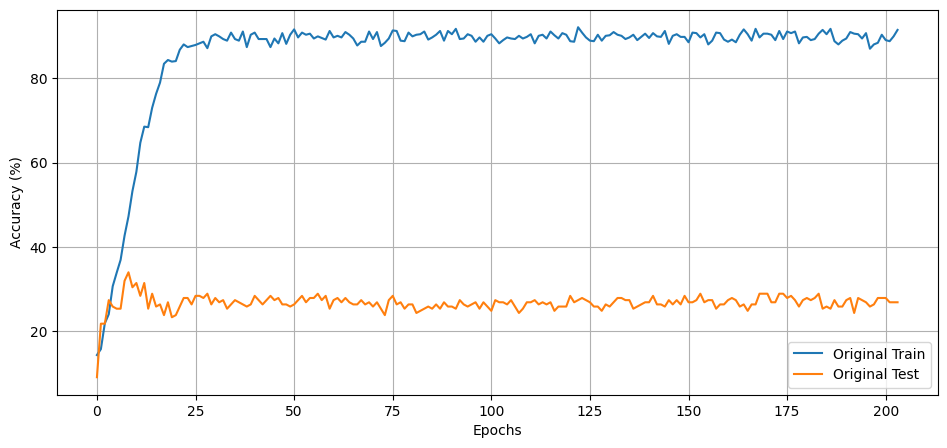

In [ ]:
accuracy_list = [(original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Depth

In [ ]:
reduced_depth_accuracies_train_imageNet, reduced_depth_accuracies_test_imageNet, reduced_depth_time_imageNet = trainEfficientNet(reduced_depth_model, imageNet_train_loader, imageNet_test_loader)

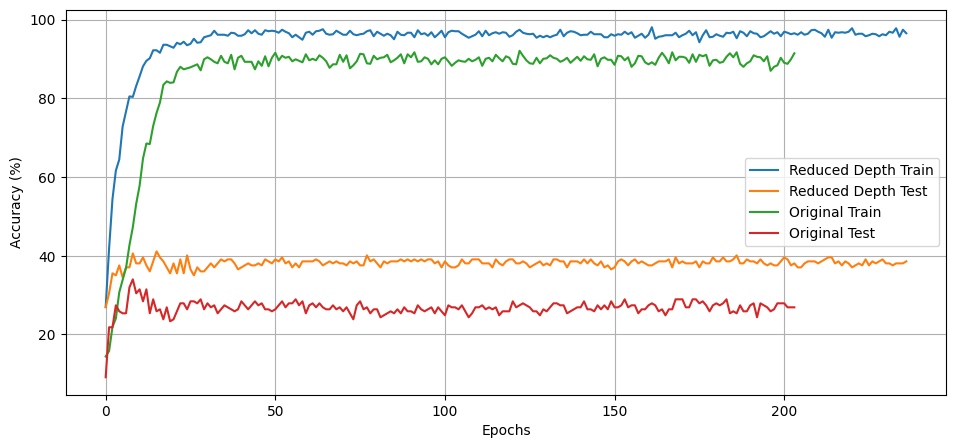

In [ ]:
accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
                 (reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Reduced Convulational Block

In [ ]:
half_layers_accuracies_train_imageNet, half_layers_accuracies_test_imageNet, half_layers_time_imageNet = trainEfficientNet(reduced_conv_model, imageNet_train_loader, imageNet_test_loader)

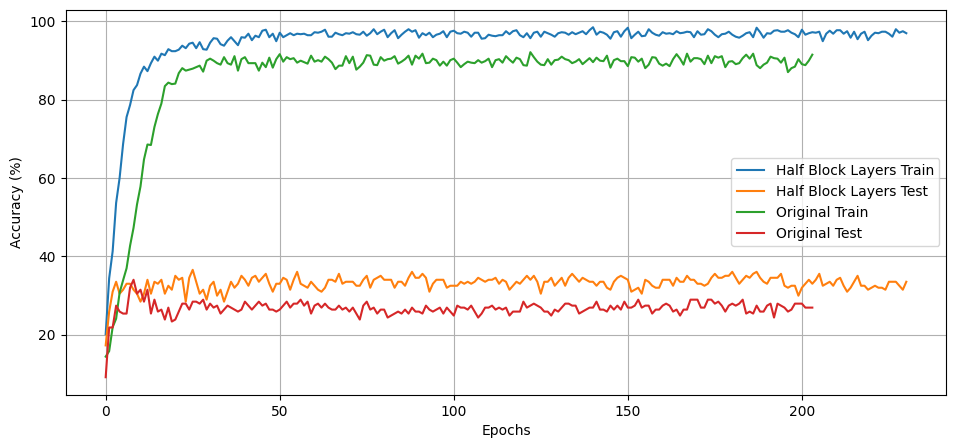

In [ ]:
accuracy_list = [(half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
                 (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Dropout Rate

In [ ]:
dropout_accuracies_train_imageNet, dropout_accuracies_test_imageNet, dropout_time_imageNet = trainEfficientNet(inc_dropout_model, imageNet_train_loader, imageNet_test_loader)

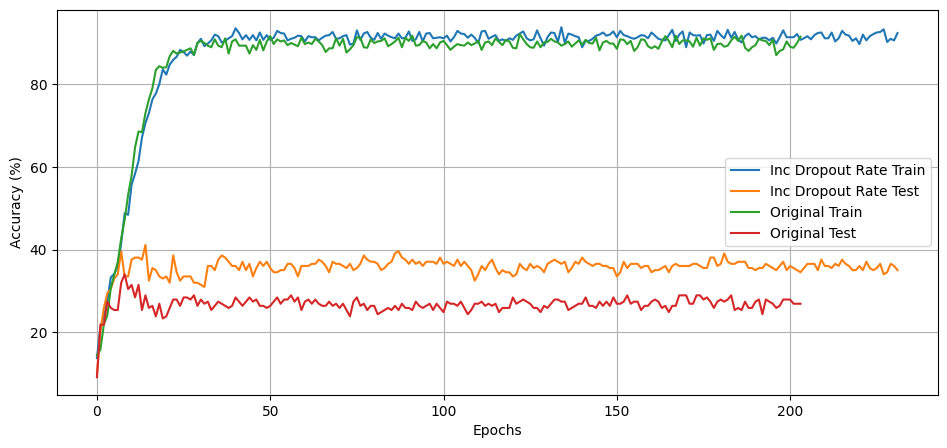

In [ ]:
accuracy_list = [(dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
                 (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Increased Stochastic Depth

In [ ]:
stochastic_depth_accuracies_train_imageNet, stochastic_depth_accuracies_test_imageNet, stochastic_depth_time_imageNet = trainEfficientNet(inc_stoch_depth_model, imageNet_train_loader, imageNet_test_loader)

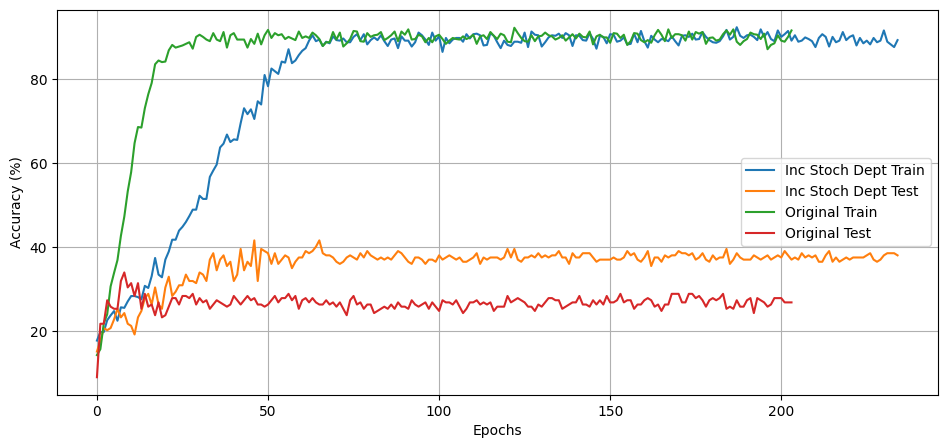

In [ ]:
accuracy_list = [(stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_train_imageNet, 'Original Train'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list)

### Summary

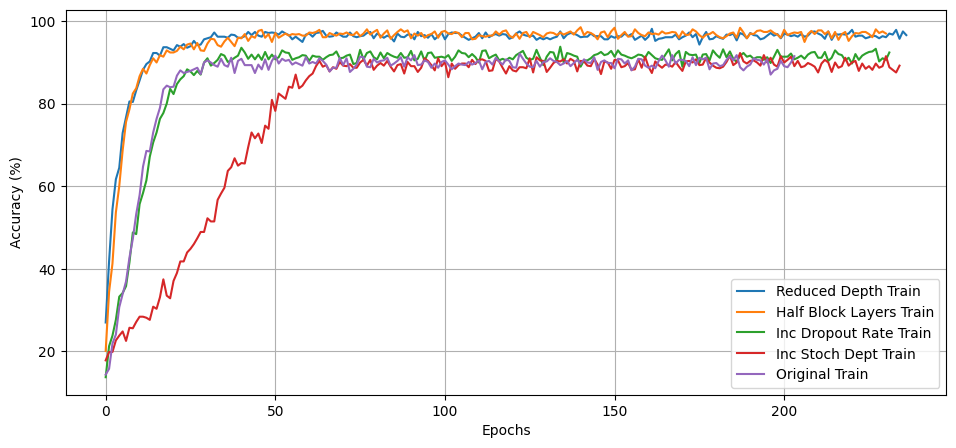

In [ ]:
# Training Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_train_imageNet, 'Reduced Depth Train'),
    (half_layers_accuracies_train_imageNet, 'Half Block Layers Train'),
    (dropout_accuracies_train_imageNet, 'Inc Dropout Rate Train'),
    (stochastic_depth_accuracies_train_imageNet, 'Inc Stoch Dept Train'),
                 (original_accuracies_train_imageNet, 'Original Train')]

plot_accuracies(accuracy_list)

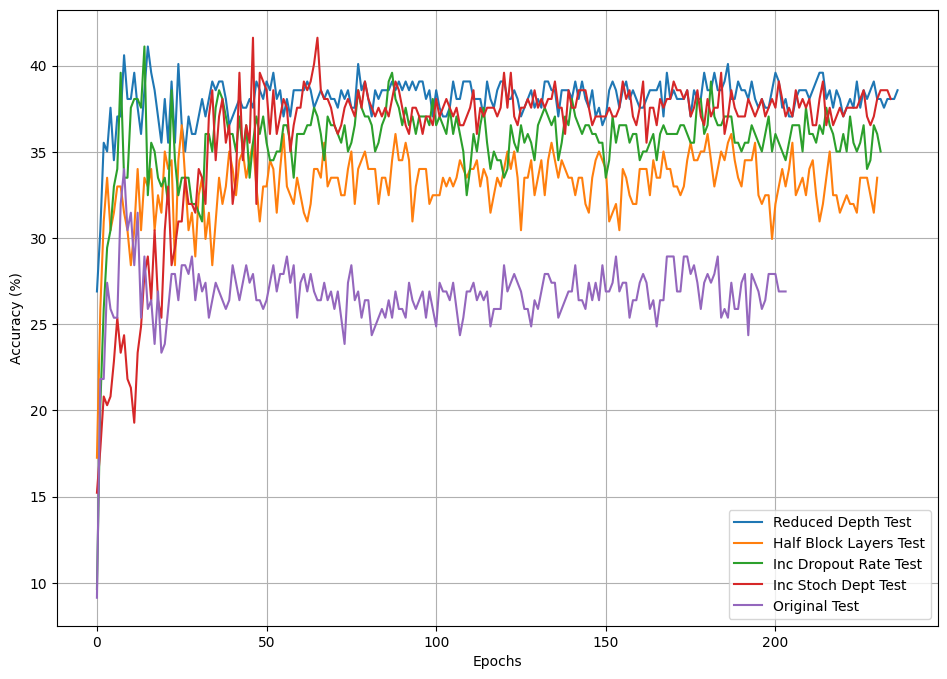

In [ ]:
# Testing Accuracy Summary

accuracy_list = [(reduced_depth_accuracies_test_imageNet, 'Reduced Depth Test'),
    (half_layers_accuracies_test_imageNet, 'Half Block Layers Test'),
    (dropout_accuracies_test_imageNet, 'Inc Dropout Rate Test'),
    (stochastic_depth_accuracies_test_imageNet, 'Inc Stoch Dept Test'),
                 (original_accuracies_test_imageNet, 'Original Test')]

plot_accuracies(accuracy_list, figsize=(25, 8))

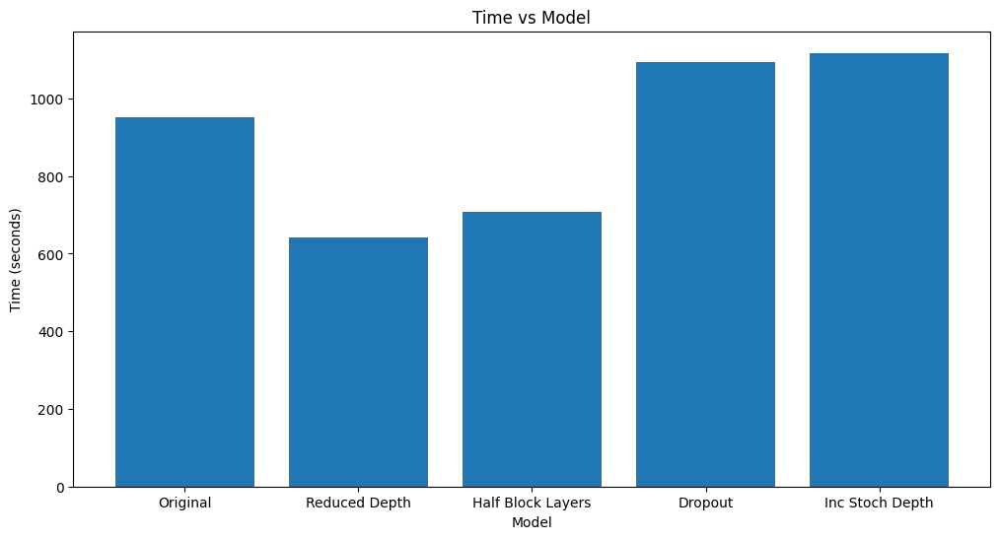

In [ ]:
# Model speed comparison

time_label_list = [(original_time_imageNet, 'Original'), (reduced_depth_time_imageNet, 'Reduced Depth'), (half_layers_time_imageNet, 'Half Block Layers'), (dropout_time_imageNet, "Dropout"), (stochastic_depth_time_imageNet, "Inc Stoch Depth")]
plot_bar_chart(time_label_list)

### Memory Cleanup

In [ ]:
del accuracy_list
del reduced_depth_accuracies_test_imageNet
del reduced_depth_accuracies_train_imageNet
del half_layers_accuracies_test_imageNet
del half_layers_accuracies_train_imageNet
del dropout_accuracies_test_imageNet
del dropout_accuracies_train_imageNet
del stochastic_depth_accuracies_test_imageNet
del stochastic_depth_accuracies_train_imageNet
del original_accuracies_test_imageNet
del original_accuracies_train_imageNet

del train_dataset
del test_dataset